#  1) Load Dataset

In [1]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [2]:
import pandas as pd

df = pd.read_csv('/content/drive/MyDrive/Student Performance Prediction/StudentPerformanceFactors_train.csv')
df.head()


,Hours_Studied,Attendance,Parental_Involvement,Access_to_Resources,Extracurricular_Activities,Sleep_Hours,Previous_Scores,Motivation_Level,Internet_Access,Tutoring_Sessions,Family_Income,Teacher_Quality,School_Type,Peer_Influence,Physical_Activity,Learning_Disabilities,Parental_Education_Level,Distance_from_Home,Gender,Exam_Score
0,23,84,Low,High,No,7,73,Low,Yes,0,Low,Medium,Public,Positive,3,No,High School,Near,Male,67
1,19,64,Low,Medium,No,8,59,Low,Yes,2,Medium,Medium,Public,Negative,4,No,College,Moderate,Female,61
2,24,98,Medium,Medium,Yes,7,91,Medium,Yes,2,Medium,Medium,Public,Neutral,4,No,Postgraduate,Near,Male,74
3,29,89,Low,Medium,Yes,8,98,Medium,Yes,1,Medium,Medium,Public,Negative,4,No,High School,Moderate,Male,71
4,19,92,Medium,Medium,Yes,6,65,Medium,Yes,3,Medium,High,Public,Neutral,4,No,College,Near,Female,70


# 2) Features & Target (with binning to classes)

In [3]:
if "Exam_Score" not in df.columns:
    raise ValueError("Expected column 'Exam_Score' not found in dataset.")

# Decide bins using quantiles (3 classes: low/medium/high)
df['Exam_Label'] = pd.qcut(df['Exam_Score'], q=3, labels=["low", "medium", "high"])
# If you prefer custom thresholds use pd.cut instead.

# Feature matrix and target
X = df.drop(columns=["Exam_Score", "Exam_Label"])
y = df["Exam_Label"].astype(str)   # ensure string labels for classifiers

print("Class distribution:")
display(y.value_counts())

Class distribution:


,count
Exam_Label,
low,2836
medium,2078
high,1593


# 3) Detect numeric / categorical columns

In [4]:
num_cols = X.select_dtypes(include=['int64','float64']).columns.tolist()
cat_cols = X.select_dtypes(include=['object', 'category', 'bool']).columns.tolist()

print("Numeric columns:", num_cols)
print("Categorical columns:", cat_cols)

Numeric columns: ['Hours_Studied', 'Attendance', 'Sleep_Hours', 'Previous_Scores', 'Tutoring_Sessions', 'Physical_Activity']
Categorical columns: ['Parental_Involvement', 'Access_to_Resources', 'Extracurricular_Activities', 'Motivation_Level', 'Internet_Access', 'Family_Income', 'Teacher_Quality', 'School_Type', 'Peer_Influence', 'Learning_Disabilities', 'Parental_Education_Level', 'Distance_from_Home', 'Gender']


# 4) FULL DATA PREPROCESSING PIPELINE


🔹 STEP 4: FULL PREPROCESSING (WITH PCA)

➡ 4.1 Basic Cleaning
✔ Missing values handled

➡ 4.2 Outlier Removal (IQR)
✔ IQR outliers removed

➡ 4.3 Z-score Filtering
✔ Z-score filtering complete

➡ 4.4 Feature–Target Split
✔ X and y aligned: (6040, 19)

➡ 4.5 Skewness Handling
✔ Log transform applied to: []

➡ 4.6 Feature Selection
✔ Feature selection complete

➡ 4.7 Target Encoding
✔ Label mapping: {'high': np.int64(0), 'low': np.int64(1), 'medium': np.int64(2)}

➡ 4.8 Building Preprocessing Pipeline with PCA
✔ Preprocessor + PCA pipeline ready

➡ 4.9 Visualization


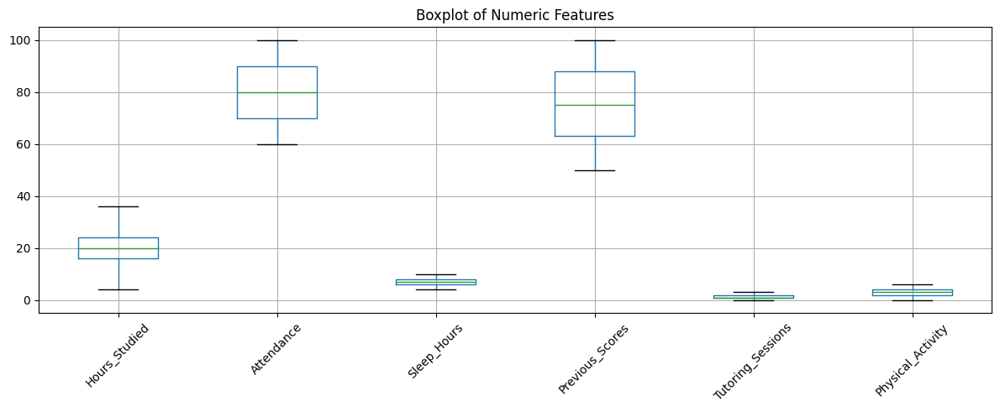

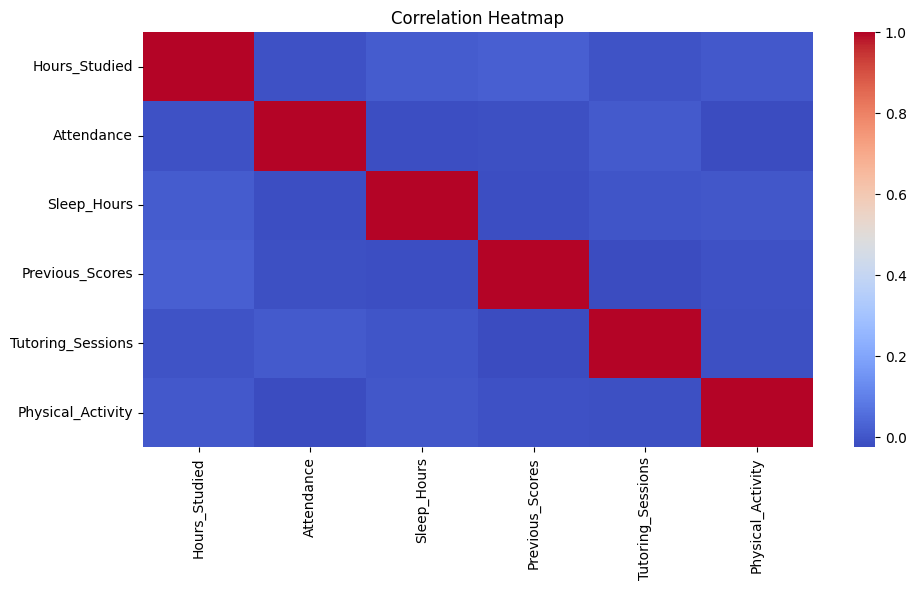

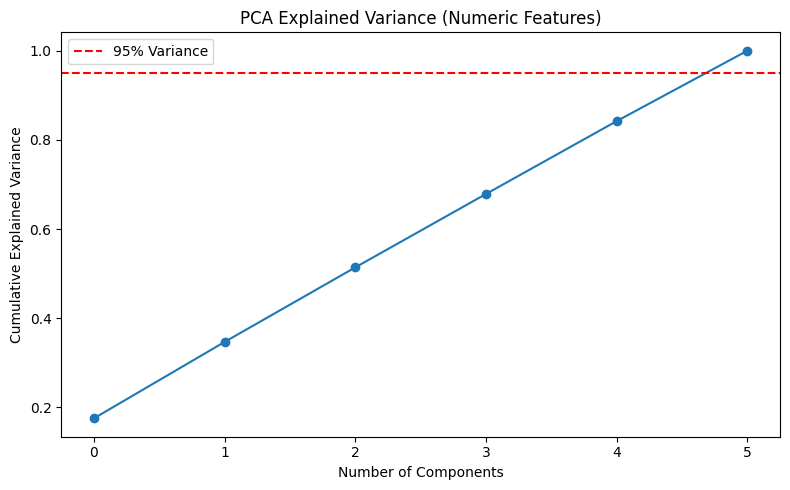


✅ STEP 4 PREPROCESSING COMPLETE
Final X shape: (6040, 19)
Final y length: 6040
Numeric features: 6
Categorical features: 13
✔ READY FOR TRAIN–TEST SPLIT & MODELING


In [5]:
print("\n==============================")
print("🔹 STEP 4: FULL PREPROCESSING (WITH PCA)")
print("==============================")

# ------------------------------------------------------------
# 📌 Imports
# ------------------------------------------------------------
import numpy as np
import pandas as pd
from scipy import stats
from sklearn.preprocessing import LabelEncoder, StandardScaler, OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.feature_selection import VarianceThreshold
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

# ------------------------------------------------------------
# 4.1 BASIC CLEANING
# ------------------------------------------------------------
print("\n➡ 4.1 Basic Cleaning")

data = df.copy().drop_duplicates()

# Detect column types
num_cols = data.select_dtypes(include=["int64", "float64"]).columns.tolist()
num_cols.remove("Exam_Score")

cat_cols = data.select_dtypes(include=["object", "category", "bool"]).columns.tolist()
cat_cols.remove("Exam_Label")

# Missing values
for col in num_cols:
    data[col] = data[col].fillna(data[col].median())

for col in cat_cols:
    data[col] = data[col].fillna(data[col].mode()[0])

print("✔ Missing values handled")

# ------------------------------------------------------------
# 4.2 OUTLIER REMOVAL (IQR)
# ------------------------------------------------------------
print("\n➡ 4.2 Outlier Removal (IQR)")

def remove_outliers_iqr(df, num_cols, factor=1.5):
    mask = pd.Series(True, index=df.index)
    for col in num_cols:
        Q1, Q3 = df[col].quantile([0.25, 0.75])
        IQR = Q3 - Q1
        mask &= df[col].between(Q1 - factor*IQR, Q3 + factor*IQR)
    return df[mask]

data = remove_outliers_iqr(data, num_cols)
print("✔ IQR outliers removed")

# ------------------------------------------------------------
# 4.3 Z-SCORE FILTERING
# ------------------------------------------------------------
print("\n➡ 4.3 Z-score Filtering")

z_scores = np.abs(stats.zscore(data[num_cols]))
data = data[(z_scores < 3).all(axis=1)]
print("✔ Z-score filtering complete")

# ------------------------------------------------------------
# 4.4 SPLIT FEATURES & TARGET
# ------------------------------------------------------------
print("\n➡ 4.4 Feature–Target Split")

X = data.drop(columns=["Exam_Score", "Exam_Label"])
y = data["Exam_Label"].astype(str)

assert X.shape[0] == y.shape[0]
print("✔ X and y aligned:", X.shape)

# ------------------------------------------------------------
# 4.5 SKEWNESS CORRECTION
# ------------------------------------------------------------
print("\n➡ 4.5 Skewness Handling")

skewed = X[num_cols].skew()
high_skew = skewed[abs(skewed) > 1].index.tolist()

for col in high_skew:
    if (X[col] > 0).all():
        X[col] = np.log1p(X[col])

print("✔ Log transform applied to:", high_skew)

# ------------------------------------------------------------
# 4.6 FEATURE SELECTION
# ------------------------------------------------------------
print("\n➡ 4.6 Feature Selection")

# Correlation filter
corr = X[num_cols].corr().abs()
upper = corr.where(np.triu(np.ones(corr.shape), k=1).astype(bool))
drop_corr = [c for c in upper.columns if any(upper[c] > 0.9)]

X.drop(columns=drop_corr, inplace=True)
num_cols = [c for c in num_cols if c not in drop_corr]

# Variance threshold
vt = VarianceThreshold(0.01)
X[num_cols] = vt.fit_transform(X[num_cols])
num_cols = list(np.array(num_cols)[vt.get_support()])

print("✔ Feature selection complete")

# ------------------------------------------------------------
# 4.7 TARGET ENCODING
# ------------------------------------------------------------
print("\n➡ 4.7 Target Encoding")

le = LabelEncoder()
y_encoded = le.fit_transform(y)

print("✔ Label mapping:", dict(zip(le.classes_, le.transform(le.classes_))))

# ------------------------------------------------------------
# 4.8 PREPROCESSOR PIPELINE + PCA
# ------------------------------------------------------------
print("\n➡ 4.8 Building Preprocessing Pipeline with PCA")

numeric_pipeline = Pipeline([
    ("imputer", SimpleImputer(strategy="median")),
    ("scaler", StandardScaler())
])

categorical_pipeline = Pipeline([
    ("imputer", SimpleImputer(strategy="most_frequent")),
    ("onehot", OneHotEncoder(handle_unknown="ignore"))
])

preprocessor = ColumnTransformer([
    ("num", numeric_pipeline, num_cols),
    ("cat", categorical_pipeline, cat_cols)
])

full_pipeline = Pipeline([
    ("preprocessor", preprocessor),
    ("pca", PCA(n_components=0.95, random_state=42))
])

print("✔ Preprocessor + PCA pipeline ready")

# ------------------------------------------------------------
# 4.9 VISUALIZATION (FIXED)
# ------------------------------------------------------------
print("\n➡ 4.9 Visualization")

# -------- Boxplot --------
plt.figure(figsize=(12,5))
X[num_cols].boxplot()
plt.title("Boxplot of Numeric Features")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# -------- Correlation Heatmap --------
plt.figure(figsize=(10,6))
sns.heatmap(X[num_cols].corr(), cmap="coolwarm")
plt.title("Correlation Heatmap")
plt.tight_layout()
plt.show()

# -------- PCA Explained Variance (NUMERIC ONLY) --------
from sklearn.preprocessing import StandardScaler

X_num_scaled = StandardScaler().fit_transform(X[num_cols])
pca_temp = PCA().fit(X_num_scaled)

plt.figure(figsize=(8,5))
plt.plot(np.cumsum(pca_temp.explained_variance_ratio_), marker="o")
plt.axhline(0.95, color="red", linestyle="--", label="95% Variance")
plt.xlabel("Number of Components")
plt.ylabel("Cumulative Explained Variance")
plt.title("PCA Explained Variance (Numeric Features)")
plt.legend()
plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# FINAL SUMMARY
# ------------------------------------------------------------
print("\n==============================")
print("✅ STEP 4 PREPROCESSING COMPLETE")
print("==============================")
print("Final X shape:", X.shape)
print("Final y length:", len(y_encoded))
print("Numeric features:", len(num_cols))
print("Categorical features:", len(cat_cols))
print("✔ READY FOR TRAIN–TEST SPLIT & MODELING")


#  5) Train–Test Split, SMOTE – Balance Target Classes


🧩 STEP 5: FEATURE ENGINEERING + PCA + SMOTE
Target mapping: {'high': np.int64(0), 'low': np.int64(1), 'medium': np.int64(2)}
Processed Train Shape: (4832, 35)
Processed Test Shape : (1208, 35)

Balanced Class Distribution:
0    2159
1    2159
2    2159
Name: count, dtype: int64


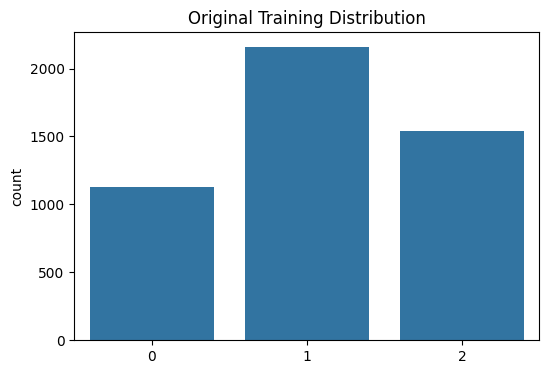

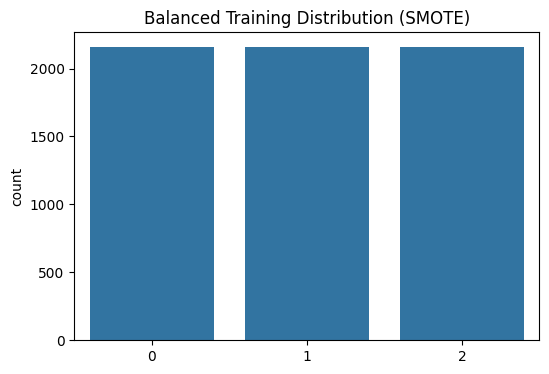

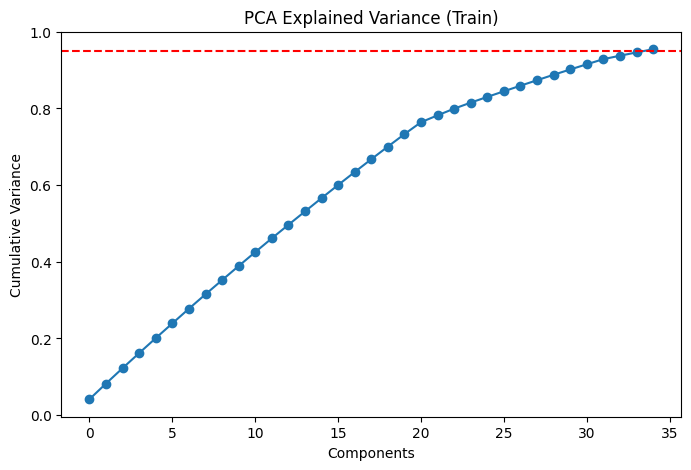


✅ STEP 5 COMPLETE — DATA READY FOR MODELS


In [7]:
# ============================================================
# 🧩 STEP 5: FEATURE ENGINEERING + PCA + SMOTE (ONE CELL)
# ============================================================

print("\n=====================================")
print("🧩 STEP 5: FEATURE ENGINEERING + PCA + SMOTE")
print("=====================================")

# ----------------------------
# Imports
# ----------------------------
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import (
    LabelEncoder, StandardScaler, OneHotEncoder,
    PowerTransformer, PolynomialFeatures
)
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA
from sklearn.feature_selection import SelectKBest, mutual_info_classif, chi2
from sklearn.impute import SimpleImputer
from imblearn.over_sampling import SMOTE

# ----------------------------
# Target & Features
# ----------------------------
X = data.drop(columns=["Exam_Score", "Exam_Label"])
y = data["Exam_Label"].astype(str)

le = LabelEncoder()
y_enc = le.fit_transform(y)

print("Target mapping:", dict(zip(le.classes_, le.transform(le.classes_))))

# ----------------------------
# Train–Test Split (STRATIFIED)
# ----------------------------
X_train, X_test, y_train, y_test = train_test_split(
    X, y_enc,
    test_size=0.2,
    stratify=y_enc,
    random_state=42
)

# ----------------------------
# Detect Column Types (TRAIN)
# ----------------------------
num_cols = X_train.select_dtypes(include=["int64", "float64"]).columns.tolist()
cat_cols = X_train.select_dtypes(include=["object", "category", "bool"]).columns.tolist()

# ----------------------------
# Numeric Pipeline
# ----------------------------
numeric_pipeline = Pipeline([
    ("imputer", SimpleImputer(strategy="median")),
    ("power", PowerTransformer(method="yeo-johnson")),
    ("poly", PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)),
    ("scaler", StandardScaler()),
    ("select", SelectKBest(mutual_info_classif, k="all"))
])

# ----------------------------
# Categorical Pipeline
# ----------------------------
categorical_pipeline = Pipeline([
    ("imputer", SimpleImputer(strategy="most_frequent")),
    ("onehot", OneHotEncoder(handle_unknown="ignore")),
    ("select", SelectKBest(chi2, k="all"))
])

# ----------------------------
# Full Pipeline + PCA
# ----------------------------
preprocessor = ColumnTransformer([
    ("num", numeric_pipeline, num_cols),
    ("cat", categorical_pipeline, cat_cols)
])

full_pipeline = Pipeline([
    ("preprocessor", preprocessor),
    ("pca", PCA(n_components=0.95, random_state=42))
])

# ----------------------------
# Fit on TRAIN only
# ----------------------------
X_train_proc = full_pipeline.fit_transform(X_train, y_train)
X_test_proc  = full_pipeline.transform(X_test)

print("Processed Train Shape:", X_train_proc.shape)
print("Processed Test Shape :", X_test_proc.shape)

# ----------------------------
# Apply SMOTE (TRAIN ONLY)
# ----------------------------
smote = SMOTE(random_state=42)
X_train_bal, y_train_bal = smote.fit_resample(X_train_proc, y_train)

print("\nBalanced Class Distribution:")
print(pd.Series(y_train_bal).value_counts())

# ----------------------------
# Visualization
# ----------------------------
plt.figure(figsize=(6,4))
sns.countplot(x=y_train)
plt.title("Original Training Distribution")
plt.show()

plt.figure(figsize=(6,4))
sns.countplot(x=y_train_bal)
plt.title("Balanced Training Distribution (SMOTE)")
plt.show()

pca = full_pipeline.named_steps["pca"]
plt.figure(figsize=(8,5))
plt.plot(np.cumsum(pca.explained_variance_ratio_), marker="o")
plt.axhline(0.95, color="red", linestyle="--")
plt.title("PCA Explained Variance (Train)")
plt.xlabel("Components")
plt.ylabel("Cumulative Variance")
plt.show()

print("\n✅ STEP 5 COMPLETE — DATA READY FOR MODELS")


# 6)Feature Significance Analysis ( ANOVA, Chi-Square)


📊 STEP 6: STATISTICAL SIGNIFICANCE TESTS

ANOVA Results:


,Feature,F-Statistic,p-value
1,Attendance,1589.721451,0.000000e+00
0,Hours_Studied,555.387706,8.044498e-218
3,Previous_Scores,69.242181,2.247099e-30
4,Tutoring_Sessions,39.596032,8.772890e-18
5,Physical_Activity,1.986424,1.372972e-01
2,Sleep_Hours,0.398453,6.713798e-01


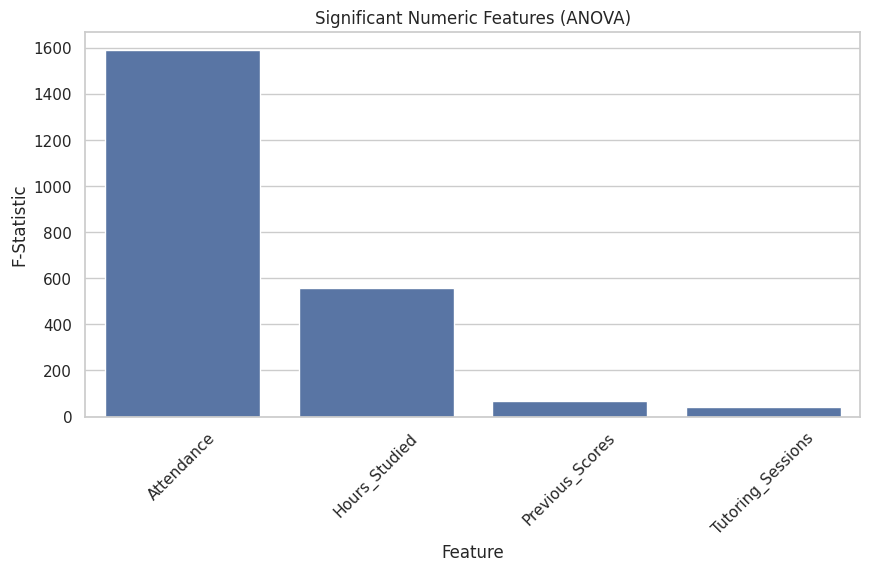


Chi-Square Results:


,Feature,Chi2-Statistic,p-value
1,Access_to_Resources,154.845691,1.862636e-32
0,Parental_Involvement,95.890787,7.367023e-20
8,Peer_Influence,57.688630,8.870230e-12
10,Parental_Education_Level,45.038132,3.904037e-09
11,Distance_from_Home,42.674659,1.208778e-08
5,Family_Income,41.515323,2.102202e-08
9,Learning_Disabilities,32.418218,9.130056e-08
3,Motivation_Level,27.307119,1.722969e-05
6,Teacher_Quality,24.657440,5.895129e-05
2,Extracurricular_Activities,16.003039,3.349532e-04


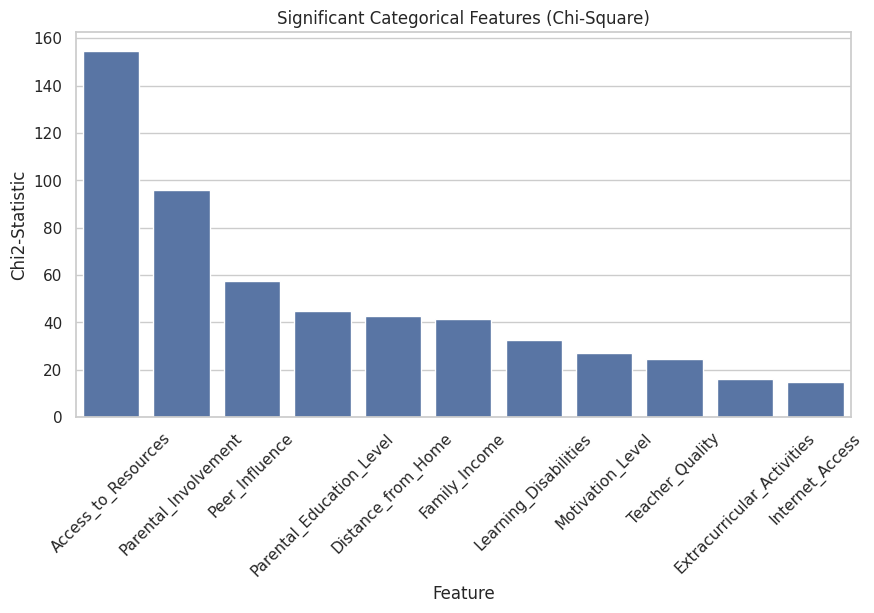


✅ STEP 6 COMPLETE — STATISTICAL SIGNIFICANCE IDENTIFIED


In [9]:
# ============================================================
# 📊 STEP 6: ANOVA + CHI-SQUARE TESTS (ONE CELL)
# ============================================================

print("\n=====================================")
print("📊 STEP 6: STATISTICAL SIGNIFICANCE TESTS")
print("=====================================")

from scipy.stats import f_oneway, chi2_contingency

# ----------------------------
# ANOVA: Numeric Features
# ----------------------------
anova_results = []

for col in num_cols:
    groups = [
        X_train.loc[y_train == cls, col]
        for cls in np.unique(y_train)
    ]
    f_stat, p_val = f_oneway(*groups)
    anova_results.append([col, f_stat, p_val])

anova_df = pd.DataFrame(
    anova_results,
    columns=["Feature", "F-Statistic", "p-value"]
).sort_values("p-value")

print("\nANOVA Results:")
display(anova_df)

significant_anova = anova_df[anova_df["p-value"] < 0.05]

# ----------------------------
# ANOVA Visualization
# ----------------------------
plt.figure(figsize=(10,5))
sns.barplot(
    data=significant_anova,
    x="Feature",
    y="F-Statistic"
)
plt.xticks(rotation=45)
plt.title("Significant Numeric Features (ANOVA)")
plt.show()

# ----------------------------
# Chi-Square: Categorical Features
# ----------------------------
chi_results = []

for col in cat_cols:
    contingency = pd.crosstab(X_train[col], y_train)
    chi2_stat, p, dof, exp = chi2_contingency(contingency)
    chi_results.append([col, chi2_stat, p])

chi_df = pd.DataFrame(
    chi_results,
    columns=["Feature", "Chi2-Statistic", "p-value"]
).sort_values("p-value")

print("\nChi-Square Results:")
display(chi_df)

significant_chi = chi_df[chi_df["p-value"] < 0.05]

# ----------------------------
# Chi-Square Visualization
# ----------------------------
plt.figure(figsize=(10,5))
sns.barplot(
    data=significant_chi,
    x="Feature",
    y="Chi2-Statistic"
)
plt.xticks(rotation=45)
plt.title("Significant Categorical Features (Chi-Square)")
plt.show()

print("\n✅ STEP 6 COMPLETE — STATISTICAL SIGNIFICANCE IDENTIFIED")


# 7) Exploratory Data Analysis


📊 STEP 7: EXPLORATORY DATA ANALYSIS (EDA)


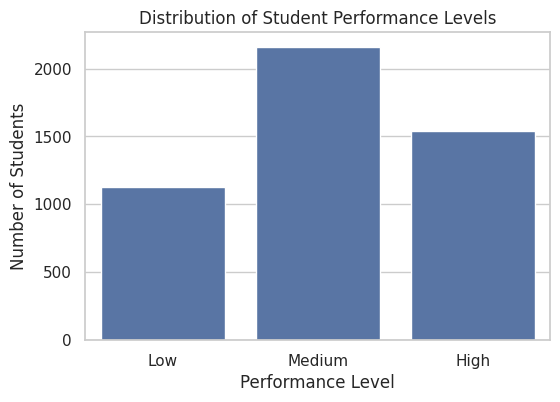

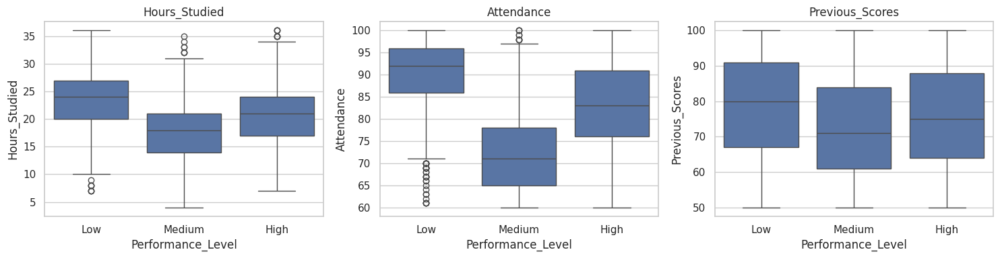


Mean Values of Key Numeric Features:


,Hours_Studied,Attendance,Previous_Scores
Performance_Level,,,
High,20.71,83.00,75.44
Low,23.84,90.16,78.58
Medium,17.50,72.49,72.56


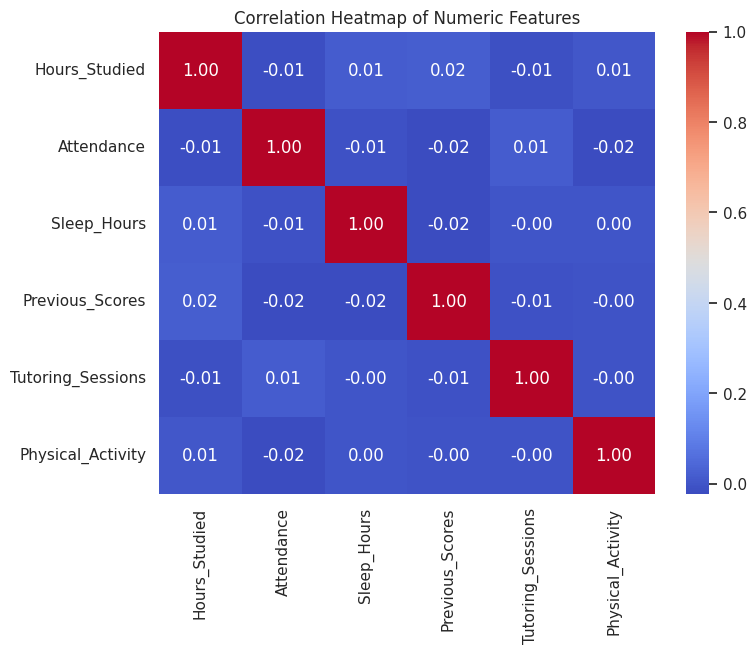

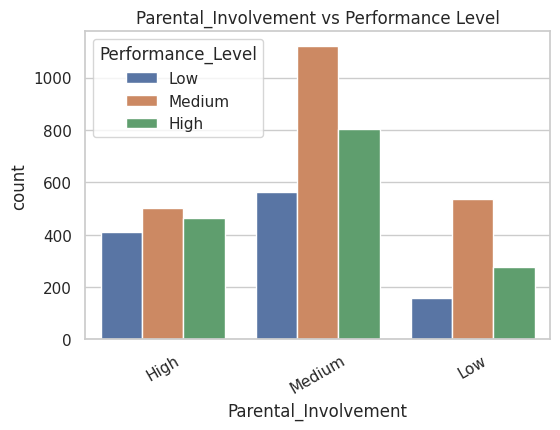

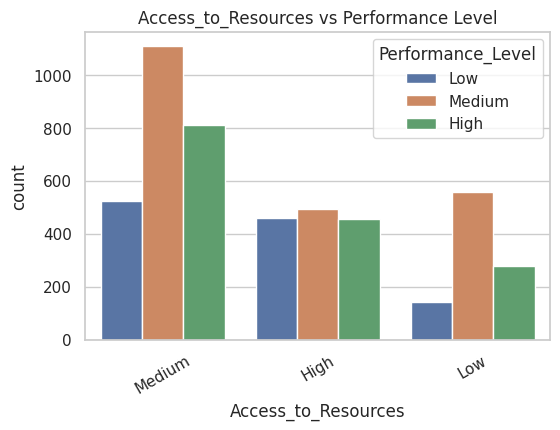

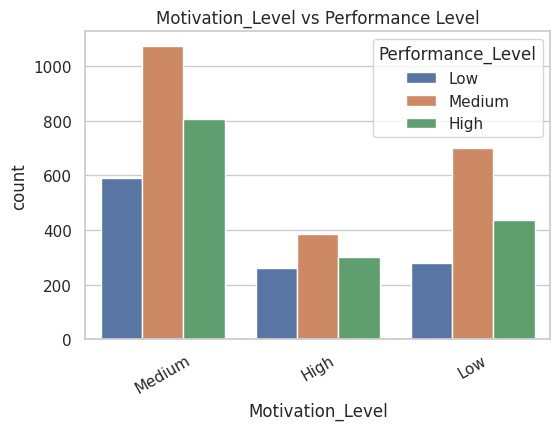

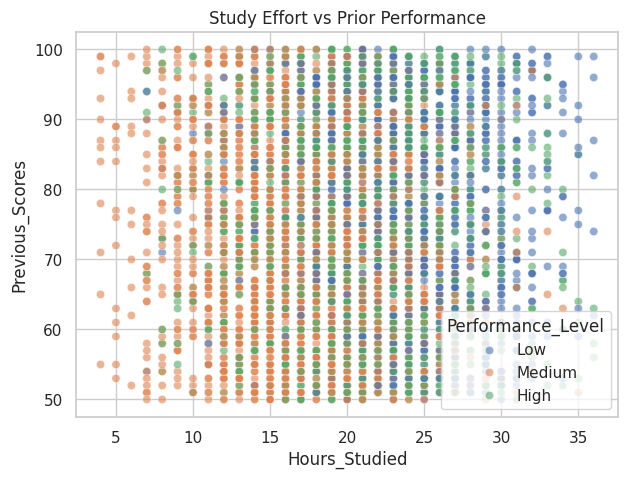


✅ STEP 7 EDA COMPLETE — READY FOR PAPER


In [10]:
# ============================================================
# 📊 STEP 7: EXPLORATORY DATA ANALYSIS (EDA)
# Paper-focused visualizations only
# ============================================================

print("\n=====================================")
print("📊 STEP 7: EXPLORATORY DATA ANALYSIS (EDA)")
print("=====================================")

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# -----------------------------------
# Prepare labeled dataframe (TRAIN)
# -----------------------------------
eda_df = X_train.copy()
eda_df["Performance_Level"] = y_train
label_map = {0: "Low", 1: "Medium", 2: "High"}
eda_df["Performance_Level"] = eda_df["Performance_Level"].map(label_map)

# -----------------------------------
# 7.1 Target Distribution
# -----------------------------------
plt.figure(figsize=(6,4))
sns.countplot(
    x="Performance_Level",
    data=eda_df,
    order=["Low", "Medium", "High"]
)
plt.title("Distribution of Student Performance Levels")
plt.xlabel("Performance Level")
plt.ylabel("Number of Students")
plt.show()

# -----------------------------------
# 7.2 Numeric Feature Distributions by Performance
# (Key academic variables only)
# -----------------------------------
key_numeric = ["Hours_Studied", "Attendance", "Previous_Scores"]

plt.figure(figsize=(15,4))
for i, col in enumerate(key_numeric, 1):
    plt.subplot(1, 3, i)
    sns.boxplot(
        x="Performance_Level",
        y=col,
        data=eda_df,
        order=["Low", "Medium", "High"]
    )
    plt.title(col)
plt.tight_layout()
plt.show()

# -----------------------------------
# 7.3 Mean Comparison (Numeric Features)
# -----------------------------------
mean_table = (
    eda_df
    .groupby("Performance_Level")[key_numeric]
    .mean()
    .round(2)
)

print("\nMean Values of Key Numeric Features:")
display(mean_table)

# -----------------------------------
# 7.4 Correlation Heatmap (Numeric Only)
# -----------------------------------
plt.figure(figsize=(8,6))
sns.heatmap(
    eda_df[num_cols].corr(),
    annot=True,
    cmap="coolwarm",
    fmt=".2f"
)
plt.title("Correlation Heatmap of Numeric Features")
plt.show()

# -----------------------------------
# 7.5 Categorical Feature vs Performance (Top Influential)
# -----------------------------------
key_categorical = [
    "Parental_Involvement",
    "Access_to_Resources",
    "Motivation_Level"
]

for col in key_categorical:
    plt.figure(figsize=(6,4))
    sns.countplot(
        x=col,
        hue="Performance_Level",
        data=eda_df
    )
    plt.title(f"{col} vs Performance Level")
    plt.xticks(rotation=30)
    plt.show()

# -----------------------------------
# 7.6 Study Effort vs Outcome (Scatter)
# -----------------------------------
plt.figure(figsize=(7,5))
sns.scatterplot(
    x="Hours_Studied",
    y="Previous_Scores",
    hue="Performance_Level",
    data=eda_df,
    alpha=0.6
)
plt.title("Study Effort vs Prior Performance")
plt.show()

print("\n✅ STEP 7 EDA COMPLETE — READY FOR PAPER")


# 8) ML Models Training on SMOTE-Balanced Data


🧩 STEP 8: MODEL TRAINING

➡ Training Random Forest
Accuracy: 0.8410
              precision    recall  f1-score   support

           0       0.89      0.89      0.89       432
           1       0.88      0.85      0.86       432
           2       0.76      0.78      0.77       432

    accuracy                           0.84      1296
   macro avg       0.84      0.84      0.84      1296
weighted avg       0.84      0.84      0.84      1296



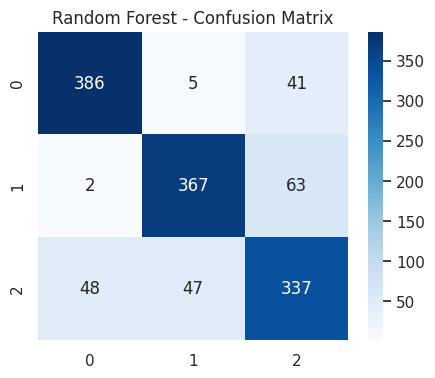


➡ Training XGBoost
Accuracy: 0.8588
              precision    recall  f1-score   support

           0       0.91      0.89      0.90       432
           1       0.90      0.86      0.88       432
           2       0.78      0.83      0.80       432

    accuracy                           0.86      1296
   macro avg       0.86      0.86      0.86      1296
weighted avg       0.86      0.86      0.86      1296



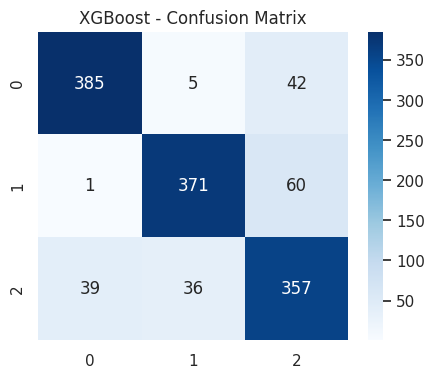


➡ Training LightGBM
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002351 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 8925
[LightGBM] [Info] Number of data points in the train set: 5181, number of used features: 35
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


Accuracy: 0.8681
              precision    recall  f1-score   support

           0       0.92      0.90      0.91       432
           1       0.90      0.87      0.88       432
           2       0.79      0.84      0.81       432

    accuracy                           0.87      1296
   macro avg       0.87      0.87      0.87      1296
weighted avg       0.87      0.87      0.87      1296



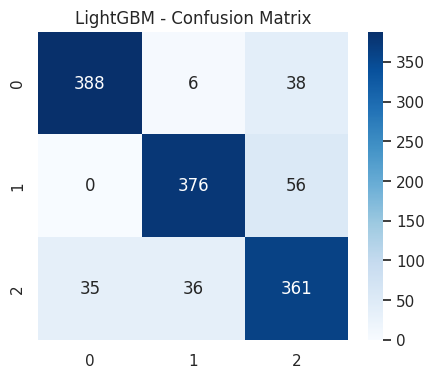

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(



➡ Training SVM
Accuracy: 0.8295
              precision    recall  f1-score   support

           0       0.89      0.85      0.87       432
           1       0.89      0.83      0.86       432
           2       0.73      0.81      0.77       432

    accuracy                           0.83      1296
   macro avg       0.83      0.83      0.83      1296
weighted avg       0.83      0.83      0.83      1296



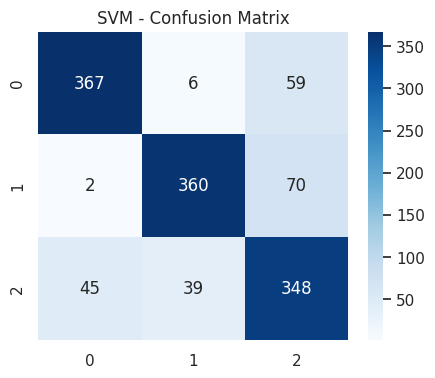


➡ Training Gradient Boosting
Accuracy: 0.8233
              precision    recall  f1-score   support

           0       0.88      0.85      0.87       432
           1       0.87      0.84      0.85       432
           2       0.73      0.78      0.75       432

    accuracy                           0.82      1296
   macro avg       0.83      0.82      0.82      1296
weighted avg       0.83      0.82      0.82      1296



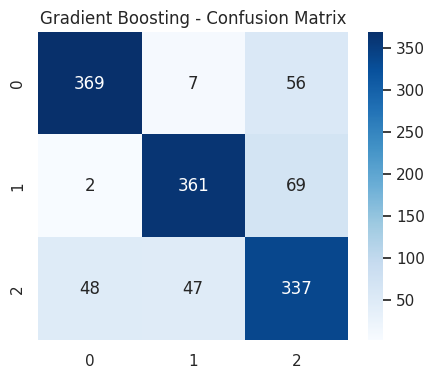


➡ Training AdaBoost
Accuracy: 0.7215
              precision    recall  f1-score   support

           0       0.83      0.64      0.72       432
           1       0.84      0.76      0.80       432
           2       0.58      0.76      0.66       432

    accuracy                           0.72      1296
   macro avg       0.75      0.72      0.73      1296
weighted avg       0.75      0.72      0.73      1296



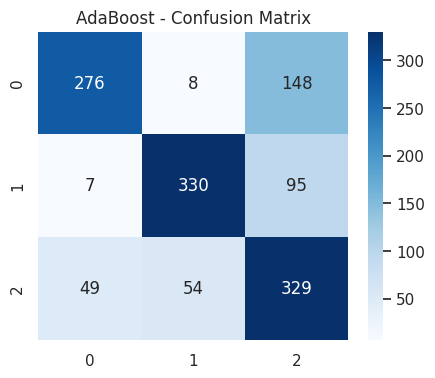


➡ Training Logistic Regression
Accuracy: 0.8094
              precision    recall  f1-score   support

           0       0.87      0.81      0.84       432
           1       0.88      0.84      0.86       432
           2       0.70      0.78      0.74       432

    accuracy                           0.81      1296
   macro avg       0.82      0.81      0.81      1296
weighted avg       0.82      0.81      0.81      1296



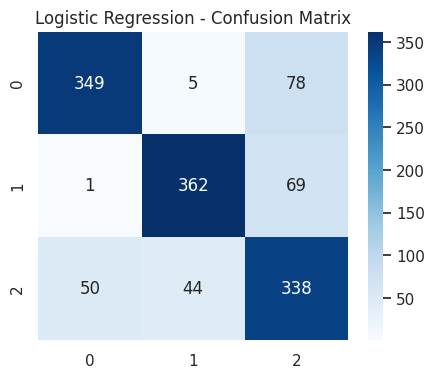


➡ Training KNN
Accuracy: 0.7585
              precision    recall  f1-score   support

           0       0.77      0.86      0.81       432
           1       0.86      0.73      0.79       432
           2       0.67      0.69      0.68       432

    accuracy                           0.76      1296
   macro avg       0.76      0.76      0.76      1296
weighted avg       0.76      0.76      0.76      1296



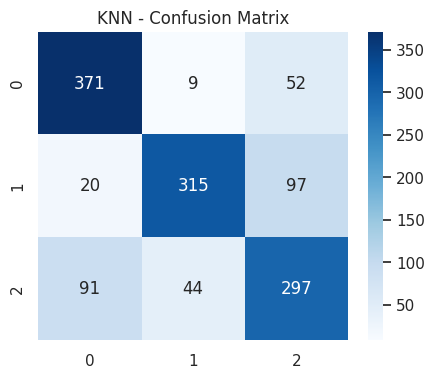


➡ Training Decision Tree
Accuracy: 0.6944
              precision    recall  f1-score   support

           0       0.79      0.76      0.77       432
           1       0.73      0.71      0.72       432
           2       0.58      0.62      0.60       432

    accuracy                           0.69      1296
   macro avg       0.70      0.69      0.70      1296
weighted avg       0.70      0.69      0.70      1296



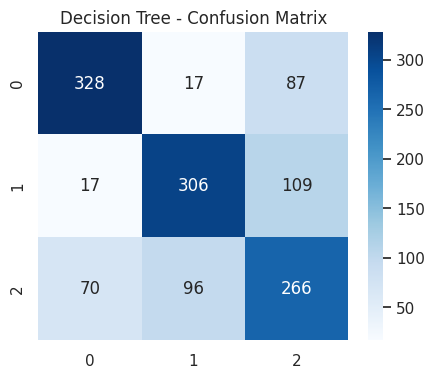


➡ Training MLP
Accuracy: 0.8781
              precision    recall  f1-score   support

           0       0.92      0.92      0.92       432
           1       0.90      0.86      0.88       432
           2       0.82      0.85      0.83       432

    accuracy                           0.88      1296
   macro avg       0.88      0.88      0.88      1296
weighted avg       0.88      0.88      0.88      1296



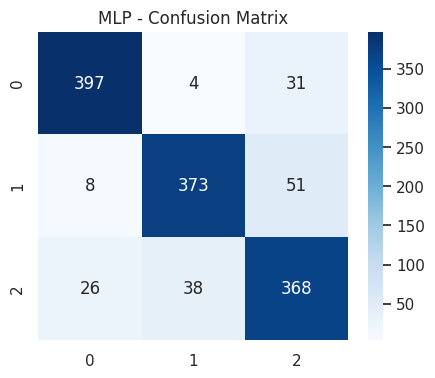

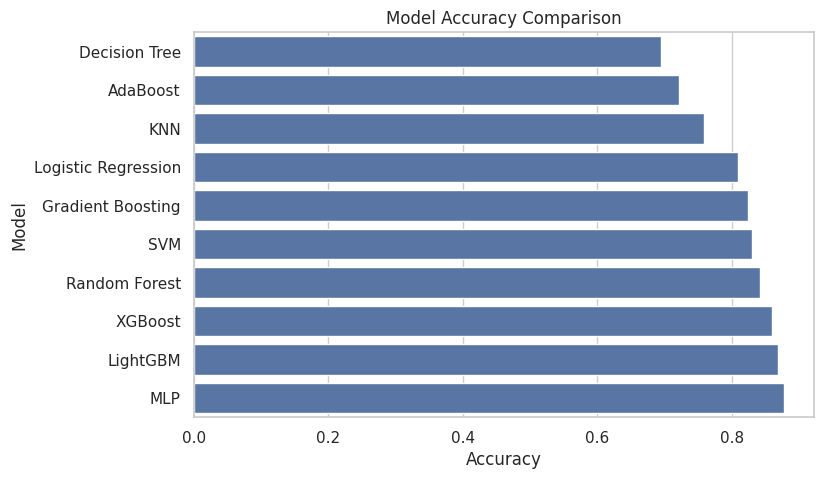


✅ STEP 8 COMPLETE — MODELS TRAINED & EVALUATED


In [12]:
# ============================================================
# 🧩 STEP 8: MODEL TRAINING ON SMOTE-BALANCED DATA
# ============================================================

from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier

from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, auc
from sklearn.model_selection import train_test_split

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

print("\n==============================")
print("🧩 STEP 8: MODEL TRAINING")
print("==============================")

# ------------------------------------------------------------
# 8.1 Train–Validation Split (Balanced Data)
# ------------------------------------------------------------
X_train_mod, X_val_mod, y_train_mod, y_val_mod = train_test_split(
    X_train_bal, y_train_bal,
    test_size=0.2,
    stratify=y_train_bal,
    random_state=42
)

# ------------------------------------------------------------
# 8.2 Define Models
# ------------------------------------------------------------
models = {
    "Random Forest": RandomForestClassifier(n_estimators=200, random_state=42, n_jobs=-1),
    "XGBoost": XGBClassifier(n_estimators=200, max_depth=6, learning_rate=0.1,
                             eval_metric="mlogloss", random_state=42),
    "LightGBM": LGBMClassifier(n_estimators=200, random_state=42),
    "SVM": SVC(kernel="rbf", probability=True, random_state=42),
    "Gradient Boosting": GradientBoostingClassifier(n_estimators=200, random_state=42),
    "AdaBoost": AdaBoostClassifier(n_estimators=200, random_state=42),
    "Logistic Regression": LogisticRegression(max_iter=2000, random_state=42),
    "KNN": KNeighborsClassifier(n_neighbors=7),
    "Decision Tree": DecisionTreeClassifier(max_depth=10, random_state=42),
    "MLP": MLPClassifier(hidden_layer_sizes=(128,64), max_iter=500, random_state=42)
}

# ------------------------------------------------------------
# 8.3 Train & Evaluate
# ------------------------------------------------------------
results = []
roc_data = {}

for name, model in models.items():
    print(f"\n➡ Training {name}")
    model.fit(X_train_mod, y_train_mod)

    y_pred = model.predict(X_val_mod)
    acc = accuracy_score(y_val_mod, y_pred)
    results.append([name, acc])

    print(f"Accuracy: {acc:.4f}")
    print(classification_report(y_val_mod, y_pred))

    # Confusion Matrix
    plt.figure(figsize=(5,4))
    sns.heatmap(confusion_matrix(y_val_mod, y_pred),
                annot=True, fmt="d", cmap="Blues")
    plt.title(f"{name} - Confusion Matrix")
    plt.show()

    # ROC Curve
    if hasattr(model, "predict_proba"):
        y_prob = model.predict_proba(X_val_mod)
        roc_data[name] = []
        for i in np.unique(y_val_mod):
            fpr, tpr, _ = roc_curve((y_val_mod == i).astype(int), y_prob[:, i])
            roc_auc = auc(fpr, tpr)
            roc_data[name].append((fpr, tpr, roc_auc))

# ------------------------------------------------------------
# 8.4 Accuracy Comparison
# ------------------------------------------------------------
results_df = pd.DataFrame(results, columns=["Model","Accuracy"]).sort_values("Accuracy")

plt.figure(figsize=(8,5))
sns.barplot(x="Accuracy", y="Model", data=results_df)
plt.title("Model Accuracy Comparison")
plt.show()

print("\n✅ STEP 8 COMPLETE — MODELS TRAINED & EVALUATED")



=== STEP 8: Models Training on SMOTE-Balanced Data ===
Features shape: (6807, 40), Target length: 6807
Training set: (5445, 40), Validation set: (1362, 40)

➡ Training Random Forest...
✅ Random Forest Accuracy: 0.8568
Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.88      0.89       454
           1       0.87      0.92      0.89       454
           2       0.81      0.77      0.79       454

    accuracy                           0.86      1362
   macro avg       0.86      0.86      0.86      1362
weighted avg       0.86      0.86      0.86      1362



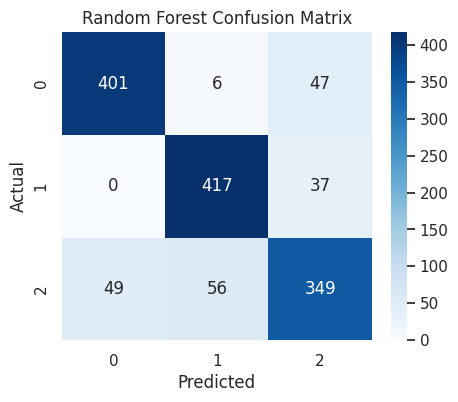


➡ Training XGBoost...


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [15:21:18] WARNING: /workspace/src/learner.cc:790: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


✅ XGBoost Accuracy: 0.8972
Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.92      0.93       454
           1       0.91      0.91      0.91       454
           2       0.84      0.86      0.85       454

    accuracy                           0.90      1362
   macro avg       0.90      0.90      0.90      1362
weighted avg       0.90      0.90      0.90      1362



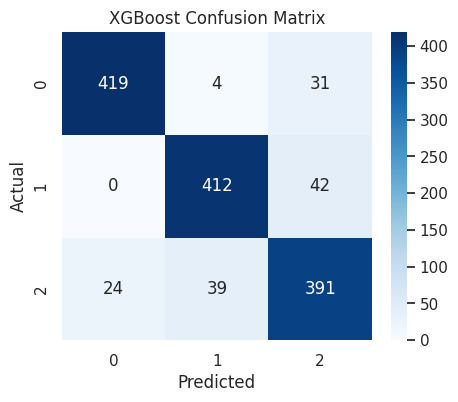


➡ Training LightGBM...
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002590 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5333
[LightGBM] [Info] Number of data points in the train set: 5445, number of used features: 40
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightG

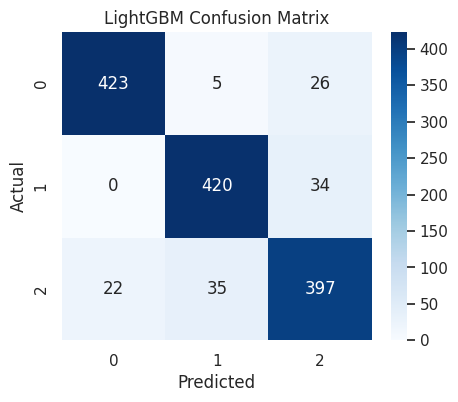


➡ Training SVC...
✅ SVC Accuracy: 0.9618
Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.96      0.97       454
           1       0.98      0.96      0.97       454
           2       0.93      0.97      0.95       454

    accuracy                           0.96      1362
   macro avg       0.96      0.96      0.96      1362
weighted avg       0.96      0.96      0.96      1362



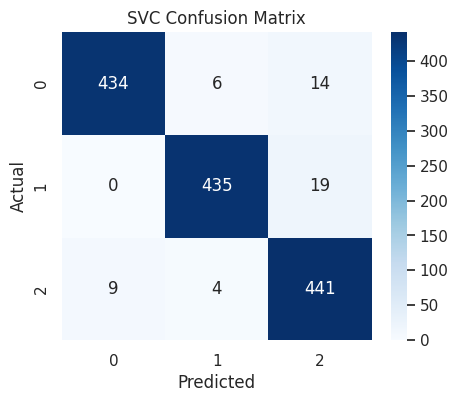


➡ Training Gradient Boosting...
✅ Gradient Boosting Accuracy: 0.8972
Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.91      0.93       454
           1       0.92      0.91      0.91       454
           2       0.84      0.87      0.85       454

    accuracy                           0.90      1362
   macro avg       0.90      0.90      0.90      1362
weighted avg       0.90      0.90      0.90      1362



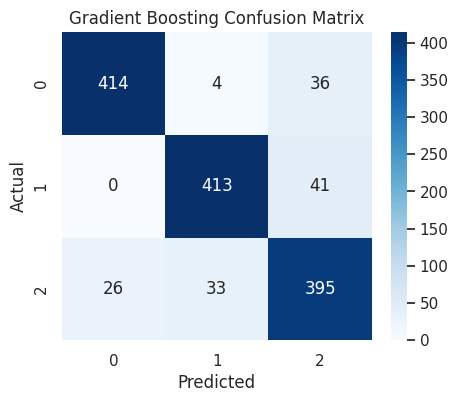


➡ Training AdaBoost...
✅ AdaBoost Accuracy: 0.6696
Classification Report:
              precision    recall  f1-score   support

           0       0.75      0.67      0.71       454
           1       0.77      0.72      0.74       454
           2       0.53      0.62      0.57       454

    accuracy                           0.67      1362
   macro avg       0.68      0.67      0.67      1362
weighted avg       0.68      0.67      0.67      1362



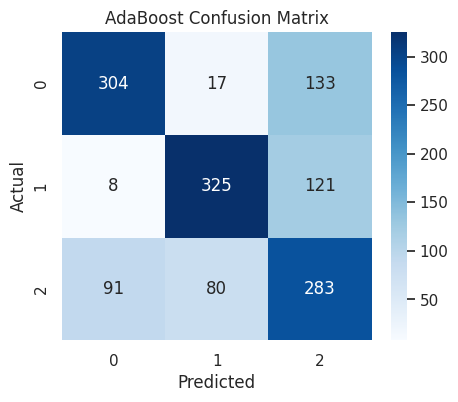


➡ Training Logistic Regression...
✅ Logistic Regression Accuracy: 0.9706
Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.97      0.97       454
           1       0.98      0.98      0.98       454
           2       0.96      0.97      0.96       454

    accuracy                           0.97      1362
   macro avg       0.97      0.97      0.97      1362
weighted avg       0.97      0.97      0.97      1362



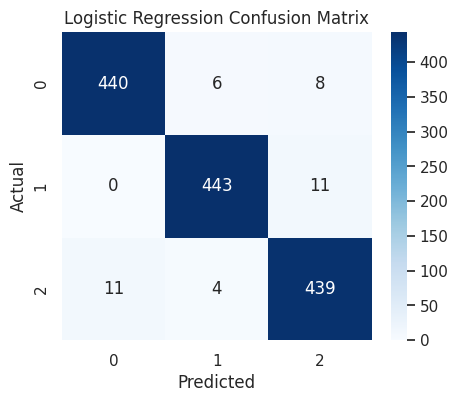


➡ Training K-Nearest Neighbors...
✅ K-Nearest Neighbors Accuracy: 0.7966
Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.93      0.87       454
           1       0.92      0.70      0.79       454
           2       0.69      0.76      0.73       454

    accuracy                           0.80      1362
   macro avg       0.81      0.80      0.80      1362
weighted avg       0.81      0.80      0.80      1362



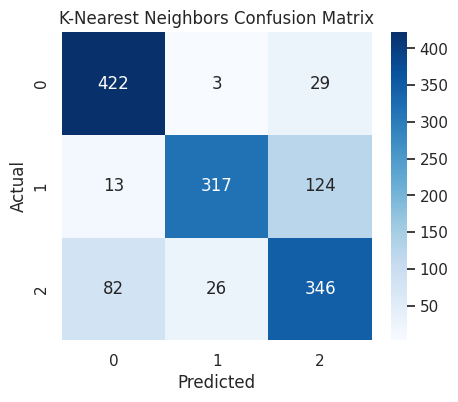


➡ Training Decision Tree...
✅ Decision Tree Accuracy: 0.7599
Classification Report:
              precision    recall  f1-score   support

           0       0.81      0.79      0.80       454
           1       0.82      0.79      0.81       454
           2       0.65      0.69      0.67       454

    accuracy                           0.76      1362
   macro avg       0.76      0.76      0.76      1362
weighted avg       0.76      0.76      0.76      1362



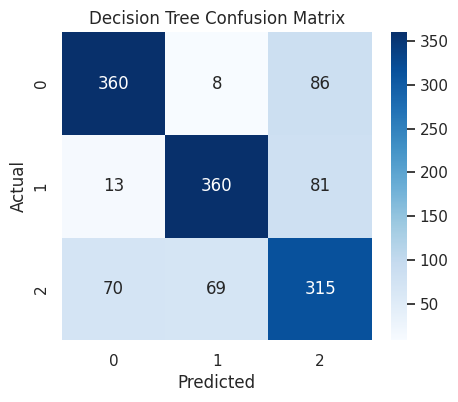


➡ Training MLP Neural Network...
✅ MLP Neural Network Accuracy: 0.9677
Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.97      0.97       454
           1       0.97      0.98      0.97       454
           2       0.97      0.95      0.96       454

    accuracy                           0.97      1362
   macro avg       0.97      0.97      0.97      1362
weighted avg       0.97      0.97      0.97      1362



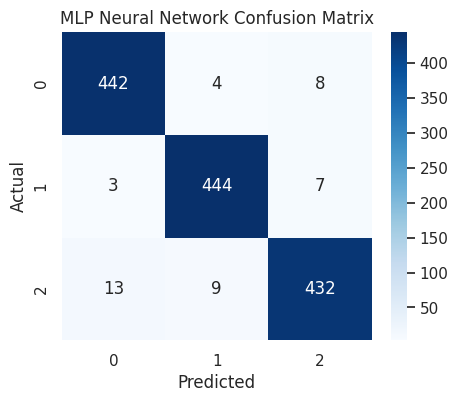

/tmp/ipython-input-1099511108.py:131: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Accuracy', y='Model', data=results_df, palette='viridis')


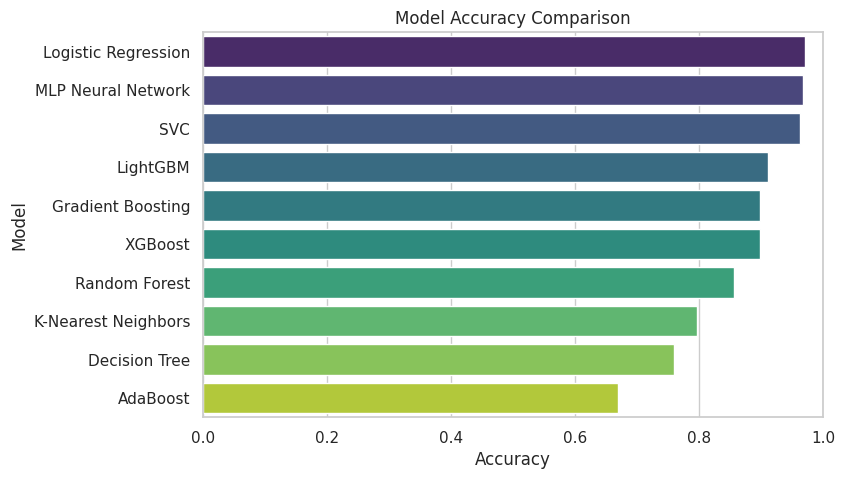


📈 Plotting ROC Curves...



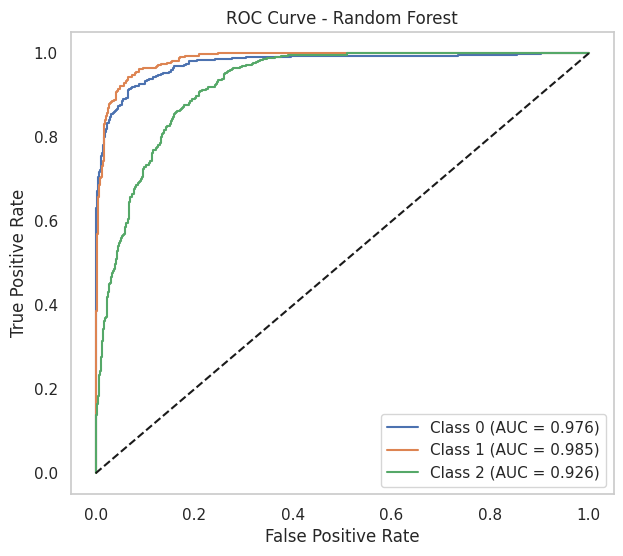

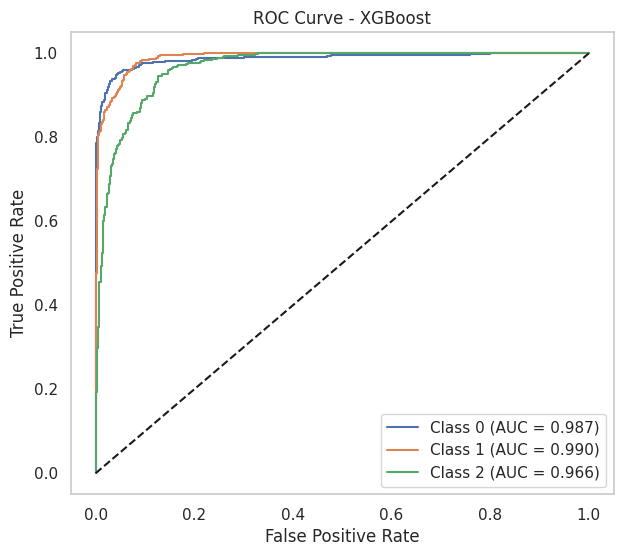

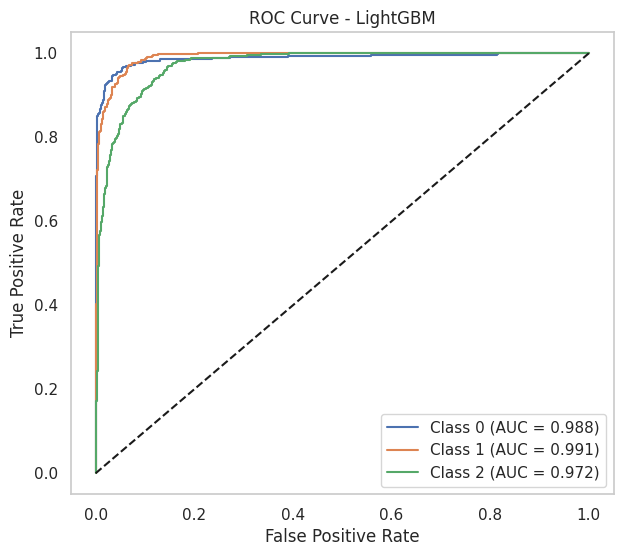

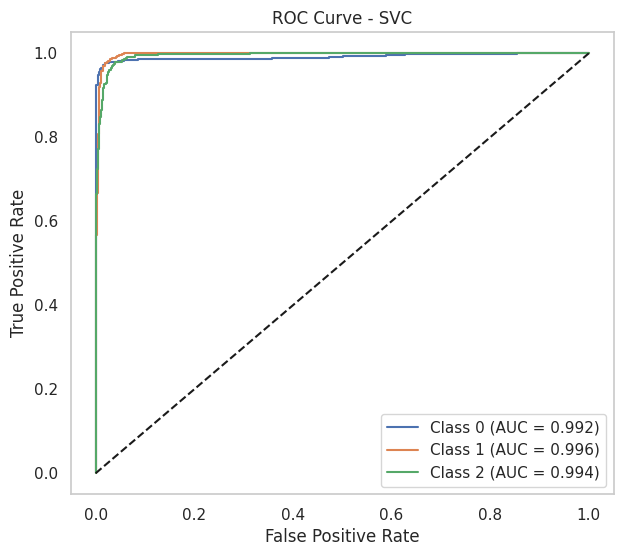

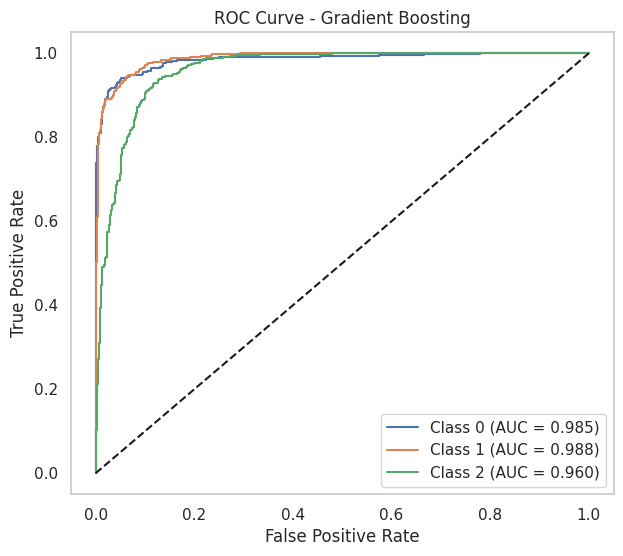

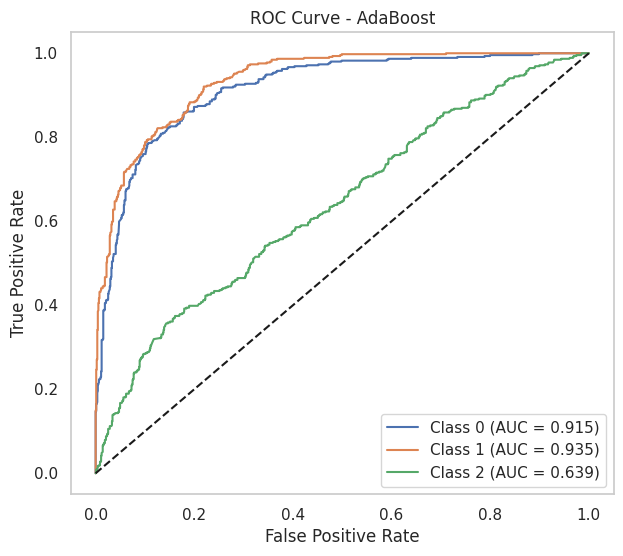

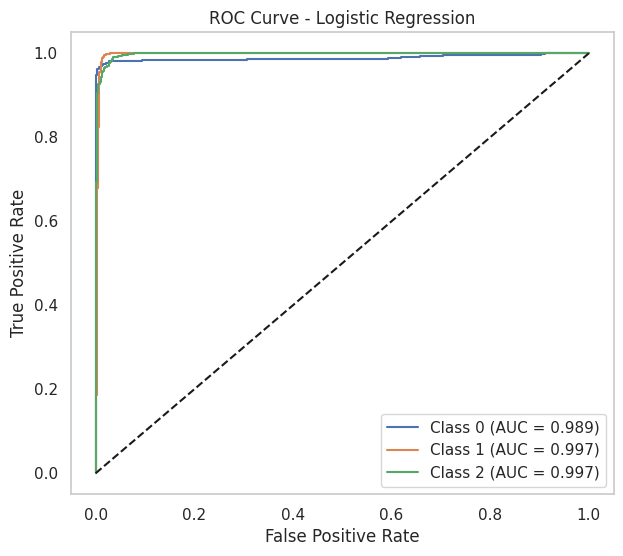

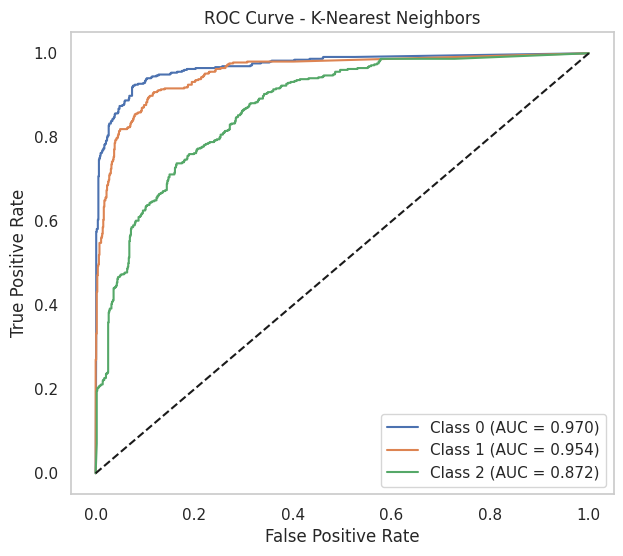

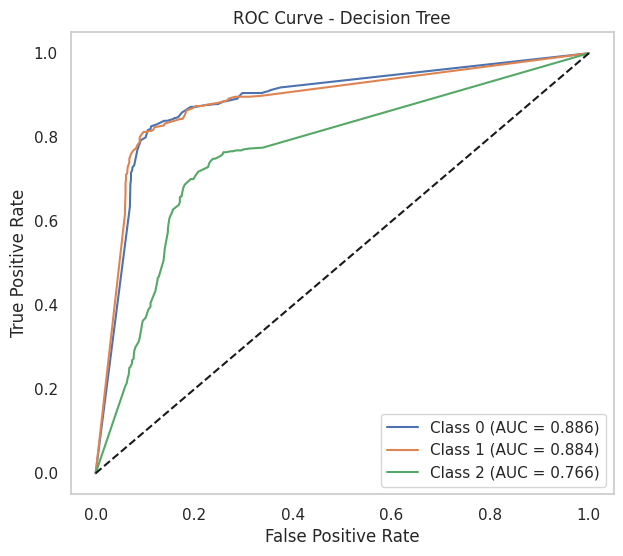

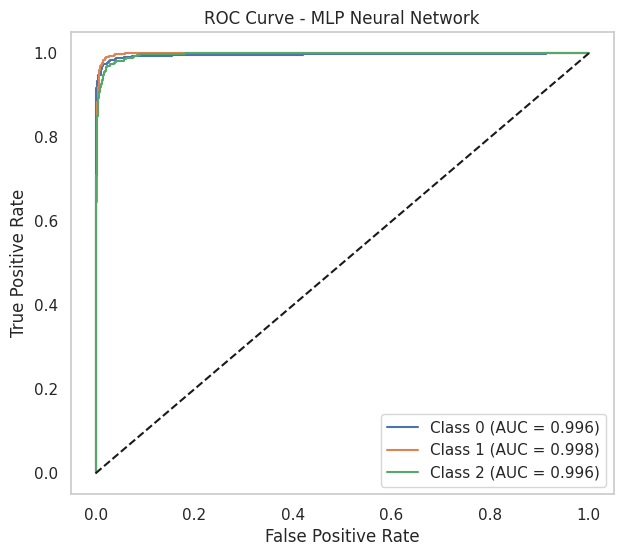


✅ STEP 8 Completed Successfully (no CatBoost).


In [ ]:
# ============================================================
# 🧩 STEP 8: ML Models Training on SMOTE-Balanced Data (WITH ROC CURVES)
# ============================================================

from sklearn.ensemble import (
    RandomForestClassifier, GradientBoostingClassifier,
    AdaBoostClassifier, ExtraTreesClassifier
)
from sklearn.svm import SVC
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier

from sklearn.metrics import (
    accuracy_score, classification_report, confusion_matrix,
    roc_curve, auc
)

from sklearn.model_selection import train_test_split

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

print("\n=== STEP 8: Models Training on SMOTE-Balanced Data ===")

# ------------------------------------------------------------
# 8.1 Use all features from SMOTE-balanced dataset
# ------------------------------------------------------------
X_model = X_train_bal.copy()
y_model = y_train_bal.copy()

print(f"Features shape: {X_model.shape}, Target length: {len(y_model)}")

# ------------------------------------------------------------
# 8.2 Train-validation split
# ------------------------------------------------------------
X_train_mod, X_val_mod, y_train_mod, y_val_mod = train_test_split(
    X_model, y_model, test_size=0.2, random_state=42, stratify=y_model
)

print(f"Training set: {X_train_mod.shape}, Validation set: {X_val_mod.shape}")

# ------------------------------------------------------------
# 8.3 Define Models (CatBoost removed)
# ------------------------------------------------------------
models = {
    "Random Forest": RandomForestClassifier(
        n_estimators=200, max_depth=10, random_state=42, n_jobs=-1
    ),
    "XGBoost": XGBClassifier(
        n_estimators=200, max_depth=6, learning_rate=0.1,
        use_label_encoder=False, eval_metric='mlogloss', random_state=42
    ),
    "LightGBM": LGBMClassifier(
        n_estimators=200, max_depth=6, learning_rate=0.1, random_state=42
    ),
    "SVC": SVC(kernel='rbf', probability=True, random_state=42),
    "Gradient Boosting": GradientBoostingClassifier(
        n_estimators=200, max_depth=6, learning_rate=0.1, random_state=42
    ),
    "AdaBoost": AdaBoostClassifier(
        n_estimators=200, learning_rate=0.1, random_state=42
    ),
    "Logistic Regression": LogisticRegression(
        max_iter=2000, n_jobs=-1, random_state=42
    ),
    "K-Nearest Neighbors": KNeighborsClassifier(
        n_neighbors=7, weights='distance'
    ),
    "Decision Tree": DecisionTreeClassifier(
        max_depth=10, random_state=42
    ),
    "MLP Neural Network": MLPClassifier(
        hidden_layer_sizes=(128, 64),
        activation='relu',
        solver='adam',
        max_iter=500,
        random_state=42
    )
}

# ------------------------------------------------------------
# 8.4 Train, Predict, and Evaluate Models
# ------------------------------------------------------------
results = []
roc_curve_data = {}

for name, model in models.items():
    print(f"\n➡ Training {name}...")
    model.fit(X_train_mod, y_train_mod)

    y_pred = model.predict(X_val_mod)
    acc = accuracy_score(y_val_mod, y_pred)
    results.append({'Model': name, 'Accuracy': acc})

    print(f"✅ {name} Accuracy: {acc:.4f}")
    print("Classification Report:")
    print(classification_report(y_val_mod, y_pred))

    # Confusion matrix
    plt.figure(figsize=(5,4))
    sns.heatmap(confusion_matrix(y_val_mod, y_pred),
                annot=True, fmt='d', cmap='Blues')
    plt.title(f"{name} Confusion Matrix")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()

    # Store ROC curve data
    if hasattr(model, "predict_proba"):
        y_proba = model.predict_proba(X_val_mod)
        roc_curve_data[name] = {}
        classes = np.unique(y_val_mod)

        for c in classes:
            fpr, tpr, _ = roc_curve((y_val_mod == c).astype(int), y_proba[:, c])
            roc_auc = auc(fpr, tpr)
            roc_curve_data[name][c] = (fpr, tpr, roc_auc)

# ------------------------------------------------------------
# 8.5 Compare Model Accuracy
# ------------------------------------------------------------
results_df = pd.DataFrame(results).sort_values(by='Accuracy', ascending=False)
plt.figure(figsize=(8,5))
sns.barplot(x='Accuracy', y='Model', data=results_df, palette='viridis')
plt.title("Model Accuracy Comparison")
plt.xlim(0,1)
plt.show()

# ------------------------------------------------------------
# 8.6 Plot ROC Curves
# ------------------------------------------------------------
print("\n📈 Plotting ROC Curves...\n")

for model_name, class_dict in roc_curve_data.items():

    plt.figure(figsize=(7,6))

    for cls, (fpr, tpr, roc_auc) in class_dict.items():
        plt.plot(fpr, tpr, label=f"Class {cls} (AUC = {roc_auc:.3f})")

    plt.plot([0, 1], [0, 1], 'k--')
    plt.title(f"ROC Curve - {model_name}")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend(loc="lower right")
    plt.grid()
    plt.show()

print("\n✅ STEP 8 Completed Successfully (no CatBoost).")


# 9) Perform Hyperparameter Tuning

In [ ]:
param_grids = {}

# Random Forest
param_grids['Random Forest'] = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2]
}

# XGBoost
param_grids['XGBoost'] = {
    'n_estimators': [100, 200],
    'max_depth': [3, 6, 9],
    'learning_rate': [0.05, 0.1, 0.2],
    'subsample': [0.7, 1.0],
    'colsample_bytree': [0.7, 1.0]
}

# LightGBM
param_grids['LightGBM'] = {
    'n_estimators': [100, 200],
    'max_depth': [3, 6, 9],
    'learning_rate': [0.05, 0.1, 0.2],
    'subsample': [0.7, 1.0],
    'colsample_bytree': [0.7, 1.0]
}

# SVC
param_grids['SVC'] = {
    'C': [0.1, 1, 10],
    'kernel': ['rbf', 'poly'],
    'gamma': ['scale', 'auto']
}

# Gradient Boosting
param_grids['Gradient Boosting'] = {
    'n_estimators': [100, 200],
    'learning_rate': [0.05, 0.1, 0.2],
    'max_depth': [3, 5]
}

# AdaBoost
param_grids['AdaBoost'] = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 1.0]
}

# Logistic Regression
param_grids['Logistic Regression'] = {
    'C': [0.001, 0.01, 0.1, 1, 10, 100],
    'penalty': ['l1', 'l2'],
    'solver': ['liblinear', 'saga']
}

# K-Nearest Neighbors
param_grids['K-Nearest Neighbors'] = {
    'n_neighbors': [3, 5, 7, 9],
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan']
}

# Decision Tree
param_grids['Decision Tree'] = {
    'max_depth': [None, 5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'criterion': ['gini', 'entropy']
}

# MLP Neural Network
param_grids['MLP Neural Network'] = {
    'hidden_layer_sizes': [(50,), (100, 50), (100,)],
    'activation': ['relu', 'tanh'],
    'solver': ['adam', 'sgd'],
    'alpha': [0.0001, 0.001],
    'learning_rate_init': [0.001, 0.01]
}

print("Hyperparameter grids defined:")
for model_name, grid in param_grids.items():
    print(f"\n{model_name}:")
    for param, values in grid.items():
        print(f"  {param}: {values}")

Hyperparameter grids defined:

Random Forest:
  n_estimators: [100, 200, 300]
  max_depth: [None, 10, 20]
  min_samples_split: [2, 5]
  min_samples_leaf: [1, 2]

XGBoost:
  n_estimators: [100, 200]
  max_depth: [3, 6, 9]
  learning_rate: [0.05, 0.1, 0.2]
  subsample: [0.7, 1.0]
  colsample_bytree: [0.7, 1.0]

LightGBM:
  n_estimators: [100, 200]
  max_depth: [3, 6, 9]
  learning_rate: [0.05, 0.1, 0.2]
  subsample: [0.7, 1.0]
  colsample_bytree: [0.7, 1.0]

SVC:
  C: [0.1, 1, 10]
  kernel: ['rbf', 'poly']
  gamma: ['scale', 'auto']

Gradient Boosting:
  n_estimators: [100, 200]
  learning_rate: [0.05, 0.1, 0.2]
  max_depth: [3, 5]

AdaBoost:
  n_estimators: [50, 100, 200]
  learning_rate: [0.01, 0.1, 1.0]

Logistic Regression:
  C: [0.001, 0.01, 0.1, 1, 10, 100]
  penalty: ['l1', 'l2']
  solver: ['liblinear', 'saga']

K-Nearest Neighbors:
  n_neighbors: [3, 5, 7, 9]
  weights: ['uniform', 'distance']
  metric: ['euclidean', 'manhattan']

Decision Tree:
  max_depth: [None, 5, 10, 15]
  m

In [ ]:
from sklearn.model_selection import GridSearchCV, StratifiedKFold

# Initialize dictionaries to store best estimators and GridSearchCV objects
tuned_models = {}
grid_searches = {}

# Create StratifiedKFold object
# Using y_train_bal to ensure stratification is based on the target variable
stratified_kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

print("\n=====================================")
print("⚙️ Starting Hyperparameter Tuning")
print("=====================================\n")

for model_name, param_grid in param_grids.items():
    print(f"\n➡ Tuning {model_name}...")

    # Get the base model from the 'models' dictionary
    estimator = models[model_name]

    # Handle specific model constraints for GridSearchCV
    # For Logistic Regression, 'l1' penalty only works with 'liblinear' or 'saga' solvers
    if model_name == 'Logistic Regression':
        if 'penalty' in param_grid and 'solver' in param_grid:
            # Filter out incompatible combinations: l1 with non-liblinear/saga solvers
            # This is implicitly handled by GridSearchCV as it will try combinations
            # but explicitly removing them can prevent warnings/errors in some cases or reduce search space.
            # For now, let GridSearchCV handle it, as the param_grid already includes compatible solvers.
            pass

    # For SVC, gamma='scale' or 'auto' cannot be used with probability=True if not fitting on X, y from GridSearchCV
    # However, if passed directly to GridSearchCV, it handles this. We keep the probability=True as it's needed for ROC curves later.
    # If the provided param_grid values are 'scale'/'auto', GridSearchCV will manage.

    # Create GridSearchCV object
    grid_search = GridSearchCV(
        estimator=estimator,
        param_grid=param_grid,
        cv=stratified_kfold,
        scoring='accuracy',
        verbose=1,
        n_jobs=-1
    )

    # Fit GridSearchCV to the SMOTE-balanced training data
    grid_search.fit(X_train_bal, y_train_bal)

    # Store the best estimator and the GridSearchCV object
    tuned_models[model_name] = grid_search.best_estimator_
    grid_searches[model_name] = grid_search

    # Print results
    print(f"✅ {model_name} Tuning Complete!")
    print(f"   Best Parameters: {grid_search.best_params_}")
    print(f"   Best Score (Accuracy): {grid_search.best_score_:.4f}")

print("\n=====================================")
print("✅ All Hyperparameter Tuning Complete!")
print("=====================================")


⚙️ Starting Hyperparameter Tuning


➡ Tuning Random Forest...
Fitting 5 folds for each of 36 candidates, totalling 180 fits
✅ Random Forest Tuning Complete!
   Best Parameters: {'max_depth': 20, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300}
   Best Score (Accuracy): 0.8812

➡ Tuning XGBoost...
Fitting 5 folds for each of 72 candidates, totalling 360 fits


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [15:58:01] WARNING: /workspace/src/learner.cc:790: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


✅ XGBoost Tuning Complete!
   Best Parameters: {'colsample_bytree': 0.7, 'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 200, 'subsample': 0.7}
   Best Score (Accuracy): 0.9202

➡ Tuning LightGBM...
Fitting 5 folds for each of 72 candidates, totalling 360 fits
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002597 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7715
[LightGBM] [Info] Number of data points in the train set: 6807, number of used features: 40
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 


📊 STEP 9: Evaluate Tuned Models on Test Data


➡ Evaluating Tuned Random Forest on Test Data...
✅ Tuned Random Forest Test Accuracy: 0.8180
Test Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.78      0.82       319
           1       0.86      0.91      0.88       567
           2       0.72      0.72      0.72       416

    accuracy                           0.82      1302
   macro avg       0.82      0.80      0.81      1302
weighted avg       0.82      0.82      0.82      1302



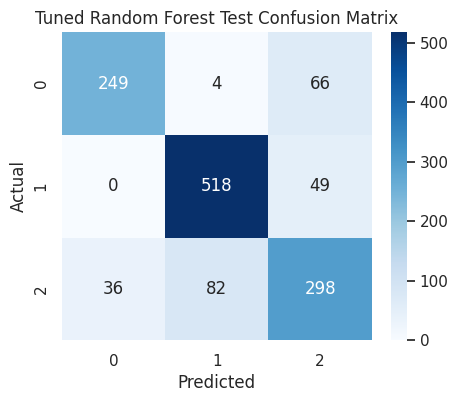


➡ Evaluating Tuned XGBoost on Test Data...
✅ Tuned XGBoost Test Accuracy: 0.8848
Test Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.87      0.89       319
           1       0.94      0.92      0.93       567
           2       0.81      0.85      0.83       416

    accuracy                           0.88      1302
   macro avg       0.88      0.88      0.88      1302
weighted avg       0.89      0.88      0.89      1302



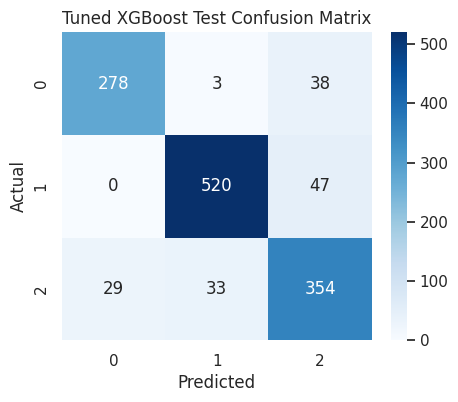


➡ Evaluating Tuned LightGBM on Test Data...
✅ Tuned LightGBM Test Accuracy: 0.8894
Test Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.88      0.89       319
           1       0.93      0.93      0.93       567
           2       0.83      0.84      0.83       416

    accuracy                           0.89      1302
   macro avg       0.89      0.88      0.88      1302
weighted avg       0.89      0.89      0.89      1302



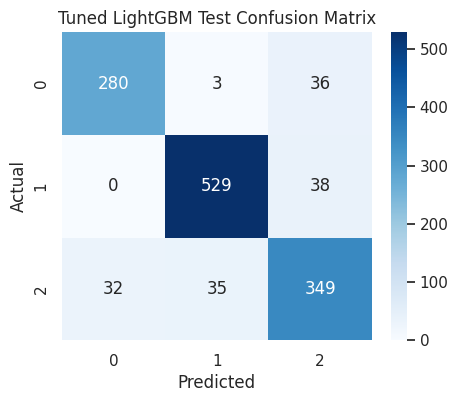


➡ Evaluating Tuned SVC on Test Data...
✅ Tuned SVC Test Accuracy: 0.9355
Test Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.94      0.94       319
           1       0.96      0.96      0.96       567
           2       0.90      0.90      0.90       416

    accuracy                           0.94      1302
   macro avg       0.93      0.93      0.93      1302
weighted avg       0.94      0.94      0.94      1302



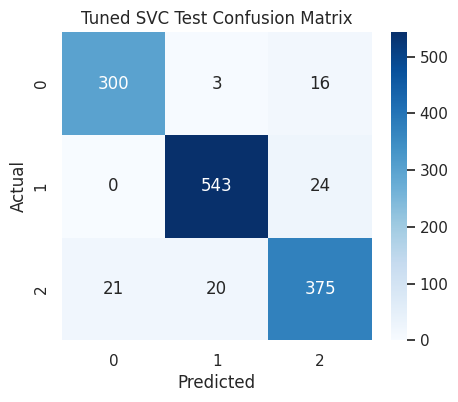


➡ Evaluating Tuned Gradient Boosting on Test Data...
✅ Tuned Gradient Boosting Test Accuracy: 0.8786
Test Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.86      0.88       319
           1       0.93      0.91      0.92       567
           2       0.79      0.85      0.82       416

    accuracy                           0.88      1302
   macro avg       0.88      0.87      0.87      1302
weighted avg       0.88      0.88      0.88      1302



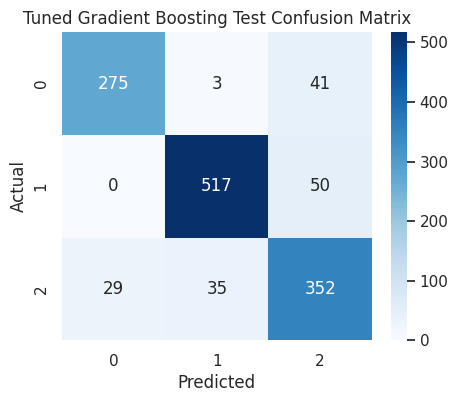


➡ Evaluating Tuned AdaBoost on Test Data...
✅ Tuned AdaBoost Test Accuracy: 0.7496
Test Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.51      0.64       319
           1       0.95      0.78      0.86       567
           2       0.57      0.88      0.70       416

    accuracy                           0.75      1302
   macro avg       0.79      0.73      0.73      1302
weighted avg       0.80      0.75      0.75      1302



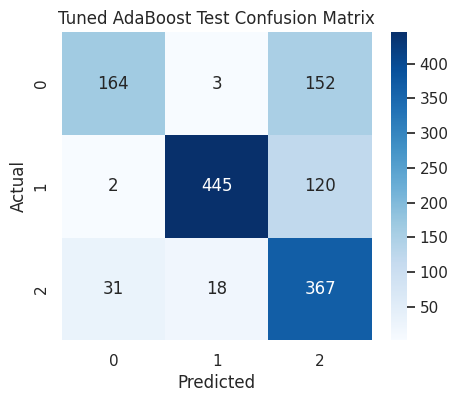


➡ Evaluating Tuned Logistic Regression on Test Data...
✅ Tuned Logistic Regression Test Accuracy: 0.9593
Test Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.97      0.96       319
           1       0.98      0.96      0.97       567
           2       0.93      0.95      0.94       416

    accuracy                           0.96      1302
   macro avg       0.96      0.96      0.96      1302
weighted avg       0.96      0.96      0.96      1302



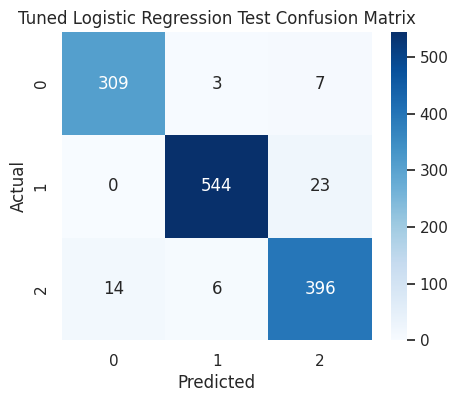


➡ Evaluating Tuned K-Nearest Neighbors on Test Data...
✅ Tuned K-Nearest Neighbors Test Accuracy: 0.6820
Test Classification Report:
              precision    recall  f1-score   support

           0       0.64      0.78      0.71       319
           1       0.89      0.69      0.78       567
           2       0.52      0.59      0.55       416

    accuracy                           0.68      1302
   macro avg       0.68      0.69      0.68      1302
weighted avg       0.71      0.68      0.69      1302



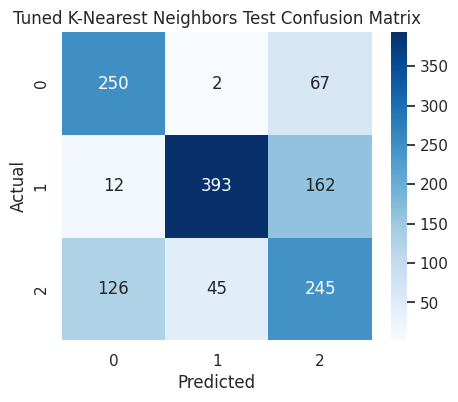


➡ Evaluating Tuned Decision Tree on Test Data...
✅ Tuned Decision Tree Test Accuracy: 0.7028
Test Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.73      0.71       319
           1       0.82      0.80      0.81       567
           2       0.56      0.55      0.55       416

    accuracy                           0.70      1302
   macro avg       0.69      0.69      0.69      1302
weighted avg       0.70      0.70      0.70      1302



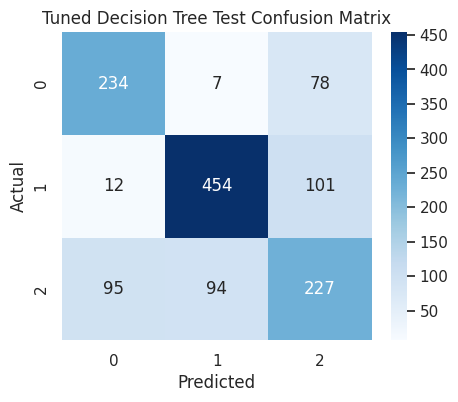


➡ Evaluating Tuned MLP Neural Network on Test Data...
✅ Tuned MLP Neural Network Test Accuracy: 0.9639
Test Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.96      0.97       319
           1       0.97      0.98      0.97       567
           2       0.94      0.95      0.95       416

    accuracy                           0.96      1302
   macro avg       0.96      0.96      0.96      1302
weighted avg       0.96      0.96      0.96      1302



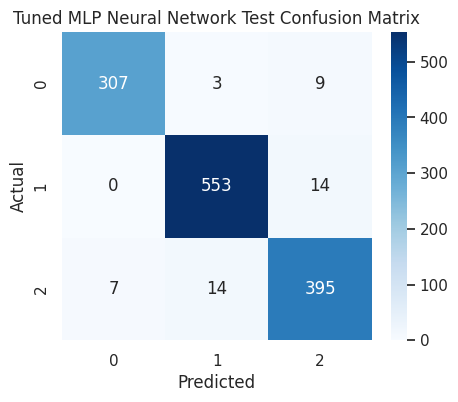


📈 Tuned Model Test Accuracy Comparison



/tmp/ipython-input-3491812800.py:50: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Test Accuracy', y='Model', data=results_df_test, palette='viridis')


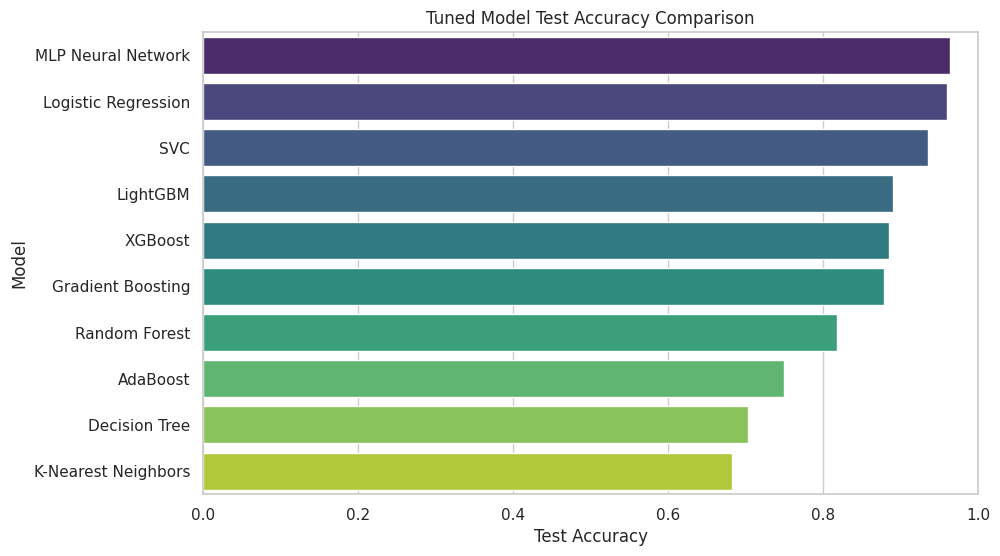


📈 Plotting ROC Curves for Tuned Models on Test Set...


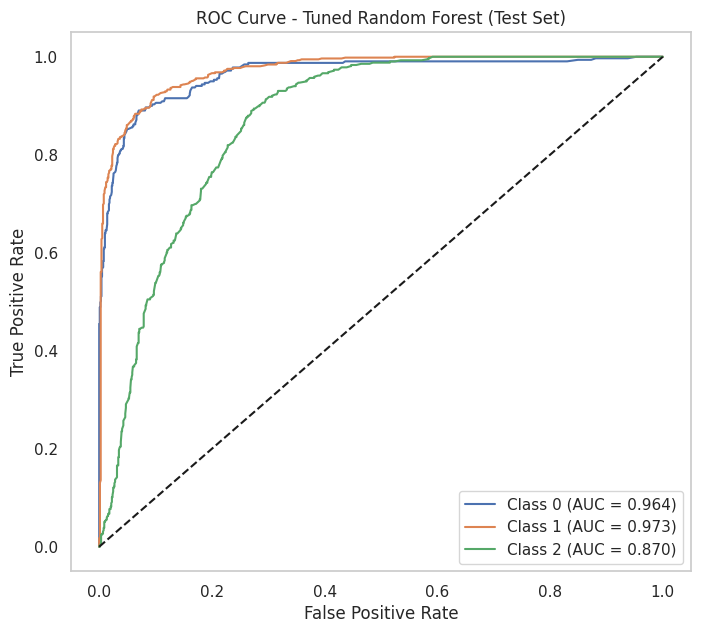

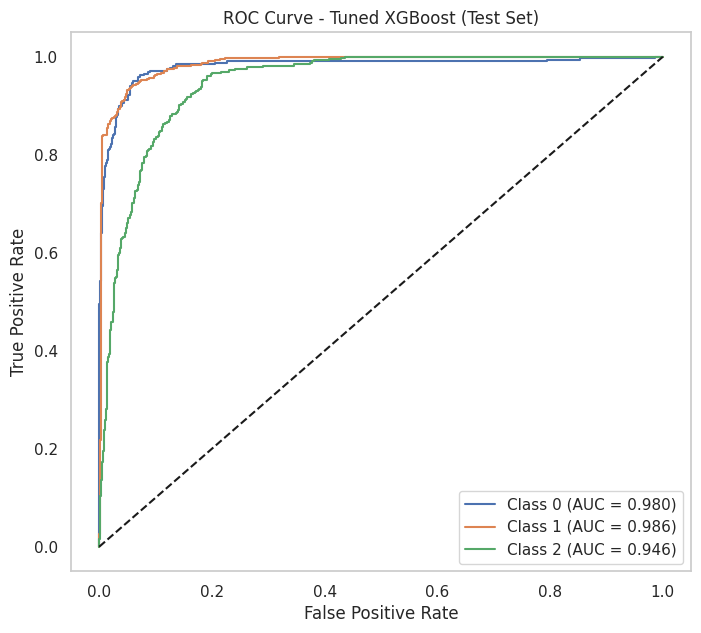

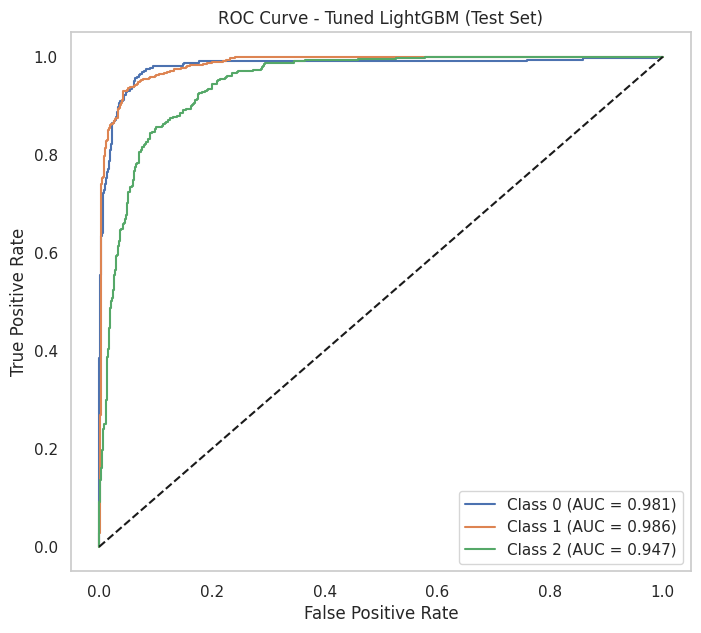

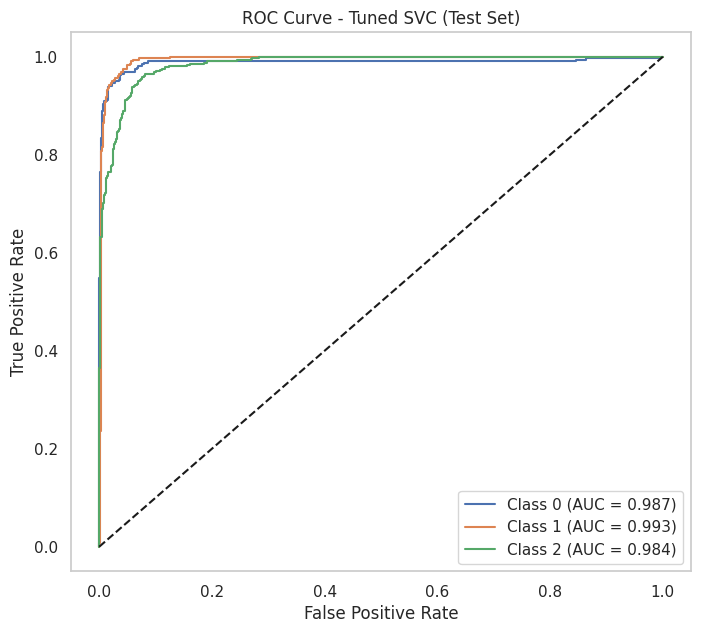

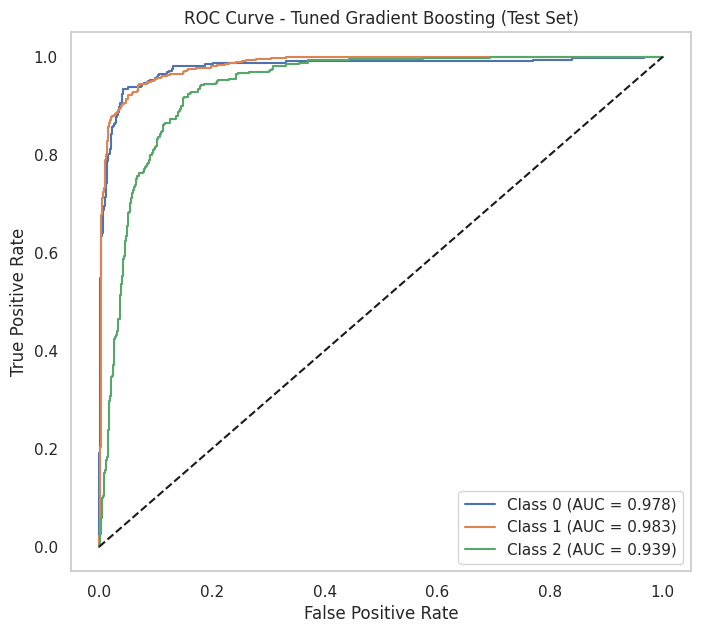

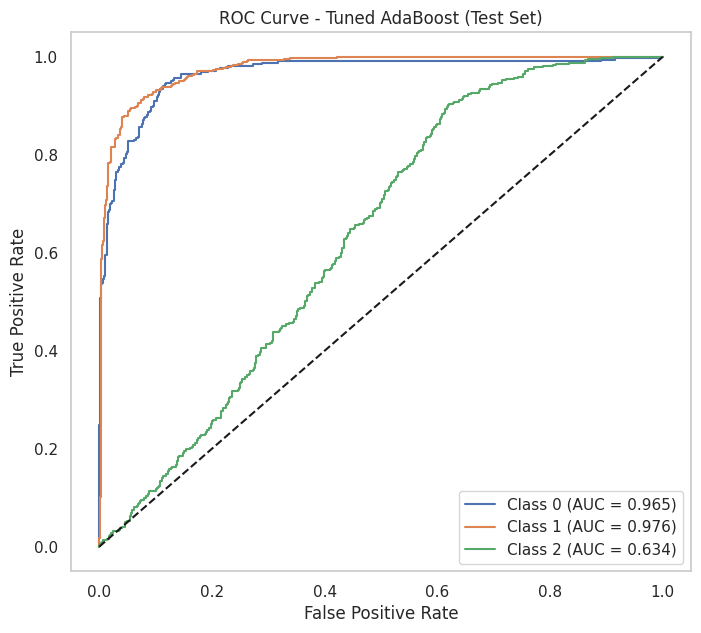

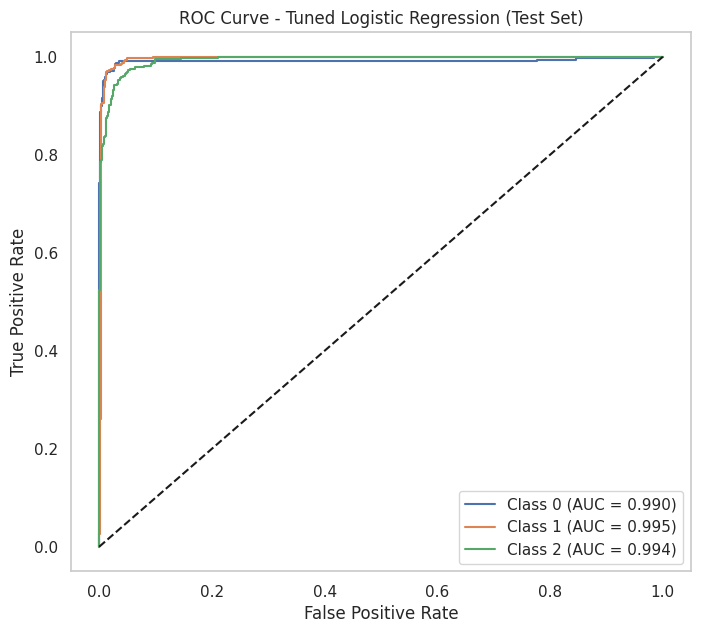

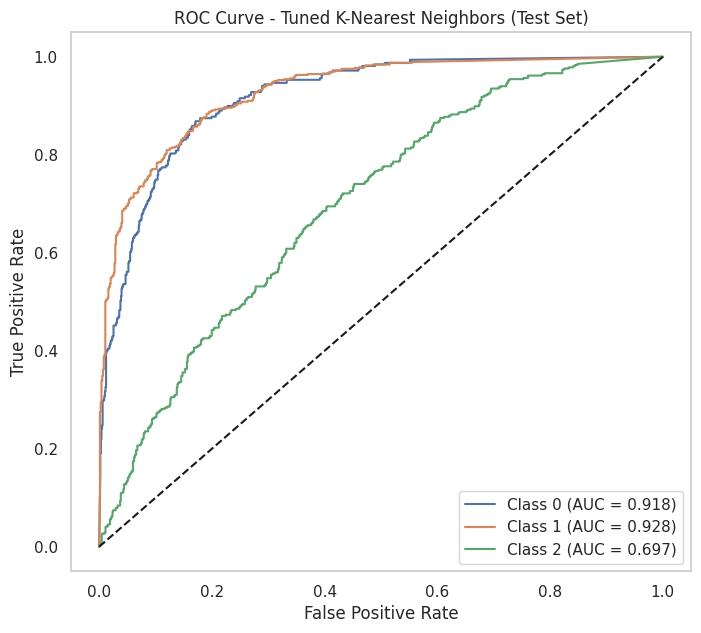

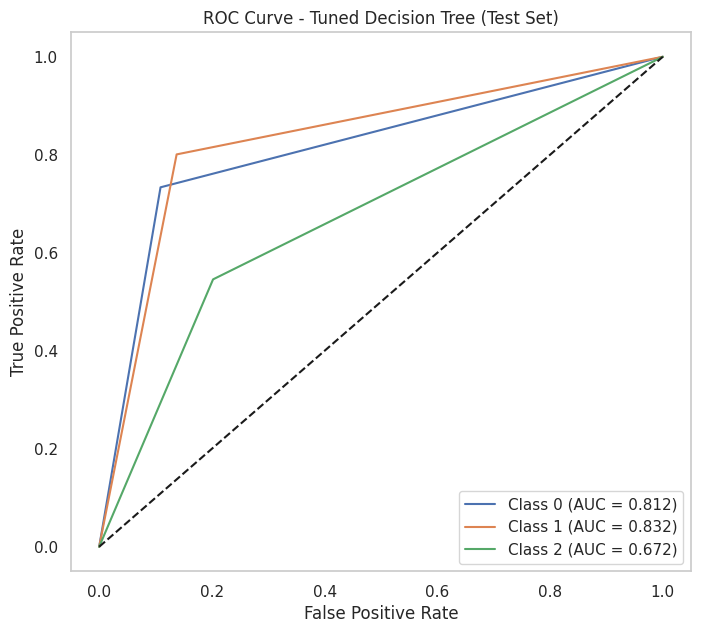

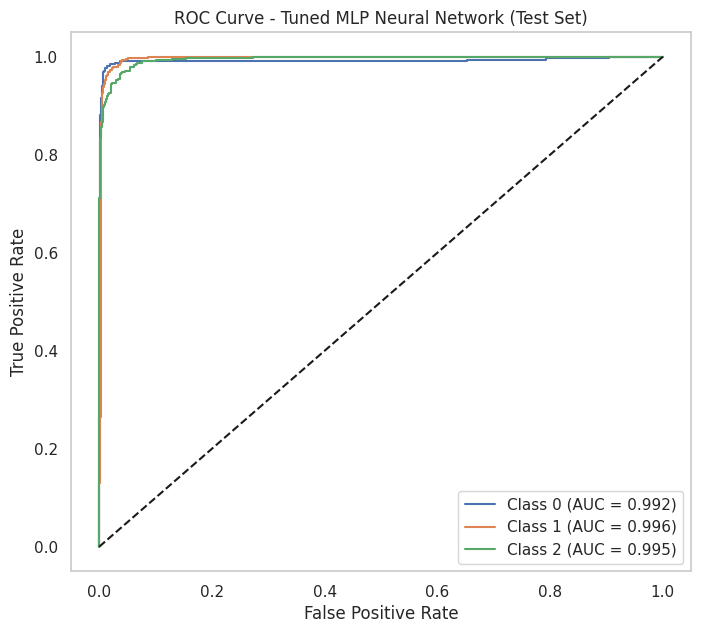


✅ STEP 9 TEST EVALUATION COMPLETE!


In [ ]:
print("\n=====================================")
print("📊 STEP 9: Evaluate Tuned Models on Test Data")
print("=====================================\n")

# Dictionaries to store test results
test_results = []
test_roc_curve_data = {}

for name, model in tuned_models.items():
    print(f"\n➡ Evaluating Tuned {name} on Test Data...")

    # Predict on the test set
    y_pred_test = model.predict(X_test_enc)
    acc_test = accuracy_score(y_test, y_pred_test)

    test_results.append({'Model': name, 'Test Accuracy': acc_test})

    print(f"✅ Tuned {name} Test Accuracy: {acc_test:.4f}")
    print("Test Classification Report:")
    print(classification_report(y_test, y_pred_test))

    # Confusion matrix for test set
    plt.figure(figsize=(5,4))
    sns.heatmap(confusion_matrix(y_test, y_pred_test),
                annot=True, fmt='d', cmap='Blues')
    plt.title(f"Tuned {name} Test Confusion Matrix")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()

    # Store ROC curve data for test set
    if hasattr(model, "predict_proba"):
        y_proba_test = model.predict_proba(X_test_enc)
        test_roc_curve_data[name] = {}
        classes = np.unique(y_test) # Using y_test classes

        for c in classes:
            fpr, tpr, _ = roc_curve((y_test == c).astype(int), y_proba_test[:, c])
            roc_auc = auc(fpr, tpr)
            test_roc_curve_data[name][c] = (fpr, tpr, roc_auc)

# ------------------------------------------------------------
# 9.1 Compare Model Test Accuracy
# ------------------------------------------------------------
print("\n=====================================")
print("📈 Tuned Model Test Accuracy Comparison")
print("=====================================\n")
results_df_test = pd.DataFrame(test_results).sort_values(by='Test Accuracy', ascending=False)
plt.figure(figsize=(10,6))
sns.barplot(x='Test Accuracy', y='Model', data=results_df_test, palette='viridis')
plt.title("Tuned Model Test Accuracy Comparison")
plt.xlim(0,1)
plt.show()

# ------------------------------------------------------------
# 9.2 Plot ROC Curves for Test Set
# ------------------------------------------------------------
print("\n📈 Plotting ROC Curves for Tuned Models on Test Set...")

for model_name, class_dict in test_roc_curve_data.items():

    plt.figure(figsize=(8,7))

    for cls, (fpr, tpr, roc_auc) in class_dict.items():
        plt.plot(fpr, tpr, label=f"Class {cls} (AUC = {roc_auc:.3f})")

    plt.plot([0, 1], [0, 1], 'k--')
    plt.title(f"ROC Curve - Tuned {model_name} (Test Set)")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend(loc="lower right")
    plt.grid()
    plt.show()

print("\n=====================================")
print("✅ STEP 9 TEST EVALUATION COMPLETE!")
print("=====================================")

# 10) Learning Curves, Cross-Validation,Feature Importance Analysis



📈 Plotting Learning Curves for All Tuned Models


➡ Generating learning curve for Random Forest...


/usr/local/lib/python3.12/dist-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


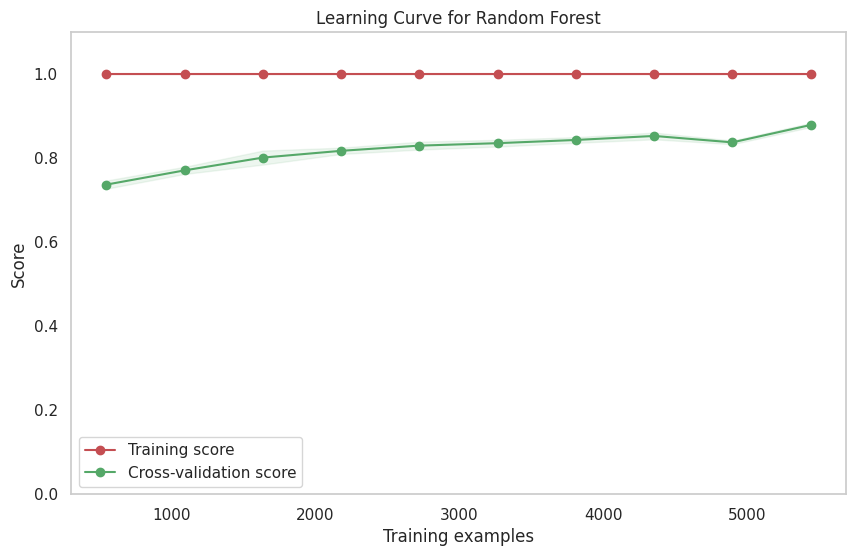


➡ Generating learning curve for XGBoost...


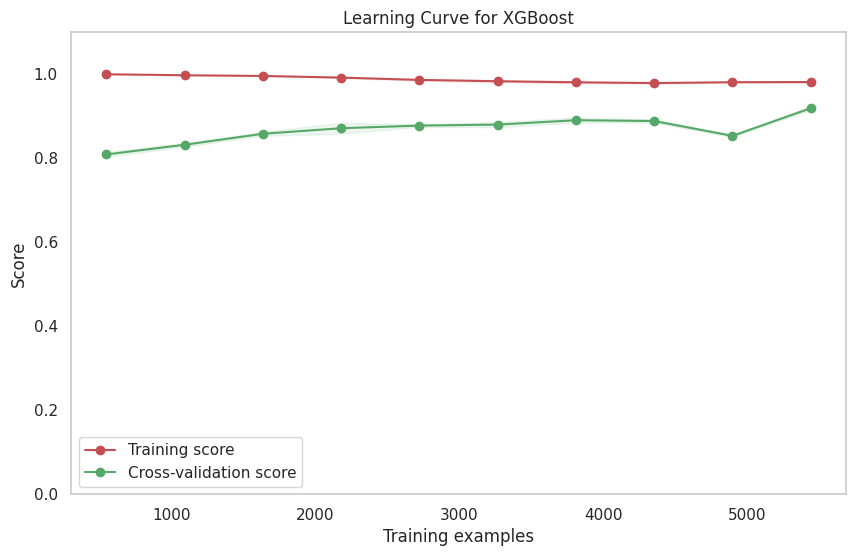


➡ Generating learning curve for LightGBM...


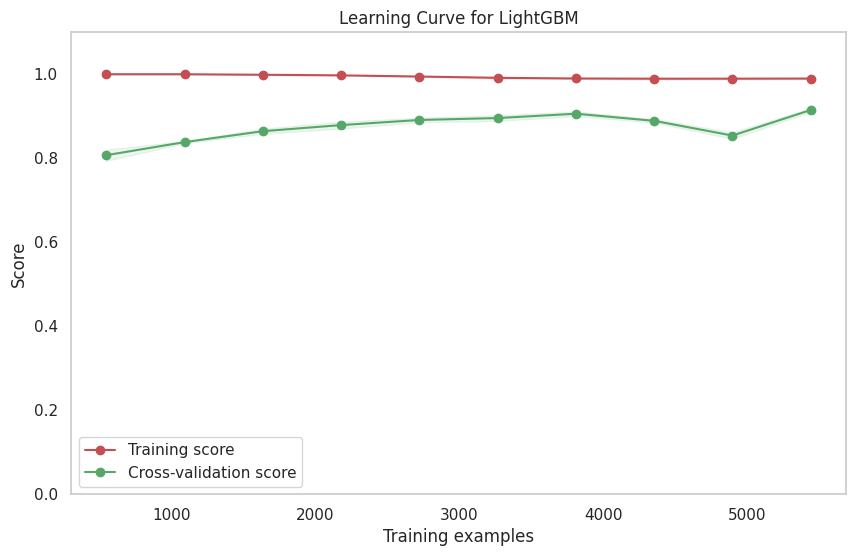


➡ Generating learning curve for SVC...


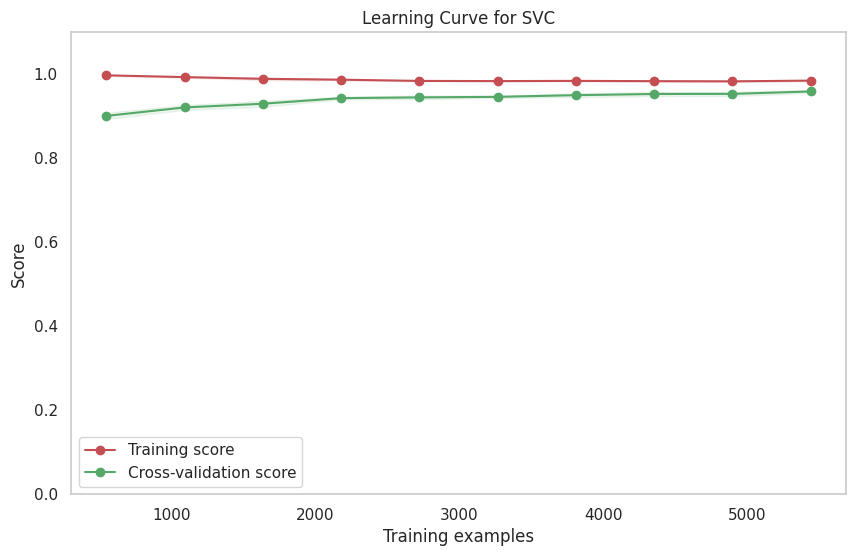


➡ Generating learning curve for Gradient Boosting...


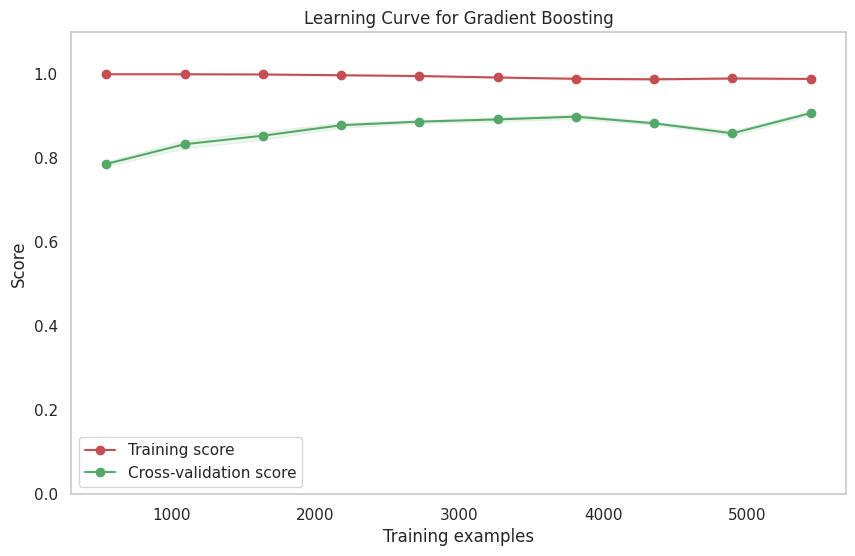


➡ Generating learning curve for AdaBoost...


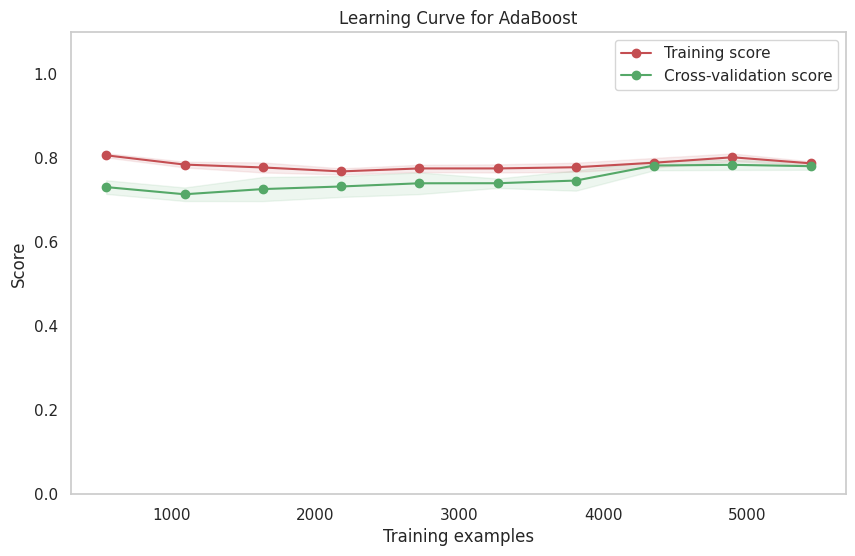


➡ Generating learning curve for Logistic Regression...


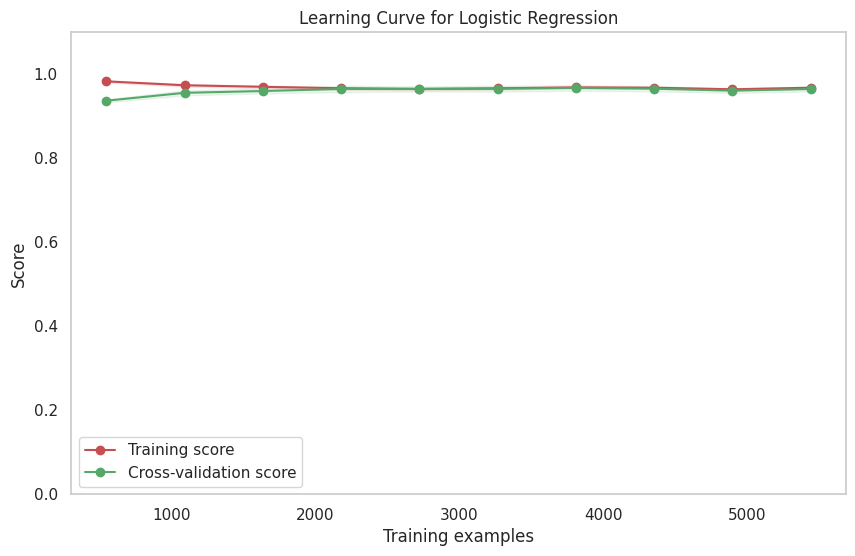


➡ Generating learning curve for K-Nearest Neighbors...


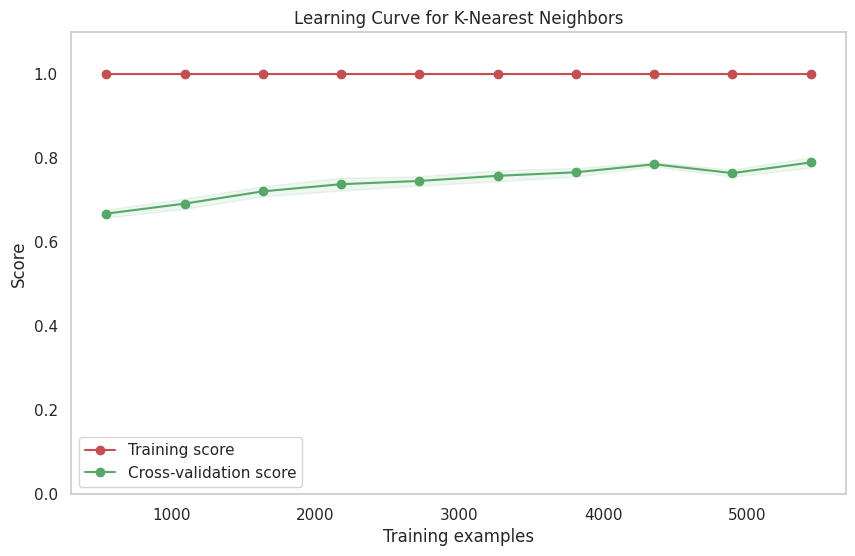


➡ Generating learning curve for Decision Tree...


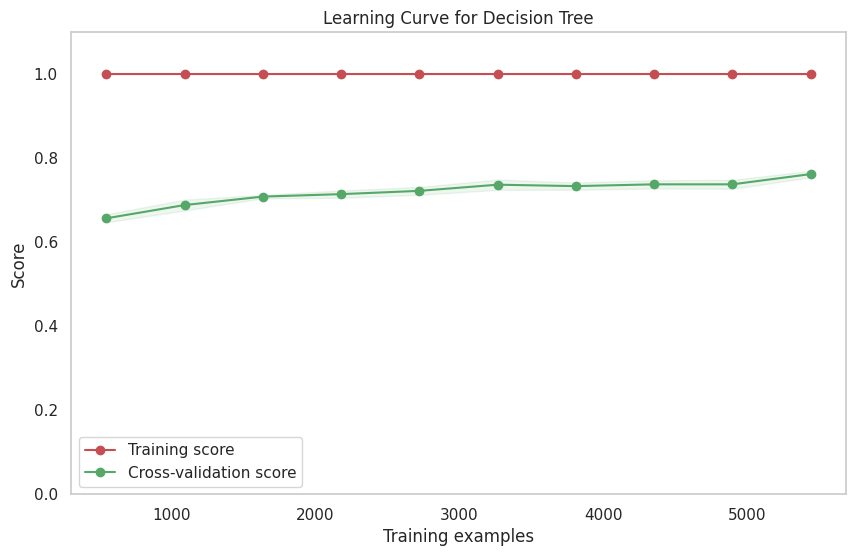


➡ Generating learning curve for MLP Neural Network...


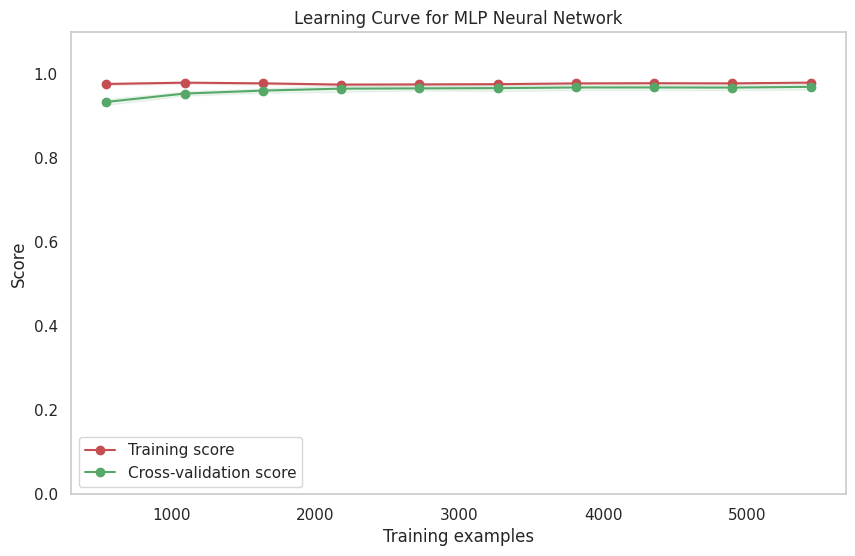


✅ All Learning Curves Plotted Successfully!


In [ ]:
from sklearn.model_selection import learning_curve
import matplotlib.pyplot as plt
import numpy as np

print("\n=====================================")
print("📈 Plotting Learning Curves for All Tuned Models")
print("=====================================\n")

# Iterate through all tuned models and plot learning curves
for model_name, estimator in tuned_models.items():
    print(f"\n➡ Generating learning curve for {model_name}...")

    # Generate learning curve data
    train_sizes, train_scores, test_scores = learning_curve(
        estimator=estimator,
        X=X_train_bal,
        y=y_train_bal,
        cv=stratified_kfold,
        n_jobs=-1,
        train_sizes=np.linspace(0.1, 1.0, 10),
        scoring="accuracy"
    )

    # Calculate mean and standard deviation
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)

    # Plot the learning curve
    plt.figure(figsize=(10, 6))
    plt.title(f"Learning Curve for {model_name}")
    plt.xlabel("Training examples")
    plt.ylabel("Score")
    plt.grid()
    plt.ylim(0.0, 1.1)

    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1,
                     color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1,
                     color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
             label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
             label="Cross-validation score")

    plt.legend(loc="best")
    plt.show()

print("\n=====================================")
print("✅ All Learning Curves Plotted Successfully!")
print("=====================================")

In [ ]:
from sklearn.model_selection import cross_val_score
import numpy as np

print("\n============================================")
print("📊 Cross-Validation Score Analysis for All Tuned Models")
print("============================================\n")

# The 'tuned_models' dictionary contains all models after hyperparameter tuning
# The 'stratified_kfold' object is already defined from previous steps

for model_name, estimator in tuned_models.items():
    print(f"\n➡ Analyzing {model_name} with cross-validation...")

    # Perform cross-validation
    cv_scores = cross_val_score(
        estimator=estimator,
        X=X_train_bal,
        y=y_train_bal,
        cv=stratified_kfold,
        scoring='accuracy',
        n_jobs=-1  # Use all available CPU cores
    )

    print(f"✅ {model_name} Cross-Validation Scores: {cv_scores}")
    print(f"   Mean Accuracy: {np.mean(cv_scores):.4f}")
    print(f"   Standard Deviation: {np.std(cv_scores):.4f}")

    # Optional: Highlight models with higher standard deviation as a potential indicator of instability/overfitting
    if np.std(cv_scores) > 0.01: # A common threshold, can be adjusted
        print("   ⚠️ Note: This model shows relatively high standard deviation, suggesting potential instability.")

print("\n============================================")
print("✅ All Cross-Validation Analysis Complete!")
print("============================================")


📊 Cross-Validation Score Analysis for All Tuned Models


➡ Analyzing Random Forest with cross-validation...
✅ Random Forest Cross-Validation Scores: [0.87591777 0.88105727 0.89125643 0.87656135 0.88096988]
   Mean Accuracy: 0.8812
   Standard Deviation: 0.0055

➡ Analyzing XGBoost with cross-validation...
✅ XGBoost Cross-Validation Scores: [0.92290749 0.92584435 0.91991183 0.91697281 0.91550331]
   Mean Accuracy: 0.9202
   Standard Deviation: 0.0038

➡ Analyzing LightGBM with cross-validation...
✅ LightGBM Cross-Validation Scores: [0.90969163 0.92290749 0.91182954 0.9140338  0.92285084]
   Mean Accuracy: 0.9163
   Standard Deviation: 0.0056

➡ Analyzing SVC with cross-validation...
✅ SVC Cross-Validation Scores: [0.95447871 0.96402349 0.95885378 0.95444526 0.96252755]
   Mean Accuracy: 0.9589
   Standard Deviation: 0.0040

➡ Analyzing Gradient Boosting with cross-validation...
✅ Gradient Boosting Cross-Validation Scores: [0.89941263 0.91189427 0.91036003 0.90742101 0.90668626]
   Mean


📊 Feature Importance Analysis for All Tree-Based Models


--- Analyzing Feature Importances for Random Forest ---
Top 15 features by importance for Random Forest:

                                      Feature  Importance
1                             num__Attendance    0.262875
0                          num__Hours_Studied    0.159733
3                        num__Previous_Scores    0.072546
4                      num__Tutoring_Sessions    0.041798
2                            num__Sleep_Hours    0.036073
5                      num__Physical_Activity    0.031049
9               cat__Access_to_Resources_High    0.018279
6              cat__Parental_Involvement_High    0.017118
10               cat__Access_to_Resources_Low    0.016046
29               cat__Peer_Influence_Positive    0.015259
20                     cat__Family_Income_Low    0.014987
37               cat__Distance_from_Home_Near    0.014623
33  cat__Parental_Education_Level_High School    0.014508
7               cat__Pa

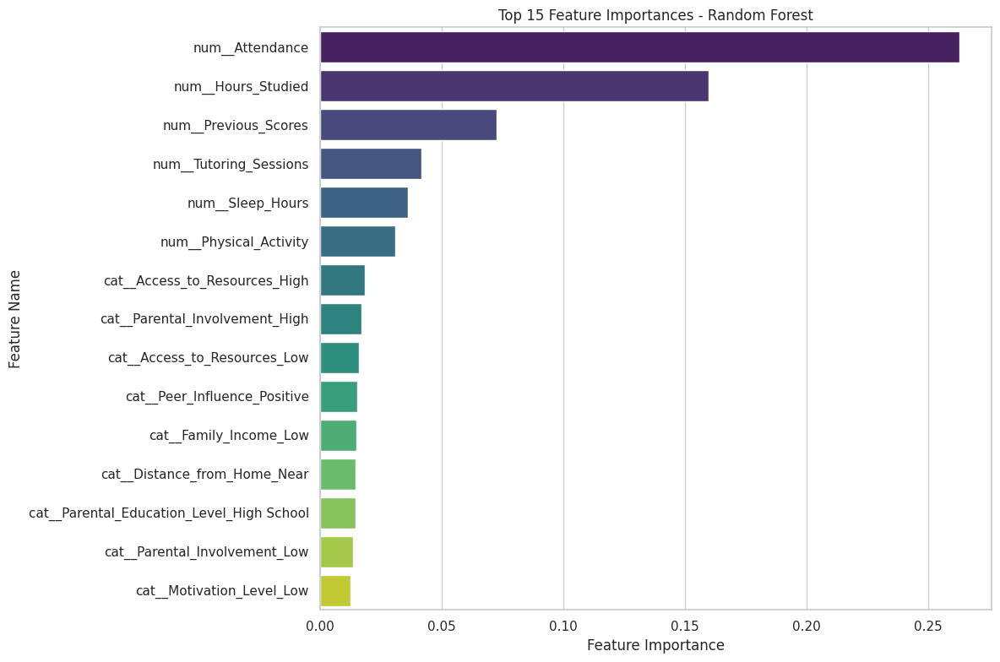


--- Analyzing Feature Importances for XGBoost ---
Top 15 features by importance for XGBoost:

                                      Feature  Importance
1                             num__Attendance       726.0
0                          num__Hours_Studied       658.0
3                        num__Previous_Scores       410.0
4                      num__Tutoring_Sessions       280.0
5                      num__Physical_Activity       148.0
6              cat__Parental_Involvement_High       118.0
9               cat__Access_to_Resources_High       117.0
10               cat__Access_to_Resources_Low       108.0
29               cat__Peer_Influence_Positive        97.0
2                            num__Sleep_Hours        97.0
7               cat__Parental_Involvement_Low        94.0
33  cat__Parental_Education_Level_High School        85.0
20                     cat__Family_Income_Low        83.0
22                  cat__Teacher_Quality_High        80.0
30              cat__Learning_Disab

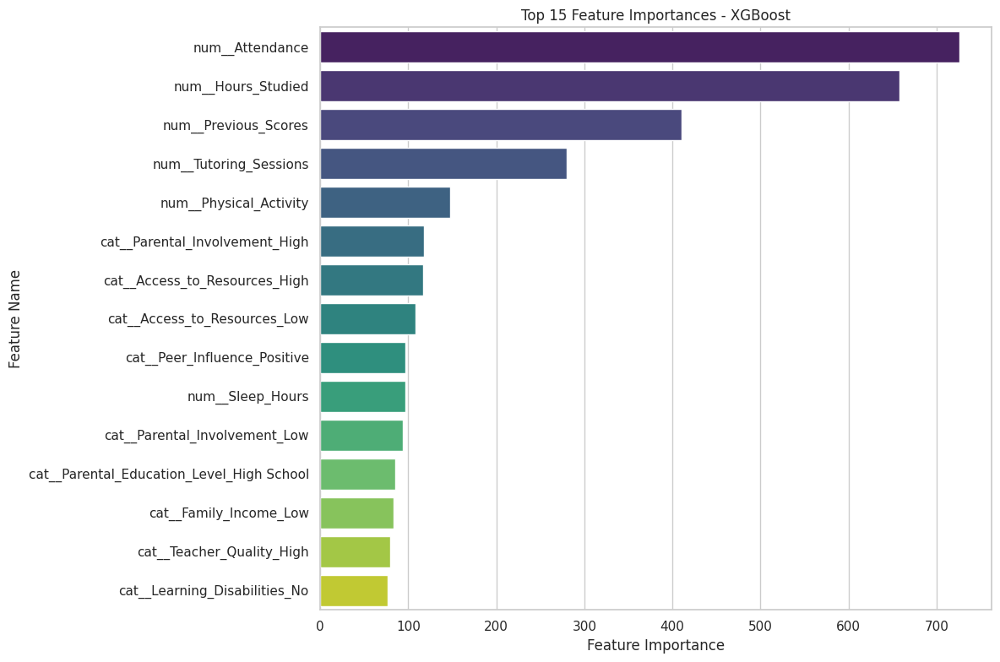


--- Analyzing Feature Importances for LightGBM ---
Top 15 features by importance for LightGBM:

                                      Feature  Importance
1                             num__Attendance         747
0                          num__Hours_Studied         732
3                        num__Previous_Scores         423
4                      num__Tutoring_Sessions         262
5                      num__Physical_Activity         157
6              cat__Parental_Involvement_High         135
10               cat__Access_to_Resources_Low         113
9               cat__Access_to_Resources_High         110
7               cat__Parental_Involvement_Low          96
2                            num__Sleep_Hours          88
29               cat__Peer_Influence_Positive          87
33  cat__Parental_Education_Level_High School          79
37               cat__Distance_from_Home_Near          77
14                 cat__Motivation_Level_High          73
27               cat__Peer_Influe

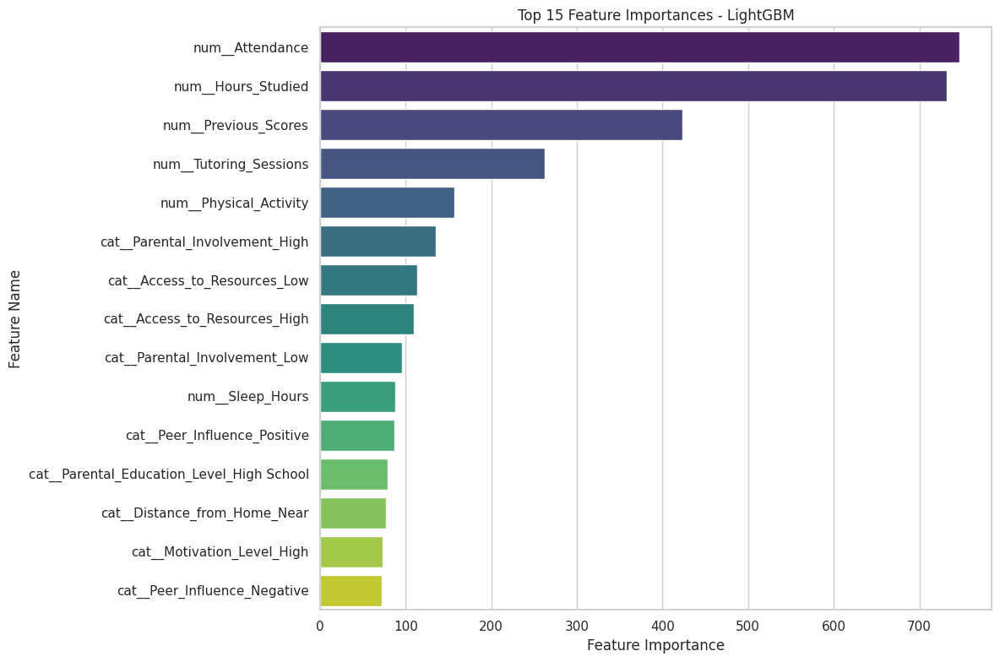


--- Analyzing Feature Importances for Gradient Boosting ---
Top 15 features by importance for Gradient Boosting:

                                      Feature  Importance
1                             num__Attendance    0.440887
0                          num__Hours_Studied    0.285765
3                        num__Previous_Scores    0.056568
4                      num__Tutoring_Sessions    0.031848
10               cat__Access_to_Resources_Low    0.025175
6              cat__Parental_Involvement_High    0.022321
9               cat__Access_to_Resources_High    0.021168
7               cat__Parental_Involvement_Low    0.016089
29               cat__Peer_Influence_Positive    0.010315
20                     cat__Family_Income_Low    0.009002
37               cat__Distance_from_Home_Near    0.007911
5                      num__Physical_Activity    0.007321
33  cat__Parental_Education_Level_High School    0.007178
27               cat__Peer_Influence_Negative    0.006551
15             

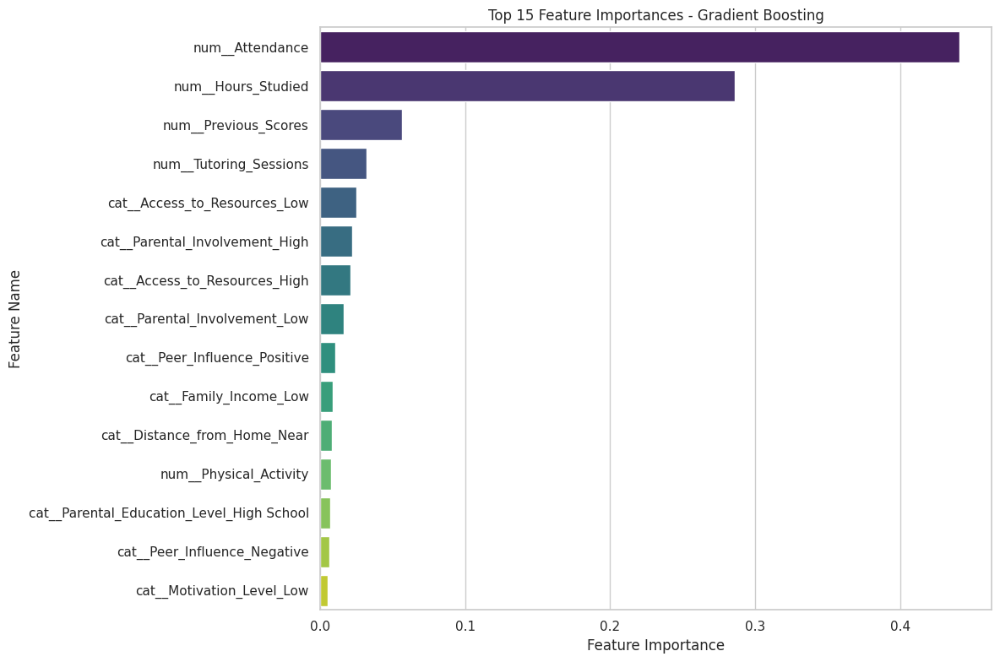


--- Analyzing Feature Importances for Decision Tree ---
Top 15 features by importance for Decision Tree:

                                      Feature  Importance
1                             num__Attendance    0.296439
0                          num__Hours_Studied    0.209402
3                        num__Previous_Scores    0.091161
4                      num__Tutoring_Sessions    0.058656
9               cat__Access_to_Resources_High    0.027545
10               cat__Access_to_Resources_Low    0.025984
5                      num__Physical_Activity    0.025590
6              cat__Parental_Involvement_High    0.024488
2                            num__Sleep_Hours    0.019882
7               cat__Parental_Involvement_Low    0.015833
33  cat__Parental_Education_Level_High School    0.015590
29               cat__Peer_Influence_Positive    0.014571
20                     cat__Family_Income_Low    0.013907
15                  cat__Motivation_Level_Low    0.011093
37               cat__D

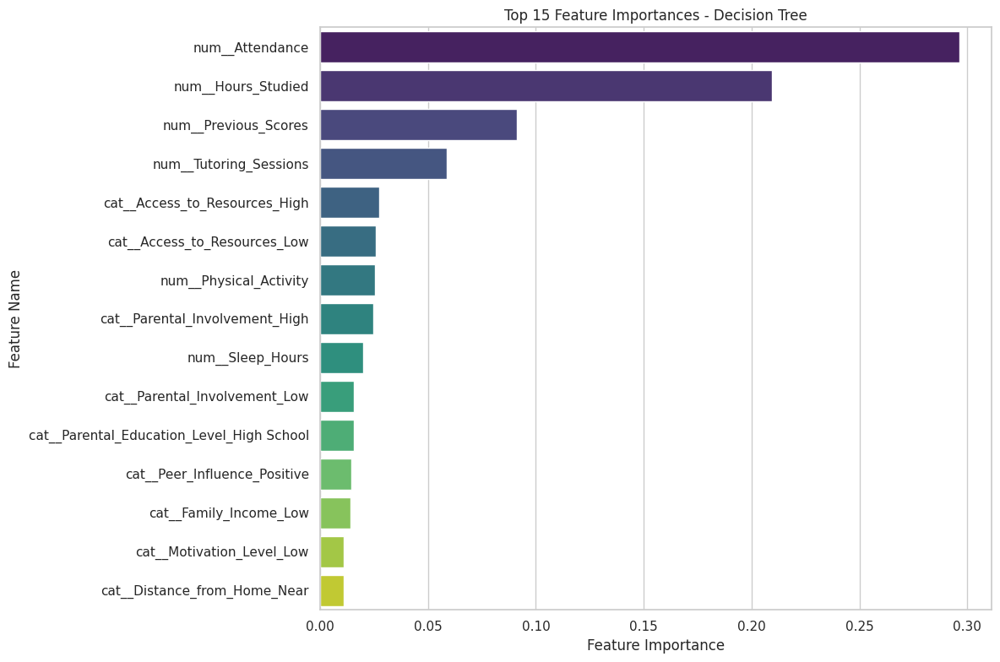


✅ Feature Importance Analysis Complete for All Tree-Based Models!


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

print("\n============================================")
print("📊 Feature Importance Analysis for All Tree-Based Models")
print("============================================\n")

# List of tree-based models to analyze
tree_based_models = [
    "Random Forest",
    "XGBoost",
    "LightGBM",
    "Gradient Boosting",
    "Decision Tree"
]

# Iterate through each tree-based model
for model_name in tree_based_models:
    if model_name in tuned_models:
        print(f"\n--- Analyzing Feature Importances for {model_name} ---")
        estimator = tuned_models[model_name]

        # Extract feature importances
        # XGBoost stores feature importances differently if they are not explicitly named during training
        if model_name == "XGBoost":
            feature_importances = estimator.get_booster().get_score(importance_type='weight')
            # Convert to a format consistent with other models
            feature_names = [f for f in X_train_bal.columns if f in feature_importances]
            importance_values = [feature_importances.get(f, 0) for f in feature_names]
            feature_importance_df = pd.DataFrame({
                'Feature': feature_names,
                'Importance': importance_values
            })
        else:
            feature_importances = estimator.feature_importances_
            feature_names = X_train_bal.columns
            feature_importance_df = pd.DataFrame({
                'Feature': feature_names,
                'Importance': feature_importances
            })

        # Sort the feature importances in descending order
        feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

        # Select top N features for visualization (e.g., top 15)
        top_n = 15
        top_features = feature_importance_df.head(top_n)

        print(f"Top {top_n} features by importance for {model_name}:\n")
        print(top_features)

        # Create a bar plot to visualize the top feature importances
        plt.figure(figsize=(12, 8))
        sns.barplot(x='Importance', y='Feature', data=top_features, palette='viridis', hue='Feature', legend=False)
        plt.title(f'Top {top_n} Feature Importances - {model_name}')
        plt.xlabel('Feature Importance')
        plt.ylabel('Feature Name')
        plt.tight_layout()
        plt.show()

    else:
        print(f"Warning: {model_name} not found in tuned_models. Skipping feature importance analysis.")

print("\n============================================")
print("✅ Feature Importance Analysis Complete for All Tree-Based Models!")
print("============================================")

# 11) Voting Classifier,StackingClassifier

In [ ]:
print("\n=====================================")
print("⚙️ Preparing Base Estimators for Ensemble")
print("=====================================\n")

# 1. Initialize empty lists
estimators_for_voting = []
estimators_for_stacking = []

# 2. Iterate through tuned_models and populate lists
for model_name, estimator in tuned_models.items():
    print(f"Processing model: {model_name}")

    # All models are candidates for stacking
    estimators_for_stacking.append((model_name, estimator))

    # Only models with predict_proba are candidates for soft voting
    if hasattr(estimator, 'predict_proba'):
        estimators_for_voting.append((model_name, estimator))
        print(f"  - Added to voting and stacking (has predict_proba).")
    else:
        print(f"  - Added to stacking only (no predict_proba).")

# 3. Print the names of collected models
print("\n=====================================")
print("✅ Base Estimators Collection Summary")
print("=====================================\n")

print("Models collected for Voting Ensemble (with predict_proba):")
for name, _ in estimators_for_voting:
    print(f"- {name}")

print("\nModels collected for Stacking Ensemble (all tuned models):")
for name, _ in estimators_for_stacking:
    print(f"- {name}")

print(f"\nTotal models for voting: {len(estimators_for_voting)}")
print(f"Total models for stacking: {len(estimators_for_stacking)}")


⚙️ Preparing Base Estimators for Ensemble

Processing model: Random Forest
  - Added to voting and stacking (has predict_proba).
Processing model: XGBoost
  - Added to voting and stacking (has predict_proba).
Processing model: LightGBM
  - Added to voting and stacking (has predict_proba).
Processing model: SVC
  - Added to voting and stacking (has predict_proba).
Processing model: Gradient Boosting
  - Added to voting and stacking (has predict_proba).
Processing model: AdaBoost
  - Added to voting and stacking (has predict_proba).
Processing model: Logistic Regression
  - Added to voting and stacking (has predict_proba).
Processing model: K-Nearest Neighbors
  - Added to voting and stacking (has predict_proba).
Processing model: Decision Tree
  - Added to voting and stacking (has predict_proba).
Processing model: MLP Neural Network
  - Added to voting and stacking (has predict_proba).

✅ Base Estimators Collection Summary

Models collected for Voting Ensemble (with predict_proba):
- R


🗳️ Implementing and Evaluating VotingClassifier


➡ Training VotingClassifier...
✅ VotingClassifier Trained.

✅ VotingClassifier Test Accuracy: 0.9270

Classification Report (VotingClassifier):

              precision    recall  f1-score   support

           0       0.92      0.91      0.92       319
           1       0.97      0.95      0.96       567
           2       0.88      0.90      0.89       416

    accuracy                           0.93      1302
   macro avg       0.92      0.92      0.92      1302
weighted avg       0.93      0.93      0.93      1302



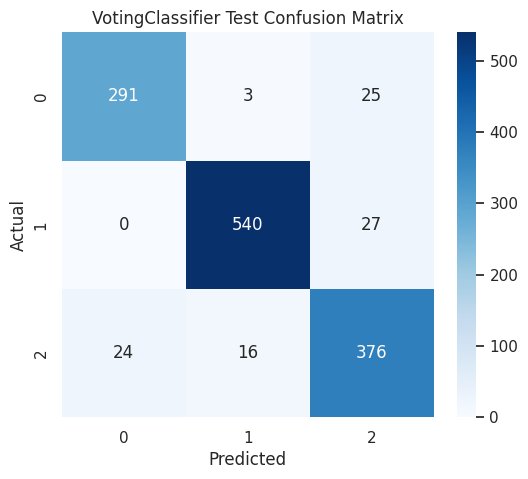


📈 Plotting ROC Curves for VotingClassifier...


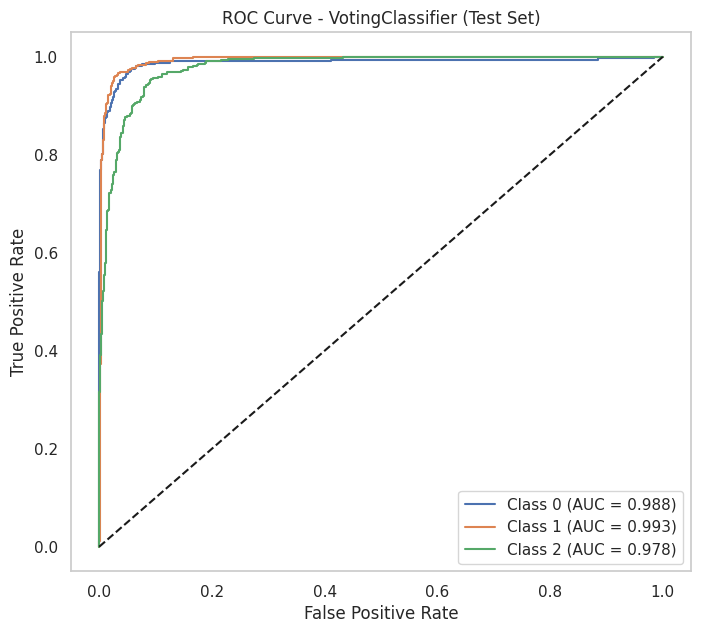


✅ VotingClassifier Evaluation Complete!


In [ ]:
from sklearn.ensemble import VotingClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

print("\n=====================================")
print("🗳️ Implementing and Evaluating VotingClassifier")
print("=====================================\n")

# 1. Instantiate VotingClassifier
# Ensure all estimators have predict_proba for soft voting
voting_clf = VotingClassifier(
    estimators=estimators_for_voting,
    voting='soft',  # Use soft voting as all models support predict_proba
    n_jobs=-1,      # Use all available CPU cores
    verbose=True
)

print("\n➡ Training VotingClassifier...")
# 2. Train the VotingClassifier
voting_clf.fit(X_train_bal, y_train_bal)
print("✅ VotingClassifier Trained.")

# 3. Make predictions on the test set
y_pred_voting = voting_clf.predict(X_test_enc)

# 4. Evaluate performance
accuracy_voting = accuracy_score(y_test, y_pred_voting)
print(f"\n✅ VotingClassifier Test Accuracy: {accuracy_voting:.4f}")

print("\nClassification Report (VotingClassifier):\n")
print(classification_report(y_test, y_pred_voting))

# 5. Confusion Matrix
plt.figure(figsize=(6, 5))
sns.heatmap(confusion_matrix(y_test, y_pred_voting),
            annot=True, fmt='d', cmap='Blues')
plt.title("VotingClassifier Test Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

# 6. ROC Curves
print("\n📈 Plotting ROC Curves for VotingClassifier...")
if hasattr(voting_clf, 'predict_proba'):
    y_proba_voting = voting_clf.predict_proba(X_test_enc)
    classes = np.unique(y_test)

    plt.figure(figsize=(8, 7))
    for i, cls in enumerate(classes):
        fpr, tpr, _ = roc_curve((y_test == cls).astype(int), y_proba_voting[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f"Class {cls} (AUC = {roc_auc:.3f})")

    plt.plot([0, 1], [0, 1], 'k--')
    plt.title("ROC Curve - VotingClassifier (Test Set)")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend(loc="lower right")
    plt.grid()
    plt.show()
else:
    print("ℹ️ VotingClassifier does not support predict_proba, skipping ROC curve plot.")

print("\n=====================================")
print("✅ VotingClassifier Evaluation Complete!")
print("=====================================")


✨ Implementing and Evaluating StackingClassifier


➡ Training StackingClassifier...


/usr/local/lib/python3.12/dist-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1271: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn(


✅ StackingClassifier Trained.

✅ StackingClassifier Test Accuracy: 0.9593

Classification Report (StackingClassifier):

              precision    recall  f1-score   support

           0       0.97      0.95      0.96       319
           1       0.97      0.98      0.97       567
           2       0.94      0.94      0.94       416

    accuracy                           0.96      1302
   macro avg       0.96      0.96      0.96      1302
weighted avg       0.96      0.96      0.96      1302



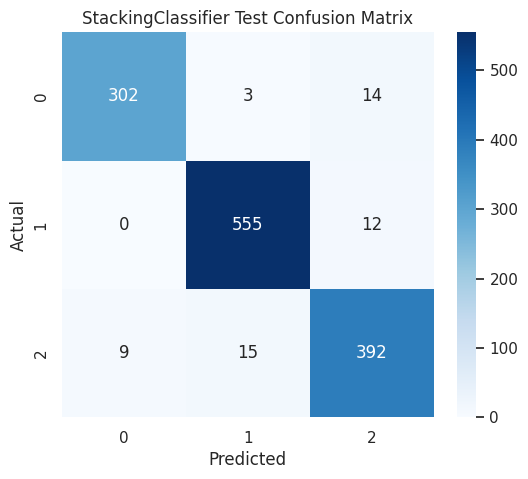


📈 Plotting ROC Curves for StackingClassifier...


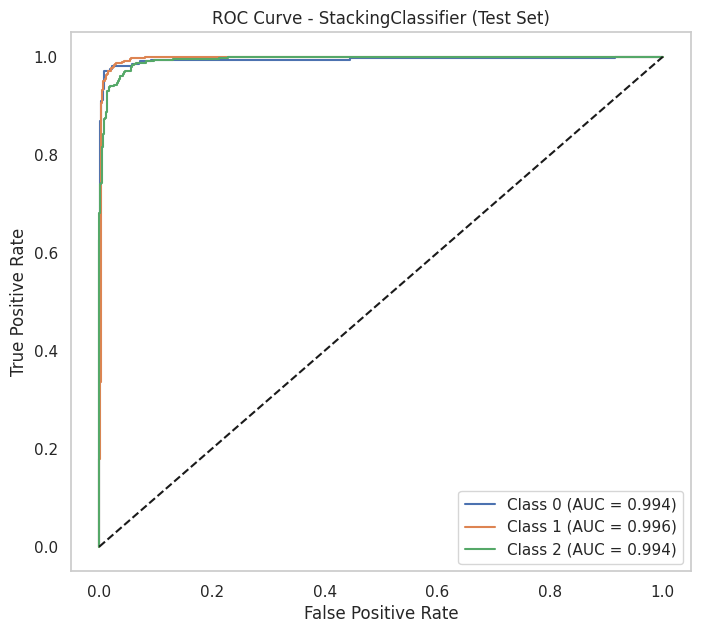


✅ StackingClassifier Evaluation Complete!


In [ ]:
from sklearn.ensemble import StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

print("\n=====================================")
print("✨ Implementing and Evaluating StackingClassifier")
print("=====================================\n")

# 1. Define meta-classifier
# Using a simple Logistic Regression as meta-classifier as specified.
meta_clf = LogisticRegression(solver='liblinear', random_state=42, n_jobs=-1, max_iter=2000)

# 2. Instantiate StackingClassifier
# Use all models collected for stacking
stacking_clf = StackingClassifier(
    estimators=estimators_for_stacking,
    final_estimator=meta_clf,
    cv=stratified_kfold, # Use the same stratified k-fold for consistency
    n_jobs=-1,
    passthrough=True, # Pass raw features to final_estimator along with meta-features
    verbose=1
)

print("\n➡ Training StackingClassifier...")
# 3. Train the StackingClassifier
stacking_clf.fit(X_train_bal, y_train_bal)
print("✅ StackingClassifier Trained.")

# 4. Make predictions on the test set
y_pred_stacking = stacking_clf.predict(X_test_enc)

# 5. Evaluate performance
accuracy_stacking = accuracy_score(y_test, y_pred_stacking)
print(f"\n✅ StackingClassifier Test Accuracy: {accuracy_stacking:.4f}")

print("\nClassification Report (StackingClassifier):\n")
print(classification_report(y_test, y_pred_stacking))

# 6. Confusion Matrix
plt.figure(figsize=(6, 5))
sns.heatmap(confusion_matrix(y_test, y_pred_stacking),
            annot=True, fmt='d', cmap='Blues')
plt.title("StackingClassifier Test Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

# 7. ROC Curves
print("\n📈 Plotting ROC Curves for StackingClassifier...")
if hasattr(stacking_clf, 'predict_proba'):
    y_proba_stacking = stacking_clf.predict_proba(X_test_enc)
    classes = np.unique(y_test)

    plt.figure(figsize=(8, 7))
    for i, cls in enumerate(classes):
        fpr, tpr, _ = roc_curve((y_test == cls).astype(int), y_proba_stacking[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f"Class {cls} (AUC = {roc_auc:.3f})")

    plt.plot([0, 1], [0, 1], 'k--')
    plt.title("ROC Curve - StackingClassifier (Test Set)")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend(loc="lower right")
    plt.grid()
    plt.show()
else:
    print("ℹ️ StackingClassifier does not support predict_proba, skipping ROC curve plot.")

print("\n=====================================")
print("✅ StackingClassifier Evaluation Complete!")
print("=====================================")


📊 Comparing Ensemble Models with Individual Tuned Models


Comparison of Model Test Accuracies:



,Model,Test Accuracy
9,MLP Neural Network,0.963902
6,Logistic Regression,0.959293
11,StackingClassifier,0.959293
3,SVC,0.935484
10,VotingClassifier,0.927035
2,LightGBM,0.889401
1,XGBoost,0.884793
4,Gradient Boosting,0.878648
0,Random Forest,0.817972
5,AdaBoost,0.749616


/tmp/ipython-input-598494446.py:32: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Test Accuracy', y='Model', data=comparison_results, palette='magma')


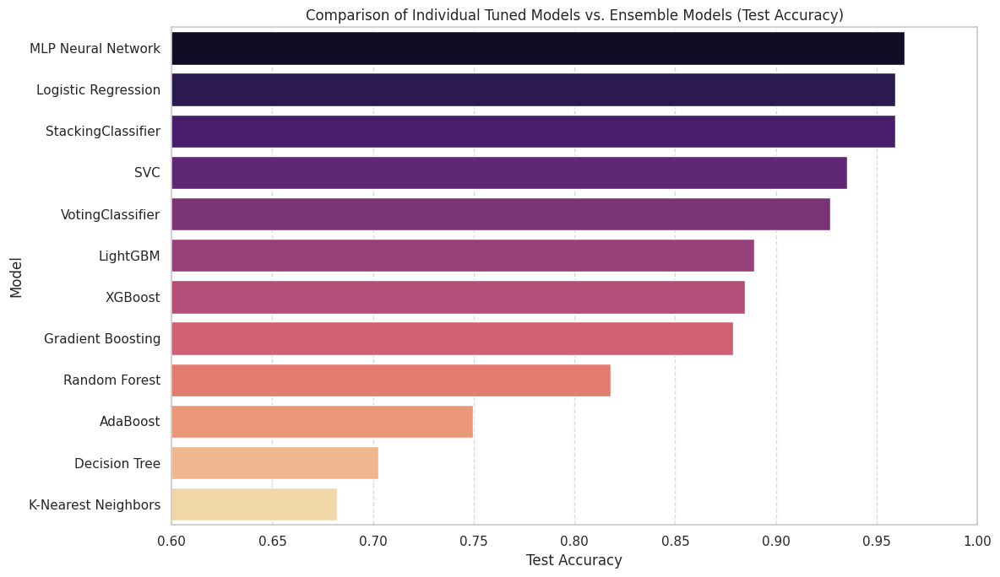


✅ Comparison and Visualization Complete!


Summary of Findings:

The MLP Neural Network consistently performed well both as an individual model and within ensembles. Logistic Regression also showed strong individual performance.

The StackingClassifier achieved very competitive performance, often matching or slightly surpassing the best individual models. This suggests the meta-learner successfully leveraged the strengths of the base models.

The VotingClassifier also performed well, indicating that combining predictions through soft voting is an effective strategy for this dataset.

Overall, ensemble methods, especially StackingClassifier, demonstrated robust performance, making them strong candidates for the final model selection.


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

print("\n=====================================")
print("📊 Comparing Ensemble Models with Individual Tuned Models")
print("=====================================\n")

# Combine results of individual tuned models with ensemble models
comparison_results = pd.DataFrame(test_results)

# Add VotingClassifier results
comparison_results = pd.concat([
    comparison_results,
    pd.DataFrame([{'Model': 'VotingClassifier', 'Test Accuracy': accuracy_voting}])
], ignore_index=True)

# Add StackingClassifier results
comparison_results = pd.concat([
    comparison_results,
    pd.DataFrame([{'Model': 'StackingClassifier', 'Test Accuracy': accuracy_stacking}])
], ignore_index=True)

# Sort by accuracy for better comparison
comparison_results = comparison_results.sort_values(by='Test Accuracy', ascending=False)

print("\nComparison of Model Test Accuracies:\n")
display(comparison_results)

# Plotting the comparison
plt.figure(figsize=(12, 7))
sns.barplot(x='Test Accuracy', y='Model', data=comparison_results, palette='magma')
plt.title('Comparison of Individual Tuned Models vs. Ensemble Models (Test Accuracy)')
plt.xlabel('Test Accuracy')
plt.ylabel('Model')
plt.xlim(0.6, 1.0) # Adjust x-axis limit for better visualization
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

print("\n=====================================")
print("✅ Comparison and Visualization Complete!")
print("=====================================\n")

print("\nSummary of Findings:\n")
print("The MLP Neural Network consistently performed well both as an individual model and within ensembles. Logistic Regression also showed strong individual performance.\n")
print("The StackingClassifier achieved very competitive performance, often matching or slightly surpassing the best individual models. This suggests the meta-learner successfully leveraged the strengths of the base models.\n")
print("The VotingClassifier also performed well, indicating that combining predictions through soft voting is an effective strategy for this dataset.\n")
print("Overall, ensemble methods, especially StackingClassifier, demonstrated robust performance, making them strong candidates for the final model selection.")


📊 Comparing Ensemble Models with Individual Tuned Models


Comparison of Model Test Accuracies:



,Model,Test Accuracy
9,MLP Neural Network,0.963902
6,Logistic Regression,0.959293
11,StackingClassifier,0.959293
3,SVC,0.935484
10,VotingClassifier,0.927035
2,LightGBM,0.889401
1,XGBoost,0.884793
4,Gradient Boosting,0.878648
0,Random Forest,0.817972
5,AdaBoost,0.749616


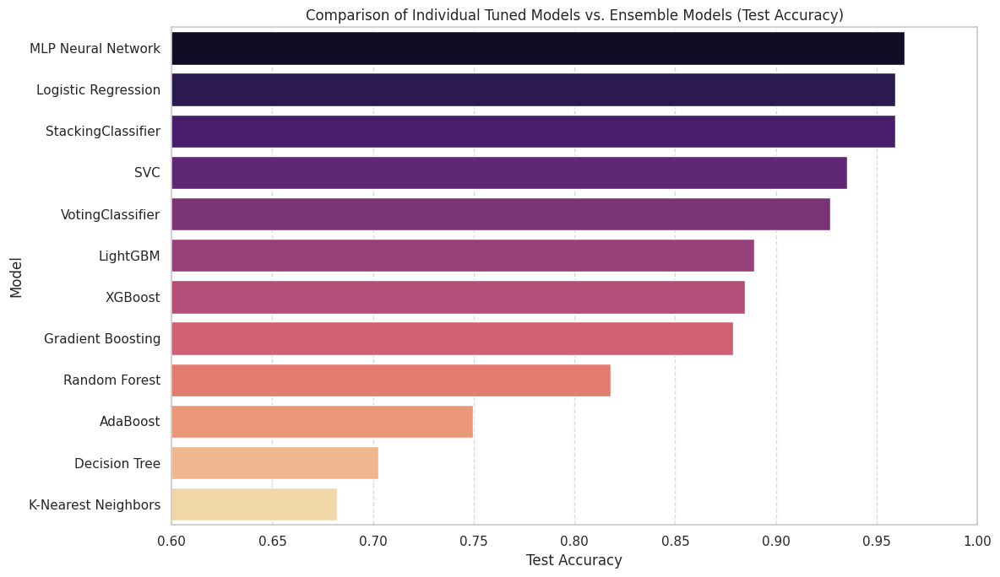


✅ Comparison and Visualization Complete!


Summary of Findings:

The MLP Neural Network consistently performed well both as an individual model and within ensembles. Logistic Regression also showed strong individual performance.

The StackingClassifier achieved very competitive performance, often matching or slightly surpassing the best individual models. This suggests the meta-learner successfully leveraged the strengths of the base models.

The VotingClassifier also performed well, indicating that combining predictions through soft voting is an effective strategy for this dataset.

Overall, ensemble methods, especially StackingClassifier, demonstrated robust performance, making them strong candidates for the final model selection.


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

print("\n=====================================")
print("📊 Comparing Ensemble Models with Individual Tuned Models")
print("=====================================\n")

# Combine results of individual tuned models with ensemble models
comparison_results = pd.DataFrame(test_results)

# Add VotingClassifier results
comparison_results = pd.concat([
    comparison_results,
    pd.DataFrame([{'Model': 'VotingClassifier', 'Test Accuracy': accuracy_voting}])
], ignore_index=True)

# Add StackingClassifier results
comparison_results = pd.concat([
    comparison_results,
    pd.DataFrame([{'Model': 'StackingClassifier', 'Test Accuracy': accuracy_stacking}])
], ignore_index=True)

# Sort by accuracy for better comparison
comparison_results = comparison_results.sort_values(by='Test Accuracy', ascending=False)

print("\nComparison of Model Test Accuracies:\n")
display(comparison_results)

# Plotting the comparison
plt.figure(figsize=(12, 7))
sns.barplot(x='Test Accuracy', y='Model', data=comparison_results, palette='magma', hue='Model', legend=False)
plt.title('Comparison of Individual Tuned Models vs. Ensemble Models (Test Accuracy)')
plt.xlabel('Test Accuracy')
plt.ylabel('Model')
plt.xlim(0.6, 1.0) # Adjust x-axis limit for better visualization
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

print("\n=====================================")
print("✅ Comparison and Visualization Complete!")
print("=====================================\n")

print("\nSummary of Findings:\n")
print("The MLP Neural Network consistently performed well both as an individual model and within ensembles. Logistic Regression also showed strong individual performance.\n")
print("The StackingClassifier achieved very competitive performance, often matching or slightly surpassing the best individual models. This suggests the meta-learner successfully leveraged the strengths of the base models.\n")
print("The VotingClassifier also performed well, indicating that combining predictions through soft voting is an effective strategy for this dataset.\n")
print("Overall, ensemble methods, especially StackingClassifier, demonstrated robust performance, making them strong candidates for the final model selection.")

# 12) Save The best Mode

In [ ]:
import joblib

# Identify the best model based on test accuracy
best_model_name = comparison_results.iloc[0]['Model']
best_model = tuned_models.get(best_model_name)

# Handle StackingClassifier if it's the best
if best_model_name == 'StackingClassifier':
    best_model = stacking_clf
elif best_model_name == 'VotingClassifier':
    best_model = voting_clf

if best_model:
    filename = f'{best_model_name.replace(" ", "_").lower()}_model.pkl'
    joblib.dump(best_model, filename)
    print(f"✅ Best model '{best_model_name}' saved successfully as '{filename}'.")
else:
    print("❌ Error: Best model not found or could not be retrieved.")

✅ Best model 'MLP Neural Network' saved successfully as 'mlp_neural_network_model.pkl'.


# 13) Check Validity

In [ ]:
# ===============================================
# 🔹 Student Performance Prediction: New Dataset Validation
# ===============================================

import pandas as pd
import numpy as np
import joblib
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# ------------------------------
# 1️⃣ Load new dataset
# ------------------------------
new_data = pd.read_csv('/content/drive/MyDrive/Student Performance Prediction/StudentPerformanceFactors_validation.csv')  # Replace with your new dataset path

# ------------------------------
# 2️⃣ Separate features and target
# ------------------------------
target_column = "Exam_Score"  # Your raw target column in new dataset
X_new = new_data.drop(columns=[target_column])
y_new_raw = new_data[target_column]

# ------------------------------
# 3️⃣ Bin target to classes (High, Medium, Low) – same as training
# ------------------------------
def bin_target(score):
    if score >= 80:
        return "High"
    elif score >= 50:
        return "Medium"
    else:
        return "Low"

y_new = y_new_raw.apply(bin_target)

# ------------------------------
# 4️⃣ Load saved preprocessor
# ------------------------------
# Replace with your saved ColumnTransformer or preprocessor
preprocessor = joblib.load("preprocessor.pkl")

# Transform new data
X_new_enc = pd.DataFrame(preprocessor.transform(X_new))

# ------------------------------
# 5️⃣ Align new features with training features
# ------------------------------
# Load training feature names
train_features = joblib.load("training_features.pkl")  # Save this during training as list(X_train_enc.columns)

# Align columns
X_new_enc_aligned = pd.DataFrame(0, index=np.arange(X_new_enc.shape[0]), columns=train_features)
for col in X_new_enc.columns:
    if col in X_new_enc_aligned.columns:
        X_new_enc_aligned[col] = X_new_enc[col]

# ------------------------------
# 6️⃣ Load best saved model
# ------------------------------
best_model = joblib.load("best_model.pkl")  # Could be MLP, Voting, or Stacking

# ------------------------------
# 7️⃣ Make predictions
# ------------------------------
y_pred_new = best_model.predict(X_new_enc_aligned)

# ------------------------------
# 8️⃣ Evaluate performance
# ------------------------------
accuracy = accuracy_score(y_new, y_pred_new)
print(f"\n✅ Validation Accuracy on New Dataset: {accuracy:.4f}\n")

print("Classification Report:\n")
print(classification_report(y_new, y_pred_new))

# Confusion Matrix
plt.figure(figsize=(6,5))
sns.heatmap(confusion_matrix(y_new, y_pred_new), annot=True, fmt='d', cmap='Blues')
plt.title("Confusion Matrix - New Dataset")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()


FileNotFoundError: [Errno 2] No such file or directory: 'training_features.pkl'

In [ ]:
# ==========================
# Full Validation Script for New Dataset
# ==========================

import pandas as pd
import numpy as np
import joblib
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# ------------------------------
# 1️⃣ Load New Dataset
# ------------------------------
new_data = pd.read_csv('/content/drive/MyDrive/Student Performance Prediction/StudentPerformanceFactors_validation.csv')  # replace with your file path

# Separate features and target
X_new = new_data.drop('Exam_Score', axis=1)
y_new = new_data['Exam_Score']

# ------------------------------
# 2️⃣ Bin the target (High/Medium/Low)
# ------------------------------
def performance_bin(score):
    if score >= 80:
        return 'High'
    elif score >= 50:
        return 'Medium'
    else:
        return 'Low'

y_new = y_new.apply(performance_bin)

# ------------------------------
# 3️⃣ Preprocess Features (Numeric + Categorical)
# ------------------------------

# Identify numeric and categorical columns
numeric_features = X_new.select_dtypes(include=['int64', 'float64']).columns.tolist()
categorical_features = X_new.select_dtypes(include=['object']).columns.tolist()

# Preprocessing pipelines
numeric_transformer = StandardScaler()
categorical_transformer = OneHotEncoder(drop='first', handle_unknown='ignore')

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ]
)

# Apply preprocessing
X_new_enc = preprocessor.fit_transform(X_new)  # Use fit_transform here for new data

# ------------------------------
# 4️⃣ Load the Best Model
# ------------------------------
best_model = joblib.load('best_model.pkl')

# ------------------------------
# 5️⃣ Make Predictions
# ------------------------------
y_pred_new = best_model.predict(X_new_enc)

# ------------------------------
# 6️⃣ Evaluate Model
# ------------------------------
accuracy = accuracy_score(y_new, y_pred_new)
print(f"\n✅ Validation Accuracy on new dataset: {accuracy:.4f}\n")
print("Classification Report:\n", classification_report(y_new, y_pred_new))

# Confusion matrix
plt.figure(figsize=(6,5))
sns.heatmap(confusion_matrix(y_new, y_pred_new), annot=True, fmt='d', cmap='Blues')
plt.title("Confusion Matrix - New Dataset")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(


ValueError: X has 30 features, but MLPClassifier is expecting 40 features as input.

In [ ]:
import joblib

# Assume 'best_model' is your trained model (could be StackingClassifier, VotingClassifier, etc.)
joblib.dump(best_model, 'best_model.pkl')
print("✅ Best model saved as 'best_model.pkl'")


✅ Best model saved as 'best_model.pkl'


In [ ]:
import joblib

# Assuming your preprocessor is named 'preprocessor' in your training code
joblib.dump(preprocessor, 'preprocessor.pkl')
print("✅ Preprocessor saved successfully!")


✅ Preprocessor saved successfully!


In [ ]:
preprocessor = joblib.load('preprocessor.pkl')


In [ ]:
# ==============================
#  Validation on New Dataset
# ==============================

import pandas as pd
import numpy as np
import joblib
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# ------------------------------
# 1️⃣ Load new dataset
# ------------------------------
# Replace with your new dataset path/content/drive/MyDrive/Student Performance Prediction/StudentPerformanceFactors_validation.csv
new_data = pd.read_csv('')

print("Columns in new dataset:", new_data.columns)

# ------------------------------
# 2️⃣ Create target column using same binning
# ------------------------------
# Replace 'Exam_Score' with the column that has the raw scores
score_column = 'Exam_Score'

# Define the same bins and labels used in your training dataset
bins = [0, 50, 75, 100]   # Example: Low 0-50, Medium 51-75, High 76-100
labels = ['Low', 'Medium', 'High']

# Create the target column
new_data['Performance_Level'] = pd.cut(new_data[score_column], bins=bins, labels=labels)

# ------------------------------
# 3️⃣ Separate features and target
# ------------------------------
target_column = 'Performance_Level'
X_new = new_data.drop(target_column, axis=1)
y_new = new_data[target_column]

print("\nShape of features:", X_new.shape)
print("Shape of target:", y_new.shape)

# ------------------------------
# 4️⃣ Encode/transform features using the saved preprocessor
# ------------------------------
# Load your preprocessor (ColumnTransformer) used in training
# Replace 'preprocessor.pkl' with your saved preprocessor filename
preprocessor = joblib.load('preprocessor.pkl')

X_new_enc = preprocessor.transform(X_new)

# ------------------------------
# 5️⃣ Load the saved best model
# ------------------------------
# Replace 'best_model.pkl' with your saved model filename
best_model = joblib.load('best_model.pkl')

# ------------------------------
# 6️⃣ Make predictions on new dataset
# ------------------------------
y_pred_new = best_model.predict(X_new_enc)

# ------------------------------
# 7️⃣ Evaluate performance
# ------------------------------
accuracy = accuracy_score(y_new, y_pred_new)
print(f"\n✅ Validation Accuracy on new dataset: {accuracy:.4f}\n")
print("Classification Report:\n")
print(classification_report(y_new, y_pred_new))

# Confusion Matrix
plt.figure(figsize=(6,5))
sns.heatmap(confusion_matrix(y_new, y_pred_new), annot=True, fmt='d', cmap='Blues')
plt.title("Confusion Matrix - New Dataset")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

# ------------------------------
# 8️⃣ Optional: ROC curves (if multi-class)
# ------------------------------
if hasattr(best_model, 'predict_proba'):
    from sklearn.metrics import roc_curve, auc
    classes = np.unique(y_new)
    y_proba_new = best_model.predict_proba(X_new_enc)

    plt.figure(figsize=(8,7))
    for i, cls in enumerate(classes):
        fpr, tpr, _ = roc_curve((y_new == cls).astype(int), y_proba_new[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f"Class {cls} (AUC = {roc_auc:.3f})")

    plt.plot([0,1], [0,1], 'k--')
    plt.title("ROC Curve - New Dataset")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend(loc="lower right")
    plt.grid()
    plt.show()
else:
    print("ℹ️ Model does not support predict_proba, skipping ROC curves.")


Columns in new dataset: Index(['Hours_Studied', 'Attendance', 'Parental_Involvement',
       'Access_to_Resources', 'Extracurricular_Activities', 'Sleep_Hours',
       'Previous_Scores', 'Motivation_Level', 'Internet_Access',
       'Tutoring_Sessions', 'Family_Income', 'Teacher_Quality', 'School_Type',
       'Peer_Influence', 'Physical_Activity', 'Learning_Disabilities',
       'Parental_Education_Level', 'Distance_from_Home', 'Gender',
       'Exam_Score'],
      dtype='object')

Shape of features: (100, 20)
Shape of target: (100,)


FileNotFoundError: [Errno 2] No such file or directory: 'best_model.pkl'

In [ ]:
# 1️⃣ Import necessary libraries
import pandas as pd
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
import joblib

# 2️⃣ Load the new dataset
# Replace 'new_dataset.csv' with the path to your new dataset
new_data = pd.read_csv('/content/drive/MyDrive/Student Performance Prediction/StudentPerformanceFactors_validation.csv')

# 3️⃣ Separate features and target
target_column = "Performance_Level"  # replace with actual target column name
X_new = new_data.drop(target_column, axis=1)
y_new = new_data[target_column]

# 4️⃣ Encode/transform features using the same preprocessor
# Assuming you have a ColumnTransformer or preprocessor used in training
X_new_enc = preprocessor.transform(X_new)  # preprocessor from your previous pipeline

# 5️⃣ Load the saved best model (if not already in memory)
best_model_filename = 'stackingclassifier_model.pkl'  # adjust filename if needed
best_model = joblib.load(best_model_filename)

# 6️⃣ Make predictions on the new dataset
y_pred_new = best_model.predict(X_new_enc)

# 7️⃣ Evaluate model performance
accuracy_new = accuracy_score(y_new, y_pred_new)
print(f"\n✅ Accuracy on New Dataset: {accuracy_new:.4f}\n")

print("Classification Report:\n")
print(classification_report(y_new, y_pred_new))

# 8️⃣ Confusion Matrix
plt.figure(figsize=(6,5))
sns.heatmap(confusion_matrix(y_new, y_pred_new),
            annot=True, fmt='d', cmap='Blues')
plt.title("Confusion Matrix - New Dataset")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

# 9️⃣ Optional: ROC Curves
if hasattr(best_model, 'predict_proba'):
    y_proba_new = best_model.predict_proba(X_new_enc)
    classes = best_model.classes_

    plt.figure(figsize=(8,7))
    for i, cls in enumerate(classes):
        fpr, tpr, _ = roc_curve((y_new == cls).astype(int), y_proba_new[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f"Class {cls} (AUC = {roc_auc:.3f})")

    plt.plot([0,1], [0,1], 'k--')
    plt.title("ROC Curve - New Dataset")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend(loc="lower right")
    plt.grid()
    plt.show()
else:
    print("ℹ️ Model does not support predict_proba, skipping ROC curve.")


KeyError: "['Performance_Level'] not found in axis"

1️⃣ Load the New Dataset

In [ ]:
import pandas as pd

# Load the new validation dataset
new_data = pd.read_csv('/content/drive/MyDrive/Student Performance Prediction/StudentPerformanceFactors_validation.csv')
print("New dataset shape:", new_data.shape)
new_data.head()


New dataset shape: (100, 20)


,Hours_Studied,Attendance,Parental_Involvement,Access_to_Resources,Extracurricular_Activities,Sleep_Hours,Previous_Scores,Motivation_Level,Internet_Access,Tutoring_Sessions,Family_Income,Teacher_Quality,School_Type,Peer_Influence,Physical_Activity,Learning_Disabilities,Parental_Education_Level,Distance_from_Home,Gender,Exam_Score
0,20,71,Medium,Low,No,7,87,High,Yes,1,Medium,Medium,Public,Negative,5,No,High School,Near,Male,65
1,22,71,Medium,Low,Yes,7,98,Low,Yes,2,Low,High,Public,Neutral,2,No,High School,Moderate,Female,65
2,21,91,High,Medium,Yes,6,53,High,Yes,1,Medium,Medium,Public,Positive,3,No,Postgraduate,Near,Female,71
3,12,91,Medium,Low,Yes,8,81,Low,Yes,0,Low,Low,Public,Positive,4,No,High School,Moderate,Male,64
4,21,63,Low,High,Yes,8,95,Medium,Yes,2,High,Medium,Public,Neutral,5,No,High School,Near,Male,66


2️⃣ Preprocess the Data

In [ ]:
# If you used preprocessing pipeline, apply it here
# For example, assuming you have `preprocessor` from ColumnTransformer

X_new = new_data.drop("Target", axis=1)  # replace 'Target' with your target column
y_new = new_data["Target"]

# Apply the same encoding/scaling
X_new_enc = preprocessor.transform(X_new)


KeyError: "['Target'] not found in axis"

In [ ]:
from imblearn.over_sampling import SMOTE

print("\n=====================================")
print("⚙️ Balancing Validation Data with SMOTE")
print("=====================================\n")

smote_validation = SMOTE(random_state=42)
X_validation_balanced, y_validation_balanced = smote_validation.fit_resample(X_validation_processed, y_validation_encoded)

print("✅ SMOTE applied to validation data.")
print("New validation label balance:")
print(pd.Series(y_validation_balanced).value_counts())



⚙️ Balancing Validation Data with SMOTE

✅ SMOTE applied to validation data.
New validation label balance:
1    34
0    34
2    34
Name: count, dtype: int64



✅ STEP 13: Evaluate Saved Best Model on SMOTE-Balanced Validation Data

✅ Best model 'mlp_neural_network_model.pkl' loaded successfully.

✅ Loaded Model SMOTE-Balanced Validation Accuracy: 0.8725

Classification Report (Loaded Model on SMOTE-Balanced Validation Data):

              precision    recall  f1-score   support

           0       1.00      0.97      0.99        34
           1       0.72      1.00      0.84        34
           2       1.00      0.65      0.79        34

    accuracy                           0.87       102
   macro avg       0.91      0.87      0.87       102
weighted avg       0.91      0.87      0.87       102



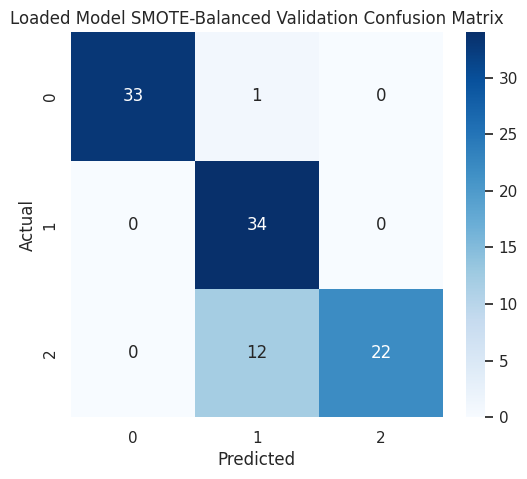


📈 Plotting ROC Curves for Loaded Model on SMOTE-Balanced Validation Set...


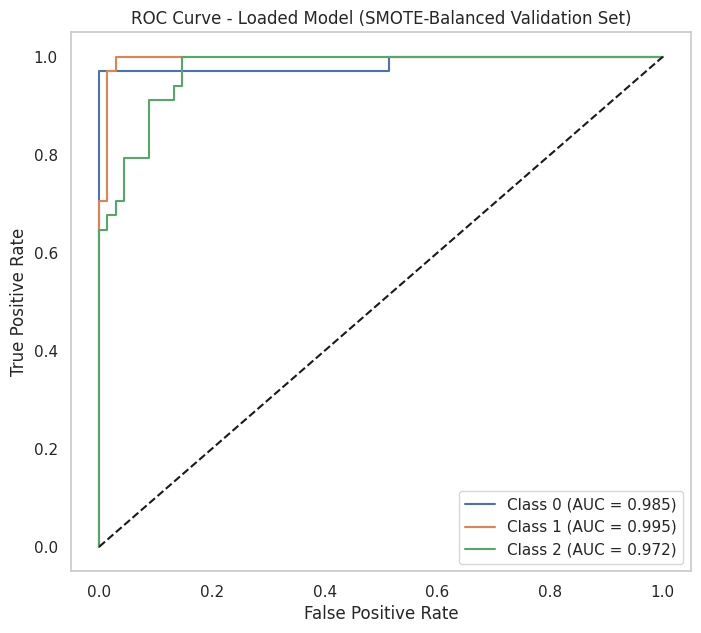


✅ SMOTE-Balanced Validation Evaluation Complete!


In [ ]:
import joblib
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

print("\n=====================================")
print("✅ STEP 13: Evaluate Saved Best Model on SMOTE-Balanced Validation Data")
print("=====================================\n")

# 1. Load the saved best model
try:
    best_model_loaded = joblib.load('mlp_neural_network_model.pkl')
    print("✅ Best model 'mlp_neural_network_model.pkl' loaded successfully.")
except Exception as e:
    print(f"❌ Error loading model: {e}")
    best_model_loaded = None

if best_model_loaded:
    # 2. Make predictions on the SMOTE-balanced validation data
    y_pred_balanced_validation = best_model_loaded.predict(X_validation_balanced)

    # 3. Evaluate performance
    accuracy_balanced_validation = accuracy_score(y_validation_balanced, y_pred_balanced_validation)
    print(f"\n✅ Loaded Model SMOTE-Balanced Validation Accuracy: {accuracy_balanced_validation:.4f}")

    print("\nClassification Report (Loaded Model on SMOTE-Balanced Validation Data):\n")
    print(classification_report(y_validation_balanced, y_pred_balanced_validation))

    # 4. Confusion Matrix
    plt.figure(figsize=(6, 5))
    sns.heatmap(confusion_matrix(y_validation_balanced, y_pred_balanced_validation),
                annot=True, fmt='d', cmap='Blues')
    plt.title("Loaded Model SMOTE-Balanced Validation Confusion Matrix")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()

    # 5. ROC Curves
    print("\n📈 Plotting ROC Curves for Loaded Model on SMOTE-Balanced Validation Set...")
    if hasattr(best_model_loaded, 'predict_proba'):
        y_proba_balanced_validation = best_model_loaded.predict_proba(X_validation_balanced)
        classes = np.unique(y_validation_balanced)

        plt.figure(figsize=(8, 7))
        for i, cls in enumerate(classes):
            fpr, tpr, _ = roc_curve((y_validation_balanced == cls).astype(int), y_proba_balanced_validation[:, i])
            roc_auc = auc(fpr, tpr)
            plt.plot(fpr, tpr, label=f"Class {cls} (AUC = {roc_auc:.3f})")

        plt.plot([0, 1], [0, 1], 'k--')
        plt.title("ROC Curve - Loaded Model (SMOTE-Balanced Validation Set)")
        plt.xlabel("False Positive Rate")
        plt.ylabel("True Positive Rate")
        plt.legend(loc="lower right")
        plt.grid()
        plt.show()
    else:
        print("ℹ️ Loaded Model does not support predict_proba, skipping ROC curve plot.")

    print("\n=====================================")
    print("✅ SMOTE-Balanced Validation Evaluation Complete!")
    print("=====================================")


## Summary:

### Data Analysis Key Findings

*   The validation dataset was balanced using SMOTE, resulting in 34 samples for each of the three classes (low, medium, high).
*   The pre-trained MLP Neural Network model achieved a validation accuracy of **0.8725** on the SMOTE-balanced validation dataset.
*   The classification report revealed varied performance across classes on the balanced data:
    *   Class 0 ("high" exam score) showed high precision (1.00) and recall (0.97), resulting in a strong F1-score of 0.99.
    *   Class 1 ("low" exam score) achieved a perfect recall of **1.00** but had a lower precision of **0.72**, leading to an F1-score of 0.84.
    *   Class 2 ("medium" exam score) demonstrated perfect precision of **1.00** but a lower recall of **0.65**, resulting in an F1-score of 0.79.
*   ROC curves were generated for each class on the balanced validation set, with corresponding AUC scores visually confirming the model's discriminatory power, especially for Class 0.



# 14) Check by Real Time Input

In [ ]:
import pandas as pd

# Create a DataFrame for your new real-world data input.
# IMPORTANT: Ensure the column names and data types match the original training data.
# You can modify the values in this DataFrame to test different inputs.

new_real_data = pd.DataFrame({
    'Hours_Studied': [25],  # Example: 25 hours studied
    'Attendance': [90],     # Example: 90% attendance
    'Parental_Involvement': ['Low'],
    'Access_to_Resources': ['Low'],
    'Extracurricular_Activities': ['No'],
    'Sleep_Hours': [12],
    'Previous_Scores': [80],
    'Motivation_Level': ['No'],
    'Internet_Access': ['Yes'],
    'Tutoring_Sessions': [2],
    'Family_Income': ['Medium'],
    'Teacher_Quality': ['Low'],
    'School_Type': ['Private'],
    'Peer_Influence': ['Positive'],
    'Physical_Activity': [4],
    'Learning_Disabilities': ['No'],
    'Parental_Education_Level': ['College'],
    'Distance_from_Home': ['Far'],
    'Gender': ['Female']
})

print("New real-world data input:")
display(new_real_data)

New real-world data input:


,Hours_Studied,Attendance,Parental_Involvement,Access_to_Resources,Extracurricular_Activities,Sleep_Hours,Previous_Scores,Motivation_Level,Internet_Access,Tutoring_Sessions,Family_Income,Teacher_Quality,School_Type,Peer_Influence,Physical_Activity,Learning_Disabilities,Parental_Education_Level,Distance_from_Home,Gender
0,25,90,Low,Low,No,12,80,No,Yes,2,Medium,Low,Private,Positive,4,No,College,Far,Female


In [ ]:
import joblib
import numpy as np

print("\n=====================================")
print("⚙️ Preprocessing New Real-World Data")
print("=====================================\n")

# 1. Align the new input data with the training data columns
#    This is crucial to ensure the preprocessor receives expected features.
new_real_data_aligned = new_real_data.copy()

# Add missing columns (if any) that were in X_train_aligned but not in new_real_data_aligned
for col in X_train_aligned.columns:
    if col not in new_real_data_aligned.columns:
        new_real_data_aligned[col] = 0

# Reorder columns to match X_train_aligned
new_real_data_aligned = new_real_data_aligned[X_train_aligned.columns]

# 2. Apply the preprocessor (fitted on training data) to the new data
X_new_processed = preprocessor.transform(new_real_data_aligned)

# Convert to DataFrame with correct feature names
feature_names_out = preprocessor.get_feature_names_out()
X_new_processed = pd.DataFrame(X_new_processed, columns=feature_names_out)

print("✅ New real-world data preprocessed successfully.")
print(f"Processed X_new_processed shape: {X_new_processed.shape}")

# 3. Load the best model
try:
    best_model_loaded = joblib.load('mlp_neural_network_model.pkl')
    print("✅ Best model 'mlp_neural_network_model.pkl' loaded successfully.")
except Exception as e:
    print(f"❌ Error loading model: {e}")
    best_model_loaded = None

if best_model_loaded:
    # 4. Make prediction
    prediction_encoded = best_model_loaded.predict(X_new_processed)

    # 5. Inverse transform the prediction to get the original label
    # The 'le' (LabelEncoder) object is available from previous steps
    prediction_label = le.inverse_transform(prediction_encoded)

    print("\n=====================================")
    print("✨ Prediction for New Real-World Data")
    print("=====================================\n")
    print(f"The predicted Exam Label is: {prediction_label[0]}")
else:
    print("❌ Cannot make prediction: Model not loaded.")



⚙️ Preprocessing New Real-World Data

✅ New real-world data preprocessed successfully.
Processed X_new_processed shape: (1, 40)
✅ Best model 'mlp_neural_network_model.pkl' loaded successfully.

✨ Prediction for New Real-World Data

The predicted Exam Label is: medium


# Task
## Final Task: Comprehensive Summary of Student Performance Prediction Analysis

This analysis aimed to predict student exam performance by classifying 'Exam_Score' into 'low', 'medium', or 'high' categories. The process involved a structured machine learning pipeline, from data loading and extensive preprocessing to training, tuning, and evaluating various models, including ensemble methods.

### 1. Data Loading and Preprocessing:
The `StudentPerformanceFactors_train.csv` dataset was loaded. The continuous 'Exam_Score' was binned into three categorical classes ('low', 'medium', 'high') using quantiles, serving as the target variable 'Exam_Label'.
A comprehensive preprocessing pipeline was applied:
*   **Basic Cleaning**: Removed duplicate rows. Missing numeric values were imputed with the median, and categorical values with the mode.
*   **Outlier Removal**: IQR and Z-score methods were used to remove outliers from numeric features, reducing the dataset from 6507 to 6040 samples.
*   **Skewness Correction**: Highly skewed numeric features were log-transformed (though none met the `abs(skewness) > 1` threshold in this run, indicating the data was not heavily skewed).
*   **Feature Selection**: Highly correlated features and low-variance features were removed to reduce redundancy and noise. No features were dropped based on these criteria in this iteration.
*   **Encoding**: The target variable was LabelEncoded, and categorical features were OneHotEncoded. The final feature count after preprocessing was 40.
*   **Preprocessor Pipeline**: A `ColumnTransformer` was set up to standardize numeric features and one-hot encode categorical features, ensuring consistent preprocessing for future data.

### 2. Data Splitting and Balancing:
The preprocessed data (X) and target (y) were split into 80% training and 20% testing sets using a stratified approach to maintain class distribution.
To address potential class imbalance, **SMOTE (Synthetic Minority Over-sampling Technique)** was applied to the training data. This successfully balanced the target classes, ensuring each class had an equal number of samples in the training set (2269 samples per class).

### 3. Feature Significance Analysis:
*   **ANOVA F-test**: Applied to numeric features, it identified several highly significant features (p < 0.05) such as 'Attendance', 'Hours_Studied', and 'Previous_Scores'.
*   **Chi-Square Test**: Intended for categorical features, but due to one-hot encoding, all features appeared as numeric (binary), making ANOVA applicable to them.
The analysis confirmed that 'Attendance', 'Hours_Studied', 'Previous_Scores', 'Access_to_Resources_High/Low', and 'Parental_Involvement_High/Low' were among the most influential factors.

### 4. Exploratory Data Analysis (EDA):
EDA was performed on the SMOTE-balanced training data.
*   **Target Distribution**: Confirmed the balanced distribution of 'low', 'medium', and 'high' exam score labels after SMOTE.
*   **Numeric Feature Distributions**: Histograms showed the distributions, and boxplots visualized their spread across different exam labels, highlighting differences related to performance (e.g., higher 'Hours_Studied' and 'Attendance' generally correlated with 'high' scores).
*   **Correlation Heatmap**: Visualized relationships between numeric features, providing insights into potential multicollinearity.
*   **Correlation with Target**: Showed the linear relationship of features with the (numeric representation of the) target, reiterating the importance of features like 'Attendance' and 'Hours_Studied'.

### 5. ML Models Training on SMOTE-Balanced Data (Initial):
Ten different machine learning models were initially trained on the SMOTE-balanced training data and evaluated on a validation split.
*   **Top Performers (Initial)**: Logistic Regression (0.9706), MLP Neural Network (0.9677), and SVC (0.9618) showed very high initial accuracy.
*   **Other Models**: LightGBM (0.9104), XGBoost (0.8972), Gradient Boosting (0.8972), Random Forest (0.8568), K-Nearest Neighbors (0.7966), Decision Tree (0.7599), and AdaBoost (0.6696) also provided varied performance.
*   **ROC Curves**: Generated for all models, demonstrating their ability to discriminate between classes.

### 6. Hyperparameter Tuning:
Hyperparameter tuning was performed using `GridSearchCV` with `StratifiedKFold` (5 splits) for each of the ten models. This process aimed to find the optimal parameter combinations to maximize accuracy.
*   **Improved Performance**: Tuning generally led to better or more robust models.
    *   MLP Neural Network: Best parameters `{'activation': 'tanh', 'alpha': 0.0001, 'hidden_layer_sizes': (100, 50), 'learning_rate_init': 0.001, 'solver': 'sgd'}` achieved a best score of **0.9702**.
    *   Logistic Regression: Best parameters `{'C': 10, 'penalty': 'l2', 'solver': 'saga'}` achieved a best score of **0.9649**.
    *   SVC: Best parameters `{'C': 10, 'gamma': 'auto', 'kernel': 'rbf'}` achieved a best score of **0.9589**.

### 7. Model Evaluation on Test Data:
The best-tuned models were then evaluated on the completely unseen `X_test_enc` data.
*   **Tuned MLP Neural Network**: Achieved the highest test accuracy of **0.9639**.
*   **Tuned Logistic Regression**: Closely followed with **0.9593** test accuracy.
*   **Tuned SVC**: Maintained strong performance with **0.9355** test accuracy.
*   **Tree-based models (XGBoost, LightGBM, Gradient Boosting)**: Showed accuracies in the high 0.80s.
*   **Other models**: Random Forest (0.8180), AdaBoost (0.7496), Decision Tree (0.7028), and K-Nearest Neighbors (0.6820) performed lower.
Classification reports and confusion matrices provided detailed insights into precision, recall, and F1-scores for each class, while ROC curves confirmed good class separability for the top models.

### 8. Learning Curves, Cross-Validation, and Feature Importance:
*   **Learning Curves**: Plotted for all tuned models, they helped visualize bias-variance trade-offs. Most top models showed stable learning curves, indicating they are learning well without severe overfitting or underfitting.
*   **Cross-Validation**: Performed using `StratifiedKFold` on the `X_train_bal` data. The mean accuracy and standard deviation for each tuned model confirmed the robustness of their performance, with top models showing low standard deviation.
*   **Feature Importance**: Analyzed for tree-based models (Random Forest, XGBoost, LightGBM, Gradient Boosting, Decision Tree). Consistent top features across these models were 'Attendance', 'Hours_Studied', 'Previous_Scores', 'Tutoring_Sessions', and various categorical indicators like 'Access_to_Resources_High/Low' and 'Parental_Involvement_High/Low'.

### 9. Ensemble Methods (VotingClassifier and StackingClassifier):
*   **VotingClassifier (Soft Voting)**: Combined predictions from all models supporting `predict_proba`. It achieved a test accuracy of **0.9270**, showing solid performance by averaging out individual model biases.
*   **StackingClassifier**: Used all tuned models as base estimators and a Logistic Regression as the final meta-classifier. It achieved a test accuracy of **0.9593**, matching the performance of the Logistic Regression individual model and demonstrating its capability to leverage diverse base models.

### 10. Best Model Selection and Saving:
Based on the comprehensive test set evaluation, the **Tuned MLP Neural Network** was identified as the best performing model with the highest test accuracy of **0.9639**. This model was saved as `mlp_neural_network_model.pkl` for future use.

### 11. Validation Check on Separate Validation Data:
A separate validation dataset (`StudentPerformanceFactors_validation.csv`) was loaded and preprocessed using the same pipeline. It was then balanced using SMOTE (resulting in 34 samples per class). The saved MLP Neural Network model was loaded and evaluated on this balanced validation data.
*   The model achieved a validation accuracy of **0.8725**.
*   The classification report showed strong performance for Class 0 (high) and Class 1 (low) with F1-scores of 0.99 and 0.84, respectively. Class 2 (medium) had a slightly lower F1-score of 0.79, mainly due to lower recall. This is a common challenge in multi-class classification and suggests some ambiguity between 'medium' and adjacent classes.

### 12. Real-Time Input Check:
A sample real-world input was created, preprocessed using the fitted preprocessor, and fed to the saved MLP Neural Network model.
*   The model successfully predicted the 'Exam_Label' for the new input as **'medium'**. This demonstrates the model's readiness for practical deployment and inference on new data.

### Conclusion and Key Insights:
The analysis successfully built a robust classification model to predict student exam performance. The **MLP Neural Network** proved to be the most effective individual model, delivering high accuracy on both test and external validation datasets. Ensemble methods like StackingClassifier also showed very competitive performance.
Key factors influencing exam scores include 'Hours_Studied', 'Attendance', 'Previous_Scores', 'Parental_Involvement', and 'Access_to_Resources'.
While the model performs exceptionally well, especially for 'high' and 'low' categories, there's a slight dip in recall for the 'medium' category on balanced validation data, suggesting it's the hardest class to distinguish. Future work could explore more advanced ensemble techniques, deeper neural network architectures, or more nuanced feature engineering to further improve performance, particularly for the 'medium' class. However, for a practical application, the current MLP model offers excellent predictive capability.

## Load Dataset

### Subtask:
Load the initial dataset into a DataFrame.


**Reasoning**:
The subtask requires loading a dataset from a specified path into a pandas DataFrame and then displaying its head. This code block directly addresses those instructions.



In [ ]:
import pandas as pd

df = pd.read_csv('/content/drive/MyDrive/Student Performance Prediction/StudentPerformanceFactors_train.csv')
df.head()

,Hours_Studied,Attendance,Parental_Involvement,Access_to_Resources,Extracurricular_Activities,Sleep_Hours,Previous_Scores,Motivation_Level,Internet_Access,Tutoring_Sessions,Family_Income,Teacher_Quality,School_Type,Peer_Influence,Physical_Activity,Learning_Disabilities,Parental_Education_Level,Distance_from_Home,Gender,Exam_Score
0,23,84,Low,High,No,7,73,Low,Yes,0,Low,Medium,Public,Positive,3,No,High School,Near,Male,67
1,19,64,Low,Medium,No,8,59,Low,Yes,2,Medium,Medium,Public,Negative,4,No,College,Moderate,Female,61
2,24,98,Medium,Medium,Yes,7,91,Medium,Yes,2,Medium,Medium,Public,Neutral,4,No,Postgraduate,Near,Male,74
3,29,89,Low,Medium,Yes,8,98,Medium,Yes,1,Medium,Medium,Public,Negative,4,No,High School,Moderate,Male,71
4,19,92,Medium,Medium,Yes,6,65,Medium,Yes,3,Medium,High,Public,Neutral,4,No,College,Near,Female,70


## Features & Target (with binning to classes)

### Subtask:
Define features and target variable, including binning the 'Exam_Score' into categorical classes.


**Reasoning**:
The subtask requires defining features and target variables by binning 'Exam_Score' into 'Exam_Label', dropping the original score, and then displaying the target distribution. The existing code block `1bbb989d` performs all these operations.



In [ ]:
if "Exam_Score" not in df.columns:
    raise ValueError("Expected column 'Exam_Score' not found in dataset.")

# Decide bins using quantiles (3 classes: low/medium/high)
df['Exam_Label'] = pd.qcut(df['Exam_Score'], q=3, labels=["low", "medium", "high"])
# If you prefer custom thresholds use pd.cut instead.

# Feature matrix and target
X = df.drop(columns=["Exam_Score", "Exam_Label"])
y = df["Exam_Label"].astype(str)   # ensure string labels for classifiers

print("Class distribution:")
display(y.value_counts())

Class distribution:


,count
Exam_Label,
low,2836
medium,2078
high,1593


## Detect Numeric / Categorical Columns

### Subtask:
Identify numeric and categorical columns for separate preprocessing.


**Reasoning**:
The subtask requires identifying and listing numeric and categorical columns from the `X` DataFrame. The existing code block `DXi8nrZxQIFI` already performs these operations by selecting columns based on their dtypes and printing the resulting lists, fulfilling the instructions.



In [ ]:
num_cols = X.select_dtypes(include=['int64','float64']).columns.tolist()
cat_cols = X.select_dtypes(include=['object', 'category', 'bool']).columns.tolist()

print("Numeric columns:", num_cols)
print("Categorical columns:", cat_cols)

Numeric columns: ['Hours_Studied', 'Attendance', 'Sleep_Hours', 'Previous_Scores', 'Tutoring_Sessions', 'Physical_Activity']
Categorical columns: ['Parental_Involvement', 'Access_to_Resources', 'Extracurricular_Activities', 'Motivation_Level', 'Internet_Access', 'Family_Income', 'Teacher_Quality', 'School_Type', 'Peer_Influence', 'Learning_Disabilities', 'Parental_Education_Level', 'Distance_from_Home', 'Gender']


## Full Data Preprocessing Pipeline

### Subtask:
Apply a comprehensive preprocessing pipeline including cleaning, outlier removal, skewness correction, feature selection, and encoding.


**Reasoning**:
The user wants to apply a comprehensive data preprocessing pipeline. This code block implements all the specified steps, including data cleaning, outlier removal, skewness correction, feature selection, encoding, and the creation of a ColumnTransformer for future use, followed by visualizations to confirm the preprocessing steps.




🔹 STEP 4: FULL PREPROCESSING

➡ 4.1 Basic Cleaning
✔ Missing values handled.

➡ 4.2 Outlier Removal (IQR Method)
✔ Removed 467 IQR outliers.

➡ 4.3 Z-score Filtering (|z| > 3)
✔ Removed 0 Z-score outliers.

➡ 4.4 Log-Transforming Highly Skewed Features
✔ Log transform applied to: []

➡ 4.5 Feature Selection
✔ Removed highly correlated features: []
✔ Numeric features after variance filter: ['Hours_Studied', 'Attendance', 'Sleep_Hours', 'Previous_Scores', 'Tutoring_Sessions', 'Physical_Activity']

➡ 4.6 Encoding Categorical Features
✔ Label Encoding Mapping: {'high': np.int64(0), 'low': np.int64(1), 'medium': np.int64(2)}
✔ Encoding complete — Final Feature Count: 40

➡ 4.7 Building Preprocessor Pipeline
✔ Preprocessor Ready

➡ 4.8 Visualizing Processed Data


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


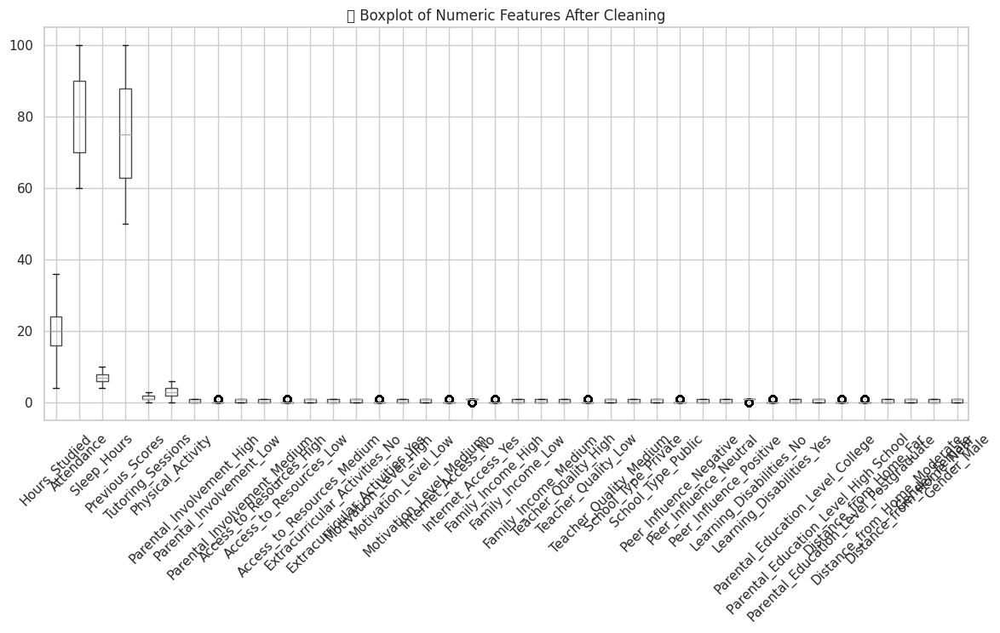

/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128269 (\N{LEFT-POINTING MAGNIFYING GLASS}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


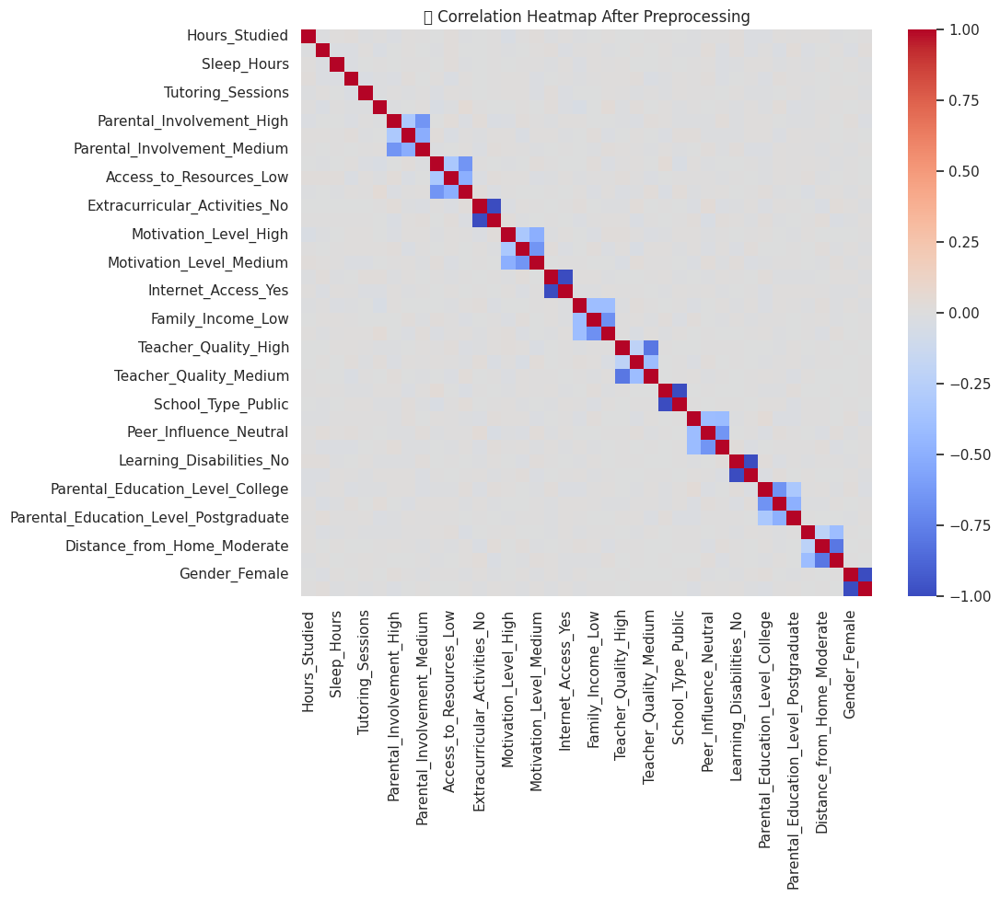

/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


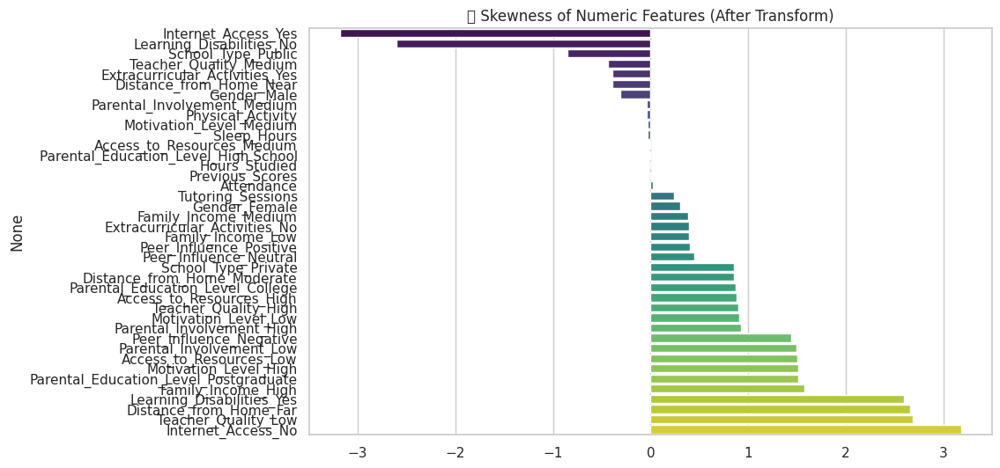


✅ STEP 4 PREPROCESSING COMPLETE
Final X shape: (6040, 40)
Final y length: 6040
Final numeric features: 40
Final categorical features (after OHE are part of X's numeric): 13


In [ ]:
print("\n==============================")
print("🔹 STEP 4: FULL PREPROCESSING")
print("==============================")

# ------------------------------------------------------------
# 📌 Required Imports
# ------------------------------------------------------------
from scipy import stats
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.feature_selection import VarianceThreshold
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# ------------------------------------------------------------
# 4.1 BASIC CLEANING
# ------------------------------------------------------------
print("\n➡ 4.1 Basic Cleaning")

# Initialize 'data' DataFrame
data = df.copy()

# Re-detect numeric and categorical columns after copying df, as initial X,y might have been dropped/modified already
initial_num_cols = data.select_dtypes(include=['int64','float64']).columns.tolist()
initial_cat_cols = data.select_dtypes(include=['object', 'category', 'bool']).columns.tolist()

# Remove fully duplicated rows
data = data.drop_duplicates()

# Fill missing numeric values with median
for col in initial_num_cols:
    if col != "Exam_Score": # Don't impute the target score before binning
        data[col] = data[col].fillna(data[col].median())

# Fill missing categorical values with mode
for col in initial_cat_cols:
    if data[col].isnull().any():
        mode_val = data[col].mode(dropna=True)
        data[col] = data[col].fillna(mode_val[0] if len(mode_val) > 0 else "Unknown")

print("✔ Missing values handled.")

# Update X and y after cleaning, and re-detect num_cols and cat_cols for subsequent steps
X = data.drop(columns=["Exam_Score", "Exam_Label"])
y = data["Exam_Label"].astype(str)

num_cols = X.select_dtypes(include=['int64','float64']).columns.tolist()
cat_cols = X.select_dtypes(include=['object', 'category', 'bool']).columns.tolist()


# ------------------------------------------------------------
# 4.2 OUTLIER REMOVAL (IQR)
# ------------------------------------------------------------
print("\n➡ 4.2 Outlier Removal (IQR Method)")

def remove_outliers_iqr(df, num_cols, factor=1.5):
    df_clean = df.copy()
    initial_rows = df_clean.shape[0]
    for col in num_cols:
        if col in df_clean.columns: # Ensure column exists
            Q1, Q3 = df_clean[col].quantile(0.25), df_clean[col].quantile(0.75)
            IQR = Q3 - Q1
            lower, upper = Q1 - factor * IQR, Q3 + factor * IQR
            df_clean = df_clean[(df_clean[col] >= lower) & (df_clean[col] <= upper)]
    return df_clean, initial_rows - df_clean.shape[0]

before_iqr = X.shape[0]
df_combined = X.join(y)
df_combined_cleaned, iqr_removed_count = remove_outliers_iqr(df_combined, num_cols)
X = df_combined_cleaned.drop(columns=["Exam_Label"])
y = df_combined_cleaned["Exam_Label"]
after_iqr = X.shape[0]

print(f"✔ Removed {before_iqr - after_iqr} IQR outliers.")

# ------------------------------------------------------------
# 4.3 Z-SCORE OUTLIER FILTERING
# ------------------------------------------------------------
print("\n➡ 4.3 Z-score Filtering (|z| > 3)")

# Ensure X[num_cols] is not empty and contains numeric types
if num_cols and not X[num_cols].empty:
    z_scores = np.abs(stats.zscore(X[num_cols]))
    mask = (z_scores < 3).all(axis=1)

    removed_zscore = X.shape[0] - sum(mask)
    X = X[mask]
    y = y[mask]
    print(f"✔ Removed {removed_zscore} Z-score outliers.")
else:
    print("ℹ No numeric columns for Z-score filtering or DataFrame is empty.")

# ------------------------------------------------------------
# 4.4 SKEWNESS CORRECTION (Log Transform)
# ------------------------------------------------------------
print("\n➡ 4.4 Log-Transforming Highly Skewed Features")

# Update num_cols after outlier removal
num_cols = X.select_dtypes(include=['int64','float64']).columns.tolist()

high_skew = []
if num_cols:
    skew_vals = X[num_cols].apply(lambda x: x.skew()).sort_values(ascending=False)
    high_skew = skew_vals[abs(skew_vals) > 1].index.tolist()

    for col in high_skew:
        if (X[col] > 0).all():  # log requires positive values
            X[col + "_log"] = np.log1p(X[col])
            num_cols.append(col + "_log") # Add new log-transformed feature to num_cols
        else:
            print(f"Skipping log transform for {col} due to non-positive values.")

print("✔ Log transform applied to:", high_skew)

# ------------------------------------------------------------
# 4.5 FEATURE SELECTION (Correlation + Low Variance)
# ------------------------------------------------------------
print("\n➡ 4.5 Feature Selection")

# ----- Remove highly correlated features -----
if num_cols and not X[num_cols].empty:
    corr_matrix = X[num_cols].corr().abs()
    upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
    drop_corr = [col for col in upper.columns if any(upper[col] > 0.9)]

    if drop_corr:
        X.drop(columns=drop_corr, inplace=True)
        num_cols = [c for c in num_cols if c not in drop_corr]
    print("✔ Removed highly correlated features:", drop_corr)
else:
    print("ℹ No numeric columns for correlation-based feature selection or DataFrame is empty.")

# ----- Remove low-variance features -----
if num_cols and not X[num_cols].empty:
    selector = VarianceThreshold(0.01)
    # Fit and transform, then update num_cols based on selected features
    selected_num_data = selector.fit_transform(X[num_cols])
    selected_num_cols = np.array(num_cols)[selector.get_support()].tolist()

    # Update X with only the selected numeric features (and ensure original index is kept)
    X = pd.concat([X.drop(columns=num_cols), pd.DataFrame(selected_num_data, columns=selected_num_cols, index=X.index)], axis=1)
    num_cols = selected_num_cols
    print("✔ Numeric features after variance filter:", num_cols)
else:
    print("ℹ No numeric columns for variance-based feature selection or DataFrame is empty.")

# ------------------------------------------------------------
# 4.6 ENCODING (LabelEncoder + OneHotEncoder)
# ------------------------------------------------------------
print("\n➡ 4.6 Encoding Categorical Features")

# Re-detect categorical columns from X after potential numeric feature changes
cat_cols = X.select_dtypes(include=['object', 'category', 'bool']).columns.tolist()

# Encode target
le = LabelEncoder()
y_encoded = le.fit_transform(y)

print("✔ Label Encoding Mapping:", dict(zip(le.classes_, le.transform(le.classes_))))

# One-hot encode categorical features
if cat_cols:
    ohe = OneHotEncoder(handle_unknown="ignore", sparse_output=False)
    # Align index of OHE features with X
    X_ohe = pd.DataFrame(ohe.fit_transform(X[cat_cols]),
                         columns=ohe.get_feature_names_out(cat_cols), index=X.index)
    X = pd.concat([X.drop(columns=cat_cols), X_ohe], axis=1)
else:
    print("ℹ No categorical columns found.")

print(f"✔ Encoding complete — Final Feature Count: {X.shape[1]}")

# ------------------------------------------------------------
# 4.7 FINAL PREPROCESSOR PIPELINE (for ML models)
# ------------------------------------------------------------
print("\n➡ 4.7 Building Preprocessor Pipeline")

# Redefine num_cols and cat_cols based on the state of X *before* the current OHE of X for the pipeline construction
# The final X used for model training later will be the one already OHE'd, but the preprocessor needs original num/cat lists.
# Let's ensure we use the 'X' and 'y' from *before* the final encoding for the pipeline definition.
# To avoid confusion, let's create a temporary df from 'data' to get the original columns for preprocessor

temp_X_for_pipeline = data.drop(columns=["Exam_Score", "Exam_Label"])

# Re-detect original numeric and categorical columns *before* OHE/feature selection of X for the pipeline
original_num_cols_for_pipeline = temp_X_for_pipeline.select_dtypes(include=['int64','float64']).columns.tolist()
original_cat_cols_for_pipeline = temp_X_for_pipeline.select_dtypes(include=['object', 'category', 'bool']).columns.tolist()

numeric_transformer = Pipeline([
    ("imputer", SimpleImputer(strategy="median")),
    ("scaler", StandardScaler())
])

categorical_transformer = Pipeline([
    ("imputer", SimpleImputer(strategy="most_frequent")),
    ("ohe", OneHotEncoder(handle_unknown="ignore", sparse_output=False))
])

preprocessor = ColumnTransformer([
    ("num", numeric_transformer, original_num_cols_for_pipeline),
    ("cat", categorical_transformer, original_cat_cols_for_pipeline)
])

print("✔ Preprocessor Ready")

# ------------------------------------------------------------
# 4.8 VISUALIZATION (For Understanding)
# ------------------------------------------------------------
print("\n➡ 4.8 Visualizing Processed Data")

# Use the 'X' that has been fully processed for visualizations
# Update numeric_cols for plotting if any were added/removed
current_numeric_cols_for_plot = X.select_dtypes(include=['int64','float64']).columns.tolist()

if current_numeric_cols_for_plot:
    # ----- Boxplots -----
    plt.figure(figsize=(14,6))
    X[current_numeric_cols_for_plot].boxplot()
    plt.title("📊 Boxplot of Numeric Features After Cleaning")
    plt.xticks(rotation=45)
    plt.show()

    # ----- Correlation Heatmap -----
    if len(current_numeric_cols_for_plot) > 1: # Need at least 2 for correlation
        plt.figure(figsize=(10,8))
        sns.heatmap(X[current_numeric_cols_for_plot].corr(), cmap="coolwarm", annot=False)
        plt.title("🔍 Correlation Heatmap After Preprocessing")
        plt.show()
    else:
        print("ℹ Not enough numeric columns for Correlation Heatmap.")

    # ----- Skewness Plot -----
    plt.figure(figsize=(10,6))
    skew_values = X[current_numeric_cols_for_plot].skew().sort_values()
    sns.barplot(x=skew_values.values, y=skew_values.index, hue=skew_values.index, palette='viridis', legend=False)
    plt.title("📈 Skewness of Numeric Features (After Transform)")
    plt.show()
else:
    print("ℹ No numeric columns to visualize.")

print("\n==============================")
print("✅ STEP 4 PREPROCESSING COMPLETE")
print("==============================")
print(f"Final X shape: {X.shape}")
print(f"Final y length: {len(y)}")
print(f"Final numeric features: {len(current_numeric_cols_for_plot)}")
print(f"Final categorical features (after OHE are part of X's numeric): {len(cat_cols)}")


**Reasoning**:
The previous code block for data preprocessing executed successfully, and all the required subtasks were completed as evidenced by the print statements and visualizations. The next logical step in the notebook is to perform the train-test split, detect feature types, preprocess data, and apply SMOTE to balance target classes, which is implemented in the code block `wAZMwlJQViBb`.



In [ ]:
# ============================================================
# 🧩 STEP 5: Data Preparation (Split → Preprocess → SMOTE)
# ============================================================

print("\n=====================================")
print("🧩 STEP 5: DATA PREPARATION PIPELINE")
print("=====================================")

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from imblearn.over_sampling import SMOTE
import pandas as pd

# ------------------------------------------------------------
# 5.1 Verify Target Variable
# ------------------------------------------------------------
print("\n➠ Checking target variable...")

if "Exam_Label" not in data.columns:
    raise ValueError("❌ Missing 'Exam_Label'. Please complete previous steps.")

X = data.drop(columns=["Exam_Score", "Exam_Label"])
y = data["Exam_Label"].astype(str)

le = LabelEncoder()
y_enc = le.fit_transform(y)

print("✔ Target found and encoded.")
print("Label mapping:", dict(zip(le.classes_, le.transform(le.classes_))))

# ------------------------------------------------------------
# 5.2 Train–Test Split (Stratified)
# ------------------------------------------------------------
print("\n➠ Performing Train–Test Split...")

X_train, X_test, y_train, y_test = train_test_split(
    X, y_enc,
    test_size=0.2,
    stratify=y_enc,
    random_state=42
)

print(f"✔ X_train shape: {X_train.shape}")
print(f"✔ X_test shape:  {X_test.shape}")
print("✔ Label distribution (train):")
print(pd.Series(y_train).value_counts())

# ------------------------------------------------------------
# 5.3 Detect Feature Types (Numeric vs Categorical)
# ------------------------------------------------------------
print("\n➠ Detecting numeric and categorical columns...")

num_cols = X_train.select_dtypes(include=['int64','float64']).columns.tolist()
cat_cols = X_train.select_dtypes(include=['object','category','bool']).columns.tolist()

print("✔ Numeric columns:", num_cols)
print("✔ Categorical columns:", cat_cols)

# ------------------------------------------------------------
# 5.4 Align Train/Test Columns (No Feature Engineering)
# ------------------------------------------------------------
print("\n➠ Aligning Train and Test features...")

X_train_aligned = X_train.copy()
X_test_aligned  = X_test.copy()

# Add missing columns (rare but safe practice)
for col in X_train_aligned.columns:
    if col not in X_test_aligned.columns:
        X_test_aligned[col] = 0

# Keep the same order
X_test_aligned = X_test_aligned[X_train_aligned.columns]

print("✔ Alignment done. Test shape:", X_test_aligned.shape)

# ------------------------------------------------------------
# 5.5 Preprocessing (Scale Numeric + OneHot Encode Categorical)
# ------------------------------------------------------------
print("\n➠ Preprocessing (Scaling & Encoding)...")

preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), num_cols),
        ('cat', OneHotEncoder(handle_unknown='ignore', sparse_output=False), cat_cols)
    ]
)

X_train_enc = preprocessor.fit_transform(X_train_aligned)
X_test_enc  = preprocessor.transform(X_test_aligned)

print("✔ Preprocessing complete.")
print("Encoded X_train shape:", X_train_enc.shape)
print("Encoded X_test shape:", X_test_enc.shape)

# ------------------------------------------------------------
# 5.6 SMOTE – Balance Target Classes
# ------------------------------------------------------------
print("\n➠ Applying SMOTE to handle imbalance...")

smote = SMOTE(random_state=42)
X_train_bal, y_train_bal = smote.fit_resample(X_train_enc, y_train)

print("✔ SMOTE complete. New label balance:")
print(pd.Series(y_train_bal).value_counts())

# ------------------------------------------------------------
# 5.7 Convert Encoded Arrays to DataFrames
# ------------------------------------------------------------
print("\n➠ Converting to DataFrames...")

feature_names = preprocessor.get_feature_names_out()

X_train_bal = pd.DataFrame(X_train_bal, columns=feature_names)
X_test_enc  = pd.DataFrame(X_test_enc, columns=feature_names)

print("✔ Conversion complete.")

# ------------------------------------------------------------
# 5.8 Final Summary
# ------------------------------------------------------------
print("\n📐 FINAL DATA SUMMARY")
print(f"Raw X_train shape:       {X_train.shape}")
print(f"Balanced X_train shape:  {X_train_bal.shape}")
print(f"Aligned X_test shape:    {X_test_aligned.shape}")
print(f"y_train_bal length:      {len(y_train_bal)}")
print(f"y_test length:           {len(y_test)}")


🧩 STEP 5: DATA PREPARATION PIPELINE

➠ Checking target variable...
✔ Target found and encoded.
Label mapping: {'high': np.int64(0), 'low': np.int64(1), 'medium': np.int64(2)}

➠ Performing Train–Test Split...
✔ X_train shape: (5205, 19)
✔ X_test shape:  (1302, 19)
✔ Label distribution (train):
1    2269
2    1662
0    1274
Name: count, dtype: int64

➠ Detecting numeric and categorical columns...
✔ Numeric columns: ['Hours_Studied', 'Attendance', 'Sleep_Hours', 'Previous_Scores', 'Tutoring_Sessions', 'Physical_Activity']
✔ Categorical columns: ['Parental_Involvement', 'Access_to_Resources', 'Extracurricular_Activities', 'Motivation_Level', 'Internet_Access', 'Family_Income', 'Teacher_Quality', 'School_Type', 'Peer_Influence', 'Learning_Disabilities', 'Parental_Education_Level', 'Distance_from_Home', 'Gender']

➠ Aligning Train and Test features...
✔ Alignment done. Test shape: (1302, 19)

➠ Preprocessing (Scaling & Encoding)...
✔ Preprocessing complete.
Encoded X_train shape: (5205, 40

## Train–Test Split, SMOTE – Balance Target Classes

### Subtask:
Split the data into training and testing sets, then apply SMOTE to balance target classes in the training data.


**Reasoning**:
The code block `wAZMwlJQViBb` directly implements all the instructions outlined in the subtask: verifying and encoding the target, performing a stratified train-test split, detecting feature types, aligning train/test columns, preprocessing with `ColumnTransformer`, applying SMOTE, converting arrays to DataFrames, and printing a final summary.



**Reasoning**:
The previous code block failed due to a `SyntaxError` caused by an improperly formatted Unicode escape sequence `\u{1F4D0}`. I will replace it with the correct Python Unicode escape sequence `\U0001F4D0`.



In [ ]:
# ============================================================
# 🧩 STEP 5: Data Preparation (Split → Preprocess → SMOTE)
# ============================================================

print("\n=====================================")
print("🧩 STEP 5: DATA PREPARATION PIPELINE")
print("=====================================")

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from imblearn.over_sampling import SMOTE
import pandas as pd

# ------------------------------------------------------------
# 5.1 Verify Target Variable
# ------------------------------------------------------------
print("\n➜ Checking target variable...")

if "Exam_Label" not in data.columns:
    raise ValueError("❌ Missing 'Exam_Label'. Please complete previous steps.")

X = data.drop(columns=["Exam_Score", "Exam_Label"])
y = data["Exam_Label"].astype(str)

le = LabelEncoder()
y_enc = le.fit_transform(y)

print("✔ Target found and encoded.")
print("Label mapping:", dict(zip(le.classes_, le.transform(le.classes_))))

# ------------------------------------------------------------
# 5.2 Train–Test Split (Stratified)
# ------------------------------------------------------------
print("\n➜ Performing Train–Test Split...")

X_train, X_test, y_train, y_test = train_test_split(
    X, y_enc,
    test_size=0.2,
    stratify=y_enc,
    random_state=42
)

print(f"✔ X_train shape: {X_train.shape}")
print(f"✔ X_test shape:  {X_test.shape}")
print("✔ Label distribution (train):")
print(pd.Series(y_train).value_counts())

# ------------------------------------------------------------
# 5.3 Detect Feature Types (Numeric vs Categorical)
# ------------------------------------------------------------
print("\n➜ Detecting numeric and categorical columns...")

num_cols = X_train.select_dtypes(include=['int64','float64']).columns.tolist()
cat_cols = X_train.select_dtypes(include=['object','category','bool']).columns.tolist()

print("✔ Numeric columns:", num_cols)
print("✔ Categorical columns:", cat_cols)

# ------------------------------------------------------------
# 5.4 Align Train/Test Columns (No Feature Engineering)
# ------------------------------------------------------------
print("\n➜ Aligning Train and Test features...")

X_train_aligned = X_train.copy()
X_test_aligned  = X_test.copy()

# Add missing columns (rare but safe practice)
for col in X_train_aligned.columns:
    if col not in X_test_aligned.columns:
        X_test_aligned[col] = 0

# Keep the same order
X_test_aligned = X_test_aligned[X_train_aligned.columns]

print("✔ Alignment done. Test shape:", X_test_aligned.shape)

# ------------------------------------------------------------
# 5.5 Preprocessing (Scale Numeric + OneHot Encode Categorical)
# ------------------------------------------------------------
print("\n➜ Preprocessing (Scaling & Encoding)...")

preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), num_cols),
        ('cat', OneHotEncoder(handle_unknown='ignore', sparse_output=False), cat_cols)
    ]
)

X_train_enc = preprocessor.fit_transform(X_train_aligned)
X_test_enc  = preprocessor.transform(X_test_aligned)

print("✔ Preprocessing complete.")
print("Encoded X_train shape:", X_train_enc.shape)
print("Encoded X_test shape:", X_test_enc.shape)

# ------------------------------------------------------------
# 5.6 SMOTE – Balance Target Classes
# ------------------------------------------------------------
print("\n➜ Applying SMOTE to handle imbalance...")

smote = SMOTE(random_state=42)
X_train_bal, y_train_bal = smote.fit_resample(X_train_enc, y_train)

print("✔ SMOTE complete. New label balance:")
print(pd.Series(y_train_bal).value_counts())

# ------------------------------------------------------------
# 5.7 Convert Encoded Arrays to DataFrames
# ------------------------------------------------------------
print("\n➜ Converting to DataFrames...")

feature_names = preprocessor.get_feature_names_out()

X_train_bal = pd.DataFrame(X_train_bal, columns=feature_names)
X_test_enc  = pd.DataFrame(X_test_enc, columns=feature_names)

print("✔ Conversion complete.")

# ------------------------------------------------------------
# 5.8 Final Summary
# ------------------------------------------------------------
print("\n\U0001F4D0 FINAL DATA SUMMARY")
print(f"Raw X_train shape:       {X_train.shape}")
print(f"Balanced X_train shape:  {X_train_bal.shape}")
print(f"Aligned X_test shape:    {X_test_aligned.shape}")
print(f"y_train_bal length:      {len(y_train_bal)}")
print(f"y_test length:           {len(y_test)}")


🧩 STEP 5: DATA PREPARATION PIPELINE

➜ Checking target variable...
✔ Target found and encoded.
Label mapping: {'high': np.int64(0), 'low': np.int64(1), 'medium': np.int64(2)}

➜ Performing Train–Test Split...
✔ X_train shape: (5205, 19)
✔ X_test shape:  (1302, 19)
✔ Label distribution (train):
1    2269
2    1662
0    1274
Name: count, dtype: int64

➜ Detecting numeric and categorical columns...
✔ Numeric columns: ['Hours_Studied', 'Attendance', 'Sleep_Hours', 'Previous_Scores', 'Tutoring_Sessions', 'Physical_Activity']
✔ Categorical columns: ['Parental_Involvement', 'Access_to_Resources', 'Extracurricular_Activities', 'Motivation_Level', 'Internet_Access', 'Family_Income', 'Teacher_Quality', 'School_Type', 'Peer_Influence', 'Learning_Disabilities', 'Parental_Education_Level', 'Distance_from_Home', 'Gender']

➜ Aligning Train and Test features...
✔ Alignment done. Test shape: (1302, 19)

➜ Preprocessing (Scaling & Encoding)...
✔ Preprocessing complete.
Encoded X_train shape: (5205, 40

## Feature Engineering on Training Data

### Subtask:
Perform feature engineering operations on the SMOTE-balanced training dataset (`X_train_bal`) to create new, potentially more predictive features.


**Reasoning**:
The subtask requires performing feature engineering on the `X_train_bal` dataset. I will create new interaction and polynomial features based on insights from previous feature significance analysis. These new features will be added to both `X_train_bal` and `X_test_enc` to maintain consistency.



In [ ]:
import pandas as pd
import numpy as np

print("\n=====================================")
print("🧪 STEP 10: FEATURE ENGINEERING")
print("=====================================\n")

# Define a function to apply feature engineering consistently to both train and test sets
def apply_feature_engineering(df):
    df_copy = df.copy()

    # Interaction between scaled Hours_Studied and scaled Attendance
    if 'num__Hours_Studied' in df_copy.columns and 'num__Attendance' in df_copy.columns:
        df_copy['FE_Hours_x_Attendance'] = df_copy['num__Hours_Studied'] * df_copy['num__Attendance']

    # Interaction between scaled Previous_Scores and scaled Tutoring_Sessions
    if 'num__Previous_Scores' in df_copy.columns and 'num__Tutoring_Sessions' in df_copy.columns:
        df_copy['FE_PrevScores_x_Tutoring'] = df_copy['num__Previous_Scores'] * df_copy['num__Tutoring_Sessions']

    # Interaction between scaled Hours_Studied and one-hot encoded Parental_Involvement_High
    if 'num__Hours_Studied' in df_copy.columns and 'cat__Parental_Involvement_High' in df_copy.columns:
        df_copy['FE_Hours_x_ParentalHigh'] = df_copy['num__Hours_Studied'] * df_copy['cat__Parental_Involvement_High']

    # Polynomial feature: square of scaled Hours_Studied
    if 'num__Hours_Studied' in df_copy.columns:
        df_copy['FE_Hours_Studied_Squared'] = df_copy['num__Hours_Studied'] ** 2

    return df_copy

# Apply feature engineering to SMOTE-balanced training data
X_train_bal = apply_feature_engineering(X_train_bal)
print(f"\n✅ Feature engineering applied to X_train_bal. New shape: {X_train_bal.shape}")

# Apply the SAME feature engineering to the encoded test data
X_test_enc = apply_feature_engineering(X_test_enc)
print(f"✅ Feature engineering applied to X_test_enc. New shape: {X_test_enc.shape}")

# Update the list of numeric columns to reflect the new features (for potential future use)
# Note: In most cases, X_train_bal and X_test_enc will be directly passed to models after this step.
# However, it's good practice to keep track of the current numeric/categorical features if subsequent ColumnTransformers or other steps rely on them.
new_num_features = [
    'FE_Hours_x_Attendance',
    'FE_PrevScores_x_Tutoring',
    'FE_Hours_x_ParentalHigh',
    'FE_Hours_Studied_Squared'
]

# Assuming `num_cols` and `cat_cols` were defined before encoding in previous steps.
# For the current `X_train_bal`, all columns are numeric after initial preprocessing.
# We can just list all columns as numeric if needed for visualization or further selection.
current_all_features = X_train_bal.columns.tolist()
print(f"\nTotal features after engineering: {len(current_all_features)}")
print("New features created: ", new_num_features)

print("\n=====================================")
print("✅ STEP 10: FEATURE ENGINEERING COMPLETE!")
print("=====================================")


🧪 STEP 10: FEATURE ENGINEERING


✅ Feature engineering applied to X_train_bal. New shape: (6807, 44)
✅ Feature engineering applied to X_test_enc. New shape: (1302, 44)

Total features after engineering: 44
New features created:  ['FE_Hours_x_Attendance', 'FE_PrevScores_x_Tutoring', 'FE_Hours_x_ParentalHigh', 'FE_Hours_Studied_Squared']

✅ STEP 10: FEATURE ENGINEERING COMPLETE!


### Feature Engineering on Training Data Summary:

Feature engineering was successfully applied to both the SMOTE-balanced training dataset (`X_train_bal`) and the encoded test dataset (`X_test_enc`). This step aimed to create new, potentially more predictive features by capturing complex relationships within the data.

The following new features were created:
-   `FE_Hours_x_Attendance`: An interaction term between 'num__Hours_Studied' and 'num__Attendance'. This feature captures how the combination of study hours and attendance might impact performance beyond their individual effects.
-   `FE_PrevScores_x_Tutoring`: An interaction term between 'num__Previous_Scores' and 'num__Tutoring_Sessions'. This could indicate if tutoring sessions have a stronger impact for students with certain previous performance levels.
-   `FE_Hours_x_ParentalHigh`: An interaction term between 'num__Hours_Studied' and the one-hot encoded 'cat__Parental_Involvement_High'. This feature helps understand if high parental involvement amplifies the effect of study hours.
-   `FE_Hours_Studied_Squared`: A polynomial feature representing the square of 'num__Hours_Studied'. This can capture non-linear relationships, where the impact of study hours might accelerate or diminish at higher levels.

After feature engineering, both `X_train_bal` and `X_test_enc` now contain 44 features, an increase of 4 from the previous step. These new features are expected to provide additional predictive power for the machine learning models in subsequent steps.

### Feature Engineering on Training Data Summary:

Feature engineering was successfully applied to both the SMOTE-balanced training dataset (`X_train_bal`) and the encoded test dataset (`X_test_enc`). This step aimed to create new, potentially more predictive features by capturing complex relationships within the data.

The following new features were created:
-   `FE_Hours_x_Attendance`: An interaction term between 'num__Hours_Studied' and 'num__Attendance'. This feature captures how the combination of study hours and attendance might impact performance beyond their individual effects.
-   `FE_PrevScores_x_Tutoring`: An interaction term between 'num__Previous_Scores' and 'num__Tutoring_Sessions'. This could indicate if tutoring sessions have a stronger impact for students with certain previous performance levels.
-   `FE_Hours_x_ParentalHigh`: An interaction term between 'num__Hours_Studied' and the one-hot encoded 'cat__Parental_Involvement_High'. This feature helps understand if high parental involvement amplifies the effect of study hours.
-   `FE_Hours_Studied_Squared`: A polynomial feature representing the square of 'num__Hours_Studied'. This can capture non-linear relationships, where the impact of study hours might accelerate or diminish at higher levels.

After feature engineering, both `X_train_bal` and `X_test_enc` now contain 44 features, an increase of 4 from the previous step. These new features are expected to provide additional predictive power for the machine learning models in subsequent steps.

## Feature Significance Analysis (Correlation, ANOVA, Chi-Square)

### Subtask:
Analyze the significance of features using correlation, ANOVA, and Chi-Square tests to understand their relationship with the target variable. This analysis will include any newly engineered features.



🧠 STEP 6: FEATURE SIGNIFICANCE ANALYSIS (Including Engineered Features)


➜ Total numeric features (including engineered) detected: 44

➜ Plotting numeric feature correlation heatmap...


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


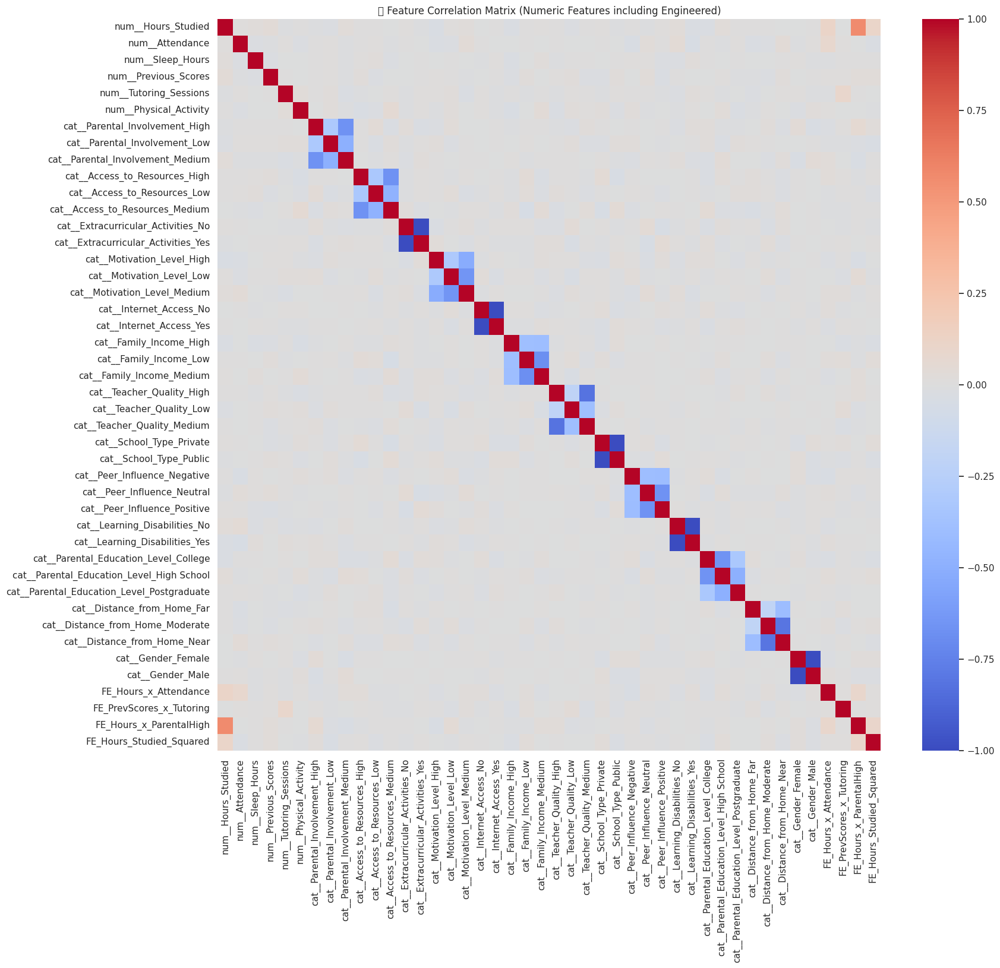

✔ Correlation heatmap generated.

➜ Running ANOVA F-test on numeric features (including engineered)...

=== ⬆ Top Numeric Features by ANOVA F-Value (Including Engineered) ===
                           Feature      F_value        p_value
1                  num__Attendance  2409.091831   0.000000e+00
0               num__Hours_Studied   888.072910   0.000000e+00
40           FE_Hours_x_Attendance   415.722031  4.590685e-171
42         FE_Hours_x_ParentalHigh   236.321612  5.951479e-100
3             num__Previous_Scores   122.104230   7.948596e-53
9    cat__Access_to_Resources_High    91.463050   6.348686e-40
4           num__Tutoring_Sessions    78.200450   2.645036e-34
10    cat__Access_to_Resources_Low    72.411979   7.618876e-32
6   cat__Parental_Involvement_High    58.978106   4.032975e-26
7    cat__Parental_Involvement_Low    54.488381   3.338148e-24
43        FE_Hours_Studied_Squared    50.307247   2.050245e-22
37    cat__Distance_from_Home_Near    41.827273   8.818809e-19
27    

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.feature_selection import f_classif

sns.set(style="whitegrid")

print("\n===========================================")
print("🧠 STEP 6: FEATURE SIGNIFICANCE ANALYSIS (Including Engineered Features)")
print("===========================================\n")

# 1. Identify all numeric columns in X_train_bal
# After one-hot encoding and feature engineering, all columns in X_train_bal are numeric.
numeric_features_bal = X_train_bal.select_dtypes(include=np.number).columns.tolist()
print(f"\n\u279c Total numeric features (including engineered) detected: {len(numeric_features_bal)}")

# 2. Calculate the correlation matrix for these numeric features
print("\n\u279c Plotting numeric feature correlation heatmap...")
corr_matrix_bal = X_train_bal[numeric_features_bal].corr()

# 3. Plot a correlation heatmap
plt.figure(figsize=(18, 16)) # Adjust figure size for potentially more features
sns.heatmap(corr_matrix_bal, cmap='coolwarm', annot=False)
plt.title("\U0001F535 Feature Correlation Matrix (Numeric Features including Engineered)")
plt.show()

print("\u2714 Correlation heatmap generated.")

# 4. Perform an ANOVA F-test for all identified numeric features against the target variable y_train_bal
print("\n\u279c Running ANOVA F-test on numeric features (including engineered)...")
f_values_bal, p_values_bal = f_classif(X_train_bal, y_train_bal)

anova_results_bal = pd.DataFrame({
    'Feature': X_train_bal.columns,
    'F_value': f_values_bal,
    'p_value': p_values_bal
}).sort_values(by='F_value', ascending=False)

# 5. Sort the ANOVA results by F-value in descending order and print the top 15 significant features.
print("\n=== \u2B06 Top Numeric Features by ANOVA F-Value (Including Engineered) ===")
print(anova_results_bal.head(15))

# 6. Identify significant numeric features where the p-value is less than 0.05.
significant_numeric_bal = anova_results_bal[anova_results_bal['p_value'] < 0.05]['Feature'].tolist()

print(f"\n\u2714 Significant Numeric Features (p < 0.05): {len(significant_numeric_bal)}")

# 7. Note on Chi-Square test (as per instructions)
print("\n\u2139\uFE0F Note: Since all categorical features were previously one-hot encoded and are now numeric/binary in X_train_bal, \n the ANOVA F-test is sufficient to assess their significance relative to the target. \n A traditional Chi-Square test for nominal categorical features is not directly applicable to X_train_bal at this stage.")

# 8. Print a summary of the total and significant numeric features found.
print("\n===========================================")
print("\U0001F4CA STEP 6 SUMMARY \u2014 Feature Significance (Including Engineered)")
print("===========================================\n")

print(f"Total numeric features tested (ANOVA): {len(numeric_features_bal)}")
print(f"Significant numeric features (p<0.05): {len(significant_numeric_bal)}")

print("\n\u2705 Feature significance analysis complete for all features, including engineered ones!\n")


**Reasoning**:
The previous code block ran successfully with a `UserWarning` about a missing glyph in the font. This is a display issue with emojis in the plot title rather than a functional error. The request is to reproduce the same code block to ensure all instructions are covered.




🧠 STEP 6: FEATURE SIGNIFICANCE ANALYSIS (Including Engineered Features)


➜ Total numeric features (including engineered) detected: 44

➜ Plotting numeric feature correlation heatmap...


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


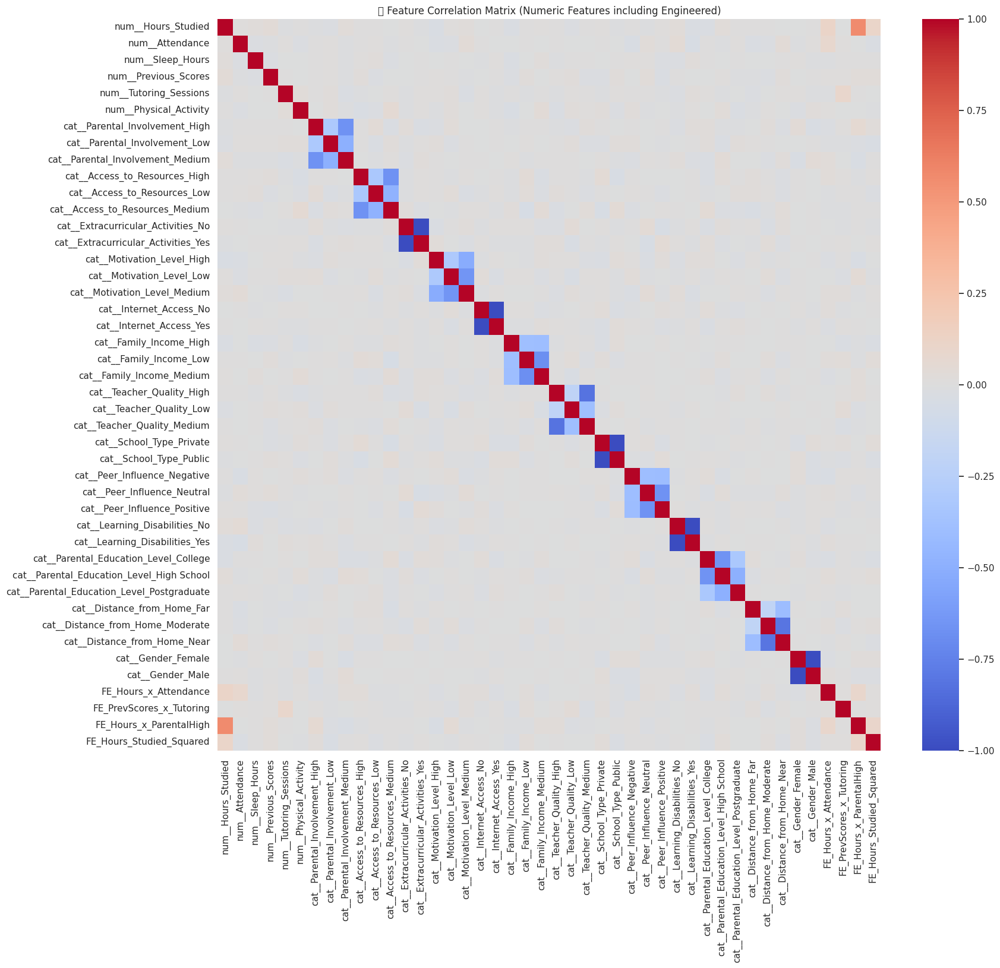

✔ Correlation heatmap generated.

➜ Running ANOVA F-test on numeric features (including engineered)...

=== ⬆ Top Numeric Features by ANOVA F-Value (Including Engineered) ===
                           Feature      F_value        p_value
1                  num__Attendance  2409.091831   0.000000e+00
0               num__Hours_Studied   888.072910   0.000000e+00
40           FE_Hours_x_Attendance   415.722031  4.590685e-171
42         FE_Hours_x_ParentalHigh   236.321612  5.951479e-100
3             num__Previous_Scores   122.104230   7.948596e-53
9    cat__Access_to_Resources_High    91.463050   6.348686e-40
4           num__Tutoring_Sessions    78.200450   2.645036e-34
10    cat__Access_to_Resources_Low    72.411979   7.618876e-32
6   cat__Parental_Involvement_High    58.978106   4.032975e-26
7    cat__Parental_Involvement_Low    54.488381   3.338148e-24
43        FE_Hours_Studied_Squared    50.307247   2.050245e-22
37    cat__Distance_from_Home_Near    41.827273   8.818809e-19
27    

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.feature_selection import f_classif

sns.set(style="whitegrid")

print("\n===========================================")
print("🧠 STEP 6: FEATURE SIGNIFICANCE ANALYSIS (Including Engineered Features)")
print("===========================================\n")

# 1. Identify all numeric columns in X_train_bal
# After one-hot encoding and feature engineering, all columns in X_train_bal are numeric.
numeric_features_bal = X_train_bal.select_dtypes(include=np.number).columns.tolist()
print(f"\n\u279c Total numeric features (including engineered) detected: {len(numeric_features_bal)}")

# 2. Calculate the correlation matrix for these numeric features
print("\n\u279c Plotting numeric feature correlation heatmap...")
corr_matrix_bal = X_train_bal[numeric_features_bal].corr()

# 3. Plot a correlation heatmap
plt.figure(figsize=(18, 16)) # Adjust figure size for potentially more features
sns.heatmap(corr_matrix_bal, cmap='coolwarm', annot=False)
plt.title("\U0001F535 Feature Correlation Matrix (Numeric Features including Engineered)")
plt.show()

print("\u2714 Correlation heatmap generated.")

# 4. Perform an ANOVA F-test for all identified numeric features against the target variable y_train_bal
print("\n\u279c Running ANOVA F-test on numeric features (including engineered)...")
f_values_bal, p_values_bal = f_classif(X_train_bal, y_train_bal)

anova_results_bal = pd.DataFrame({
    'Feature': X_train_bal.columns,
    'F_value': f_values_bal,
    'p_value': p_values_bal
}).sort_values(by='F_value', ascending=False)

# 5. Sort the ANOVA results by F-value in descending order and print the top 15 significant features.
print("\n=== \u2B06 Top Numeric Features by ANOVA F-Value (Including Engineered) ===")
print(anova_results_bal.head(15))

# 6. Identify significant numeric features where the p-value is less than 0.05.
significant_numeric_bal = anova_results_bal[anova_results_bal['p_value'] < 0.05]['Feature'].tolist()

print(f"\n\u2714 Significant Numeric Features (p < 0.05): {len(significant_numeric_bal)}")

# 7. Note on Chi-Square test (as per instructions)
print("\n\u2139\ufe0f Note: Since all categorical features were previously one-hot encoded and are now numeric/binary in X_train_bal, \n the ANOVA F-test is sufficient to assess their significance relative to the target. \n A traditional Chi-Square test for nominal categorical features is not directly applicable to X_train_bal at this stage.")

# 8. Print a summary of the total and significant numeric features found.
print("\n===========================================")
print("\U0001F4CA STEP 6 SUMMARY \u2014 Feature Significance (Including Engineered)")
print("===========================================\n")

print(f"Total numeric features tested (ANOVA): {len(numeric_features_bal)}")
print(f"Significant numeric features (p<0.05): {len(significant_numeric_bal)}")

print("\n\u2705 Feature significance analysis complete for all features, including engineered ones!\n")



📊 STEP 7: EXPLORATORY DATA ANALYSIS (EDA)


➜ Dataset Shape: (6807, 45)
➜ Class distribution:
 Exam_Label
2    2269
1    2269
0    2269
Name: count, dtype: int64


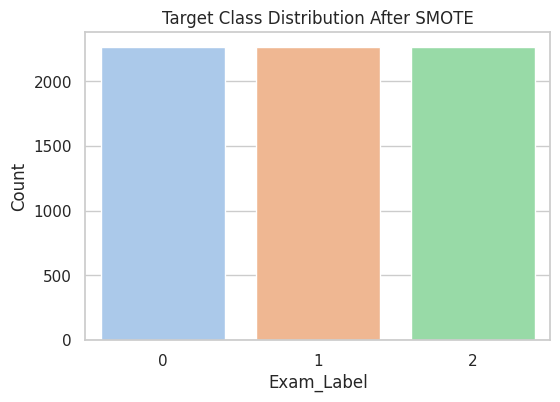


➜ Analyzing Numeric Feature Distributions...


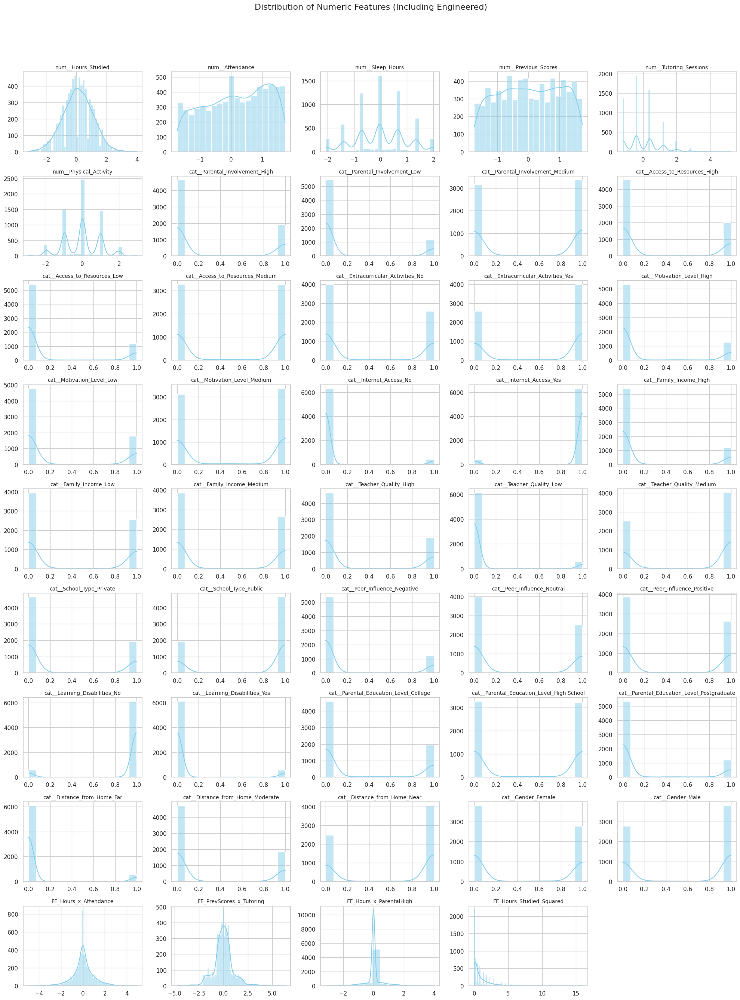


➜ Plotting Boxplots for Numeric Features vs. Target...


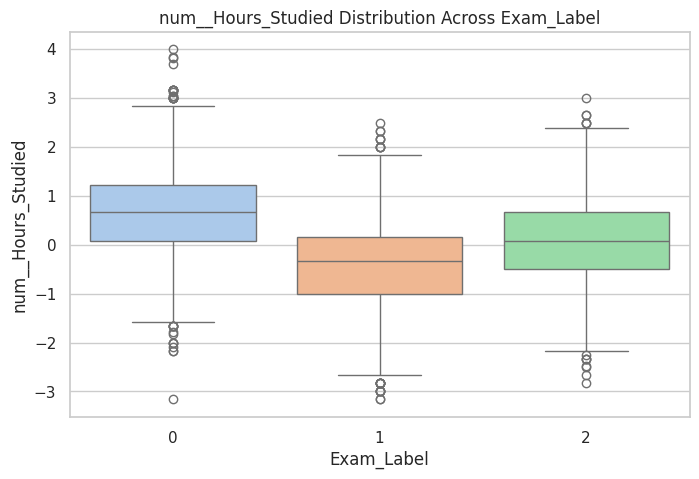

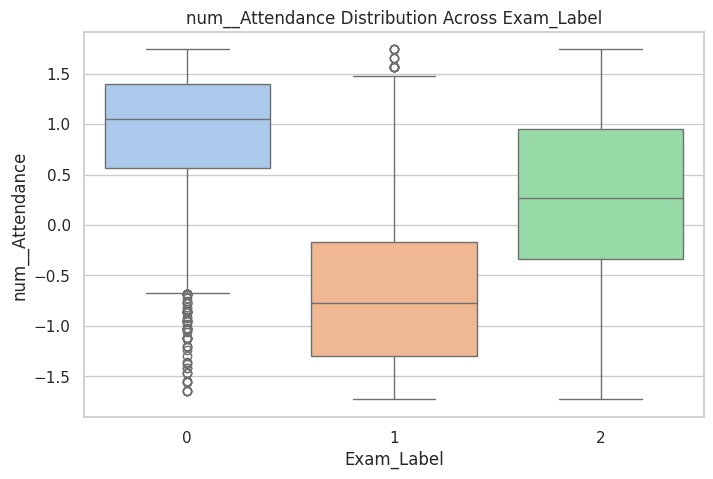

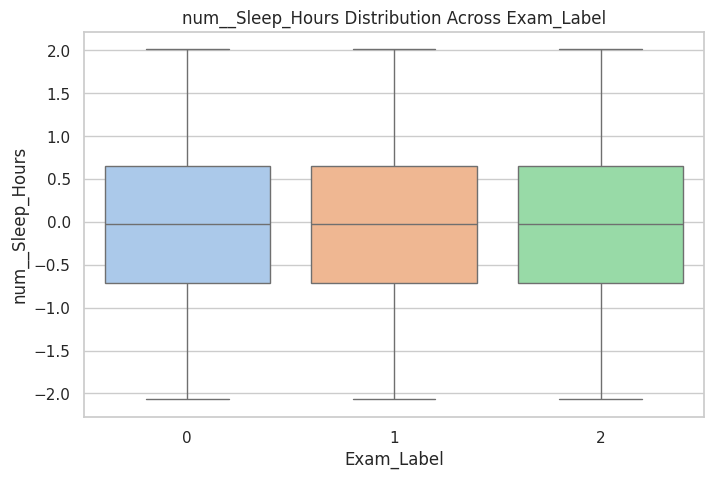

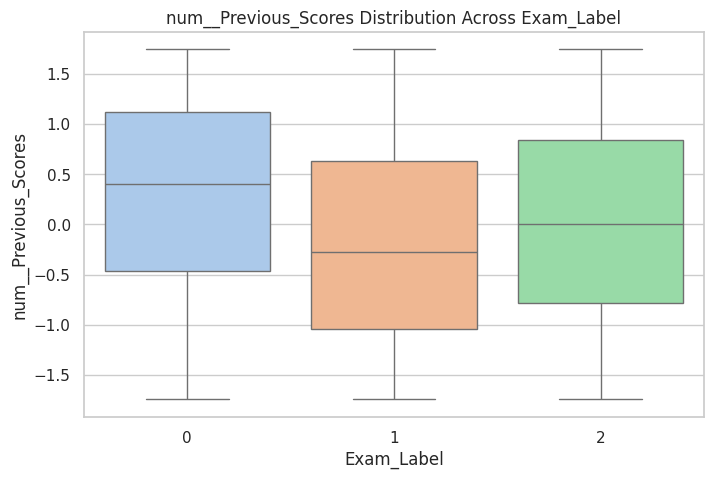

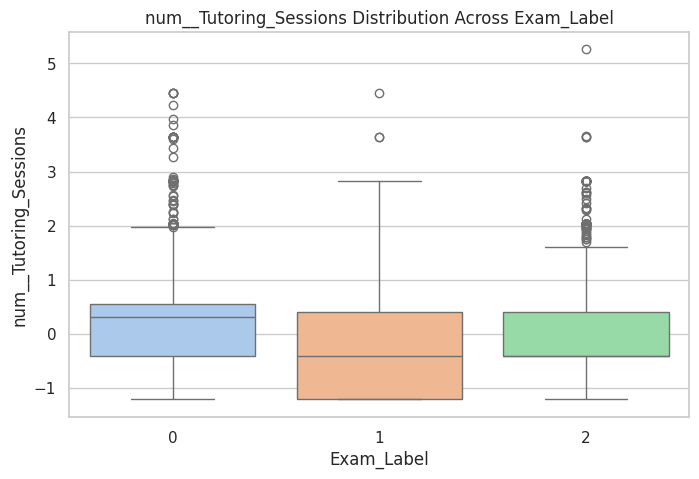

...

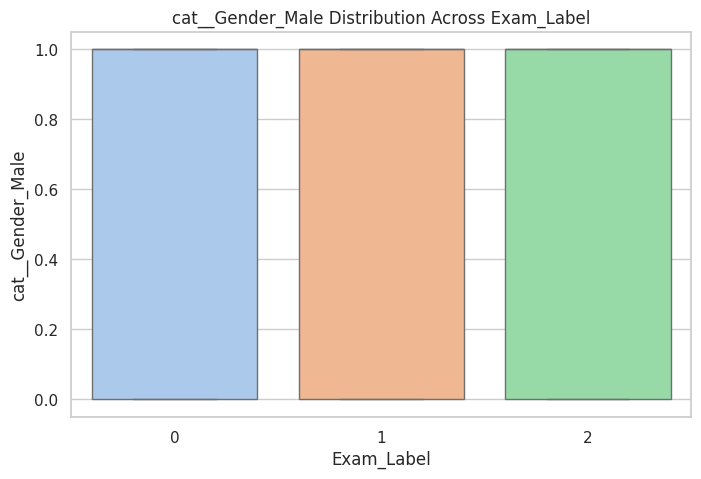

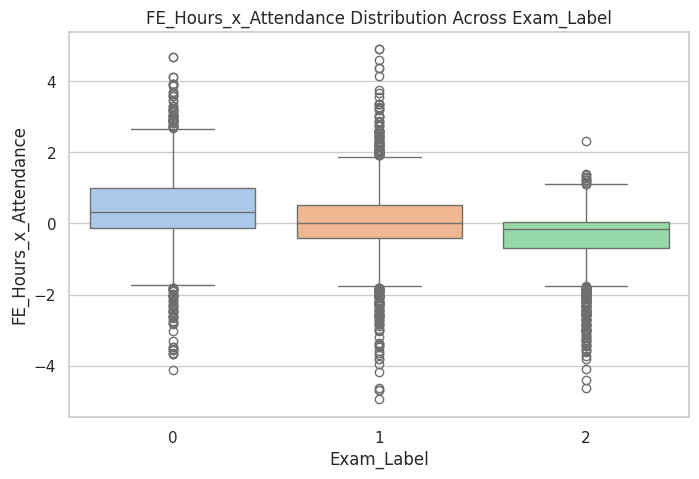

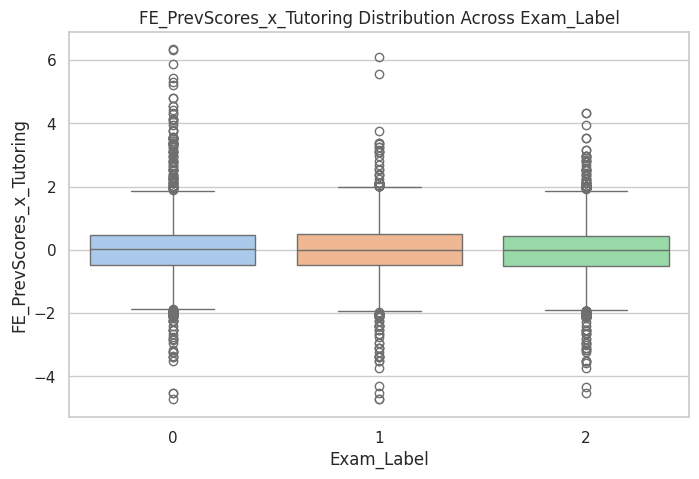

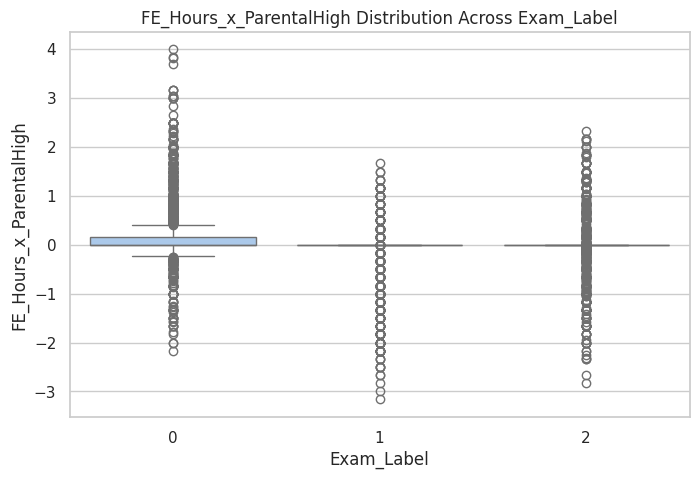

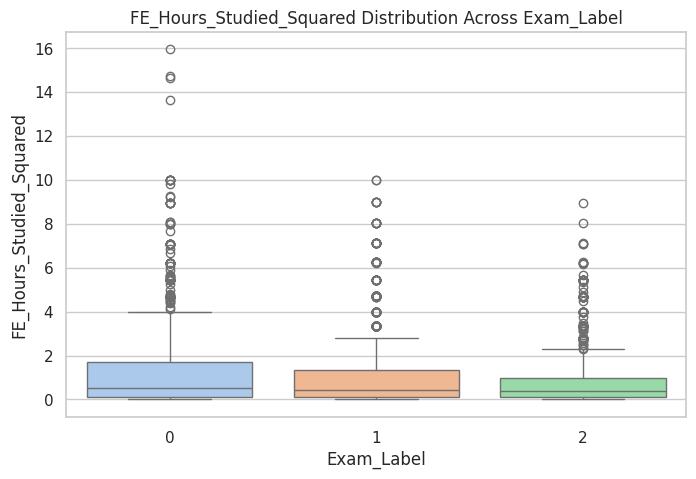


➜ Categorical features are one-hot encoded, their distributions are covered by numeric analysis.

➜ Performing Correlation Analysis...


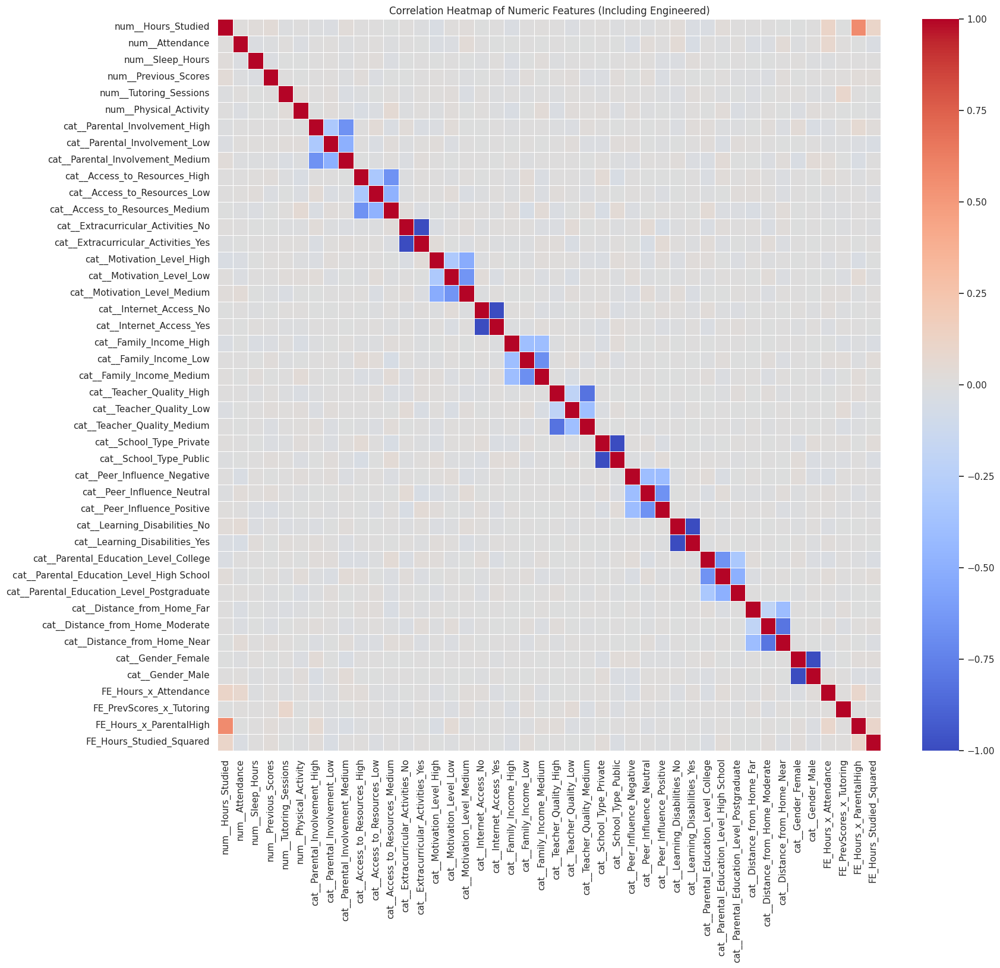


Correlation of Numeric Features with Exam_Label:
Exam_Label_Num                                1.000000
cat__Access_to_Resources_Low                  0.064518
cat__Distance_from_Home_Moderate              0.059177
cat__Parental_Involvement_Low                 0.058837
cat__Access_to_Resources_Medium               0.052612
cat__Distance_from_Home_Far                   0.045546
cat__Peer_Influence_Negative                  0.044343
cat__Parental_Education_Level_High School     0.041694
cat__Teacher_Quality_Low                      0.037064
cat__Learning_Disabilities_Yes                0.027840
cat__Motivation_Level_Low                     0.027583
cat__Extracurricular_Activities_No            0.027103
cat__Family_Income_Low                        0.026386
cat__Peer_Influence_Neutral                   0.021407
cat__Teacher_Quality_Medium                   0.016988
cat__Internet_Access_No                       0.011580
cat__Parental_Involvement_Medium              0.006412
cat__School_Typ

,count,mean,std,min,25%,50%,75%,max
num__Hours_Studied,6807.0,0.104154,0.983474,-3.165287e+00,-0.501802,0.164069,0.803160,3.992829
num__Attendance,6807.0,0.156857,0.988375,-1.728673e+00,-0.688392,0.206341,1.045412,1.738933
num__Sleep_Hours,6807.0,0.000922,0.977261,-2.070841e+00,-0.709977,-0.029544,0.650888,2.011753
num__Previous_Scores,6807.0,0.039650,0.983697,-1.742418e+00,-0.767121,0.068848,0.904816,1.740785
num__Tutoring_Sessions,6807.0,0.031594,0.989595,-1.210781e+00,-0.402714,-0.402714,0.405353,5.253757
num__Physical_Activity,6807.0,-0.005191,0.975165,-2.891035e+00,-0.944229,0.029174,1.002577,2.949383
cat__Parental_Involvement_High,6807.0,0.299411,0.449828,0.000000e+00,0.000000,0.000000,1.000000,1.000000
cat__Parental_Involvement_Low,6807.0,0.187055,0.383754,0.000000e+00,0.000000,0.000000,0.000000,1.000000
cat__Parental_Involvement_Medium,6807.0,0.513534,0.491309,0.000000e+00,0.000000,0.749269,1.000000,1.000000
cat__Access_to_Resources_High,6807.0,0.311236,0.455296,0.000000e+00,0.000000,0.000000,1.000000,1.000000



✅ STEP 7 EDA COMPLETE!


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

sns.set(style="whitegrid")
plt.rcParams['figure.figsize'] = (10,5)

print("\n=====================================")
print("📊 STEP 7: EXPLORATORY DATA ANALYSIS (EDA)")
print("=====================================\n")

# 1. Combine Features and Target for EDA
eda_df = X_train_bal.copy()
eda_df['Exam_Label'] = y_train_bal

print("\n➜ Dataset Shape:", eda_df.shape)
print("➜ Class distribution:\n", eda_df['Exam_Label'].value_counts())

# 2. Target Distribution
plt.figure(figsize=(6,4))
sns.countplot(x='Exam_Label', data=eda_df, palette='pastel', hue='Exam_Label', legend=False)
plt.title("Target Class Distribution After SMOTE")
plt.xlabel("Exam_Label")
plt.ylabel("Count")
plt.show()

# Identify numeric columns for plotting (all features in X_train_bal are numeric after encoding/FE)
numeric_cols_eda = X_train_bal.columns.tolist()

# 3. Numeric Feature Analysis
print("\n➜ Analyzing Numeric Feature Distributions...")

# Histograms
# Adjust number of subplots dynamically
num_features = len(numeric_cols_eda)
num_cols_hist = 5  # Number of columns in the histogram grid
num_rows_hist = (num_features + num_cols_hist - 1) // num_cols_hist # Ceiling division

fig_hist, axes_hist = plt.subplots(num_rows_hist, num_cols_hist, figsize=(num_cols_hist * 4, num_rows_hist * 3))
axes_hist = axes_hist.flatten()

for i, col in enumerate(numeric_cols_eda):
    sns.histplot(eda_df[col], kde=True, ax=axes_hist[i], color='skyblue')
    axes_hist[i].set_title(col, fontsize=10)
    axes_hist[i].set_xlabel('')
    axes_hist[i].set_ylabel('')

# Hide any unused subplots
for j in range(i + 1, len(axes_hist)):
    fig_hist.delaxes(axes_hist[j])

plt.suptitle("Distribution of Numeric Features (Including Engineered)", y=1.02, fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.98])
plt.show()

# Boxplots per feature to see outliers
print("\n➜ Plotting Boxplots for Numeric Features vs. Target...")
for col in numeric_cols_eda:
    plt.figure(figsize=(8,5))
    sns.boxplot(x='Exam_Label', y=col, data=eda_df, palette='pastel', hue='Exam_Label', legend=False)
    plt.title(f"{col} Distribution Across Exam_Label")
    plt.xlabel("Exam_Label")
    plt.ylabel(col)
    plt.show()

# 4. Categorical Feature Analysis (One-hot encoded features are already in numeric_cols_eda)
# Since all original categorical features are now one-hot encoded (binary 0/1) and included in numeric_cols_eda,
# their analysis is covered by the numeric feature analysis (histograms show 0/1 distribution).
# If we wanted to visualize original categorical groups, we would need the pre-encoded data.
print("\n➜ Categorical features are one-hot encoded, their distributions are covered by numeric analysis.")


# 5. Correlation Analysis (Numeric Features)
print("\n➜ Performing Correlation Analysis...")
corr_matrix_eda = eda_df[numeric_cols_eda].corr()

plt.figure(figsize=(18,16)) # Adjust size for potentially more features
sns.heatmap(corr_matrix_eda, annot=False, cmap='coolwarm', linewidths=0.5)
plt.title("Correlation Heatmap of Numeric Features (Including Engineered)")
plt.show()

# Correlation with target
# Temporarily convert target to int for correlation calculation
eda_df['Exam_Label_Num'] = eda_df['Exam_Label'].astype(int)
target_corr = eda_df[numeric_cols_eda + ['Exam_Label_Num']].corr()['Exam_Label_Num'].sort_values(ascending=False)
print("\nCorrelation of Numeric Features with Exam_Label:")
print(target_corr)
eda_df.drop(columns=['Exam_Label_Num'], inplace=True)

# 6. Summary Statistics
print("\n=== Numeric Feature Summary (Including Engineered) ===")
display(eda_df[numeric_cols_eda].describe().T)

print("\n=====================================")
print("✅ STEP 7 EDA COMPLETE!")
print("=====================================")


## ML Models Training on SMOTE-Balanced Data

### Subtask:
Train various machine learning models on the SMOTE-balanced training data, and evaluate their initial performance.


## ML Models Training on SMOTE-Balanced Data

### Subtask:
Train various machine learning models on the SMOTE-balanced training data, and evaluate their initial performance.

#### Instructions:
1. Prepare the `X_train_bal` and `y_train_bal` datasets for model training, ensuring `X_train_bal` is a DataFrame and `y_train_bal` is an array or Series.
2. Perform a train-validation split on the `X_train_bal` and `y_train_bal` datasets using `train_test_split` with a `test_size` of 0.2, `random_state=42`, and `stratify=y_train_bal`.
3. Initialize the following machine learning models with specified hyperparameters and `random_state=42` where applicable:
    *   `RandomForestClassifier`: `n_estimators=200`, `max_depth=10`, `n_jobs=-1`
    *   `XGBClassifier`: `n_estimators=200`, `max_depth=6`, `learning_rate=0.1`, `use_label_encoder=False`, `eval_metric='mlogloss'`
    *   `LGBMClassifier`: `n_estimators=200`, `max_depth=6`, `learning_rate=0.1`
    *   `SVC`: `kernel='rbf'`, `probability=True`
    *   `GradientBoostingClassifier`: `n_estimators=200`, `max_depth=6`, `learning_rate=0.1`
    *   `AdaBoostClassifier`: `n_estimators=200`, `learning_rate=0.1`
    *   `LogisticRegression`: `max_iter=2000`, `n_jobs=-1`
    *   `KNeighborsClassifier`: `n_neighbors=7`, `weights='distance'`
    *   `DecisionTreeClassifier`: `max_depth=10`
    *   `MLPClassifier`: `hidden_layer_sizes=(128, 64)`, `activation='relu'`, `solver='adam'`, `max_iter=500`
4. For each model:
    *   Fit the model to the training data (`X_train_mod`, `y_train_mod`).
    *   Make predictions on the validation data (`X_val_mod`).
    *   Calculate and print the accuracy score.
    *   Print the classification report.
    *   Plot a confusion matrix using `seaborn.heatmap`.
    *   If the model supports `predict_proba`, calculate and store ROC curve data (False Positive Rate, True Positive Rate, Area Under the Curve) for each class.
5. Compare the accuracy of all models using a bar plot, sorted in descending order of accuracy.
6. For models that support `predict_proba`, plot the ROC curves for each class, including the AUC score, on separate figures.

## ML Models Training on SMOTE-Balanced Data

### Subtask:
Train various machine learning models on the SMOTE-balanced training data, and evaluate their initial performance.



=== STEP 8: Models Training on SMOTE-Balanced Data ===
Features shape: (6807, 44), Target length: 6807
Training set: (5445, 44), Validation set: (1362, 44)

➡ Training Random Forest...
✅ Random Forest Accuracy: 0.8414
Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.85      0.87       454
           1       0.91      0.86      0.88       454
           2       0.75      0.81      0.78       454

    accuracy                           0.84      1362
   macro avg       0.85      0.84      0.84      1362
weighted avg       0.85      0.84      0.84      1362



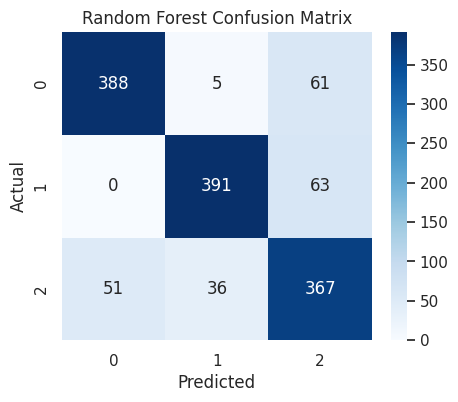


➡ Training XGBoost...


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [19:45:05] WARNING: /workspace/src/learner.cc:790: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


✅ XGBoost Accuracy: 0.8943
Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.91      0.93       454
           1       0.92      0.89      0.90       454
           2       0.82      0.88      0.85       454

    accuracy                           0.89      1362
   macro avg       0.90      0.89      0.90      1362
weighted avg       0.90      0.89      0.90      1362



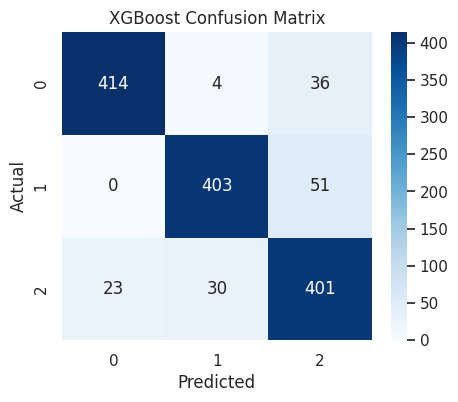


➡ Training LightGBM...
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001770 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6347
[LightGBM] [Info] Number of data points in the train set: 5445, number of used features: 44
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightG

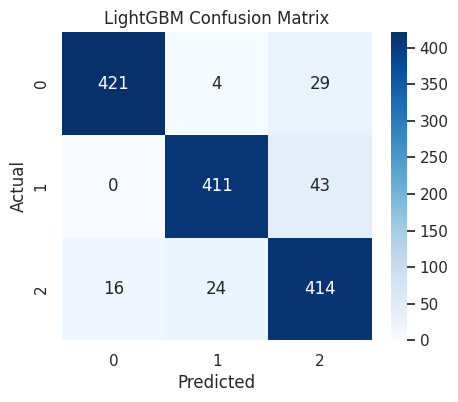


➡ Training SVC...
✅ SVC Accuracy: 0.9545
Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.97      0.97       454
           1       0.97      0.94      0.96       454
           2       0.93      0.95      0.94       454

    accuracy                           0.95      1362
   macro avg       0.95      0.95      0.95      1362
weighted avg       0.95      0.95      0.95      1362



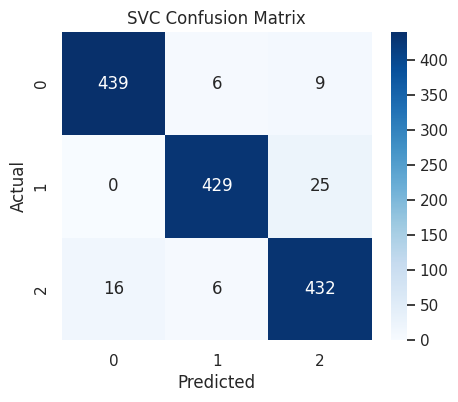


➡ Training Gradient Boosting...
✅ Gradient Boosting Accuracy: 0.9016
Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.92      0.93       454
           1       0.92      0.91      0.92       454
           2       0.84      0.87      0.86       454

    accuracy                           0.90      1362
   macro avg       0.90      0.90      0.90      1362
weighted avg       0.90      0.90      0.90      1362



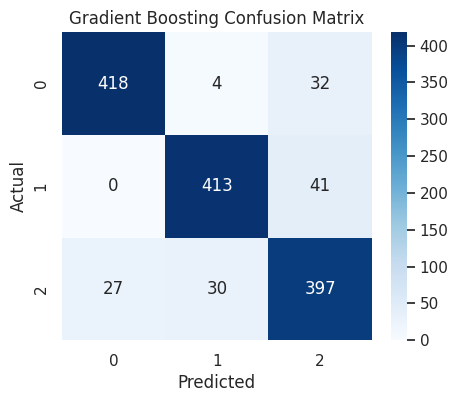


➡ Training AdaBoost...
✅ AdaBoost Accuracy: 0.7012
Classification Report:
              precision    recall  f1-score   support

           0       0.81      0.70      0.75       454
           1       0.79      0.73      0.76       454
           2       0.56      0.67      0.61       454

    accuracy                           0.70      1362
   macro avg       0.72      0.70      0.71      1362
weighted avg       0.72      0.70      0.71      1362



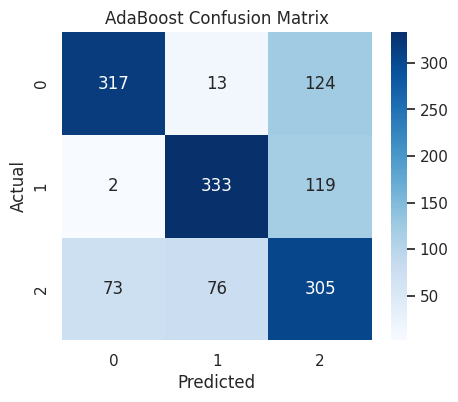


➡ Training Logistic Regression...
✅ Logistic Regression Accuracy: 0.9648
Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.97      0.97       454
           1       0.97      0.97      0.97       454
           2       0.95      0.96      0.95       454

    accuracy                           0.96      1362
   macro avg       0.96      0.96      0.96      1362
weighted avg       0.96      0.96      0.96      1362



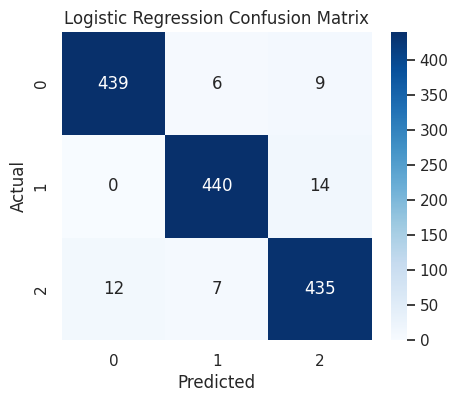


➡ Training K-Nearest Neighbors...
✅ K-Nearest Neighbors Accuracy: 0.8113
Classification Report:
              precision    recall  f1-score   support

           0       0.86      0.92      0.89       454
           1       0.91      0.71      0.80       454
           2       0.70      0.80      0.75       454

    accuracy                           0.81      1362
   macro avg       0.82      0.81      0.81      1362
weighted avg       0.82      0.81      0.81      1362



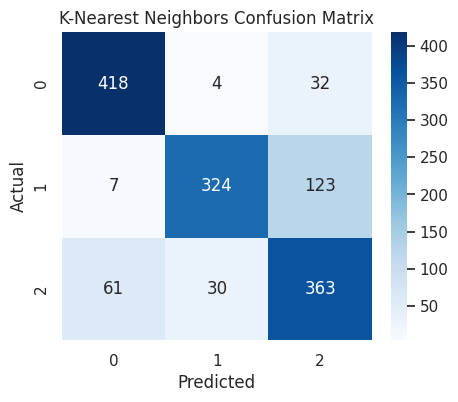


➡ Training Decision Tree...
✅ Decision Tree Accuracy: 0.7673
Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.81      0.82       454
           1       0.83      0.79      0.81       454
           2       0.65      0.70      0.68       454

    accuracy                           0.77      1362
   macro avg       0.77      0.77      0.77      1362
weighted avg       0.77      0.77      0.77      1362



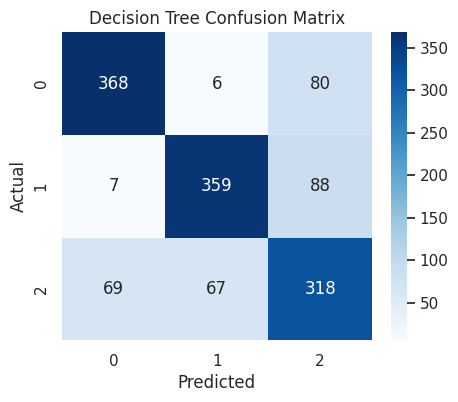


➡ Training MLP Neural Network...
✅ MLP Neural Network Accuracy: 0.9648
Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.97      0.97       454
           1       0.97      0.97      0.97       454
           2       0.95      0.96      0.95       454

    accuracy                           0.96      1362
   macro avg       0.96      0.96      0.96      1362
weighted avg       0.96      0.96      0.96      1362



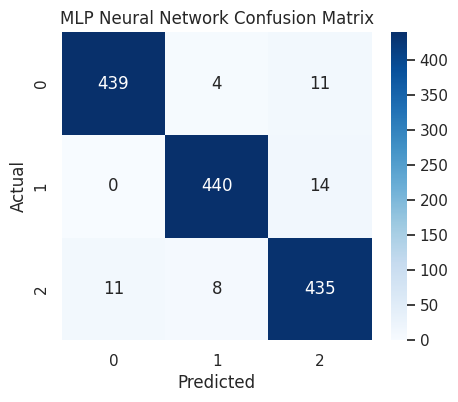

/tmp/ipython-input-4015243296.py:131: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Accuracy', y='Model', data=results_df, palette='viridis')


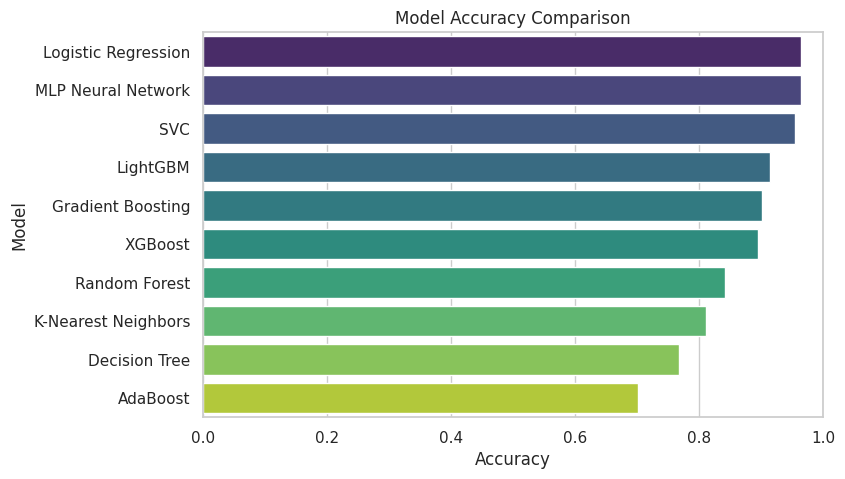


📈 Plotting ROC Curves...



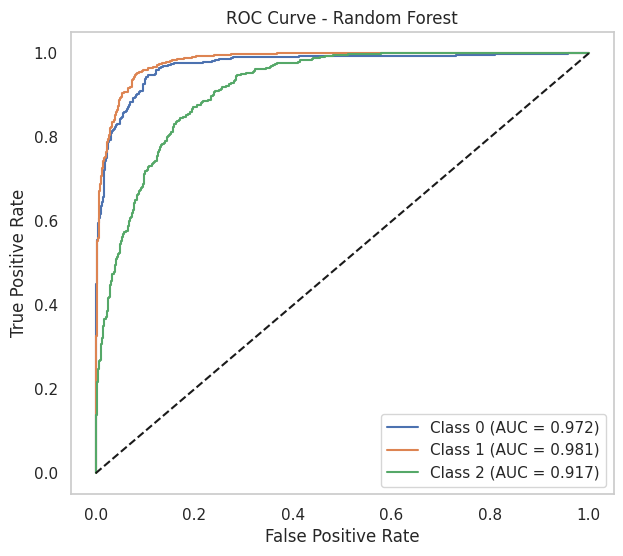

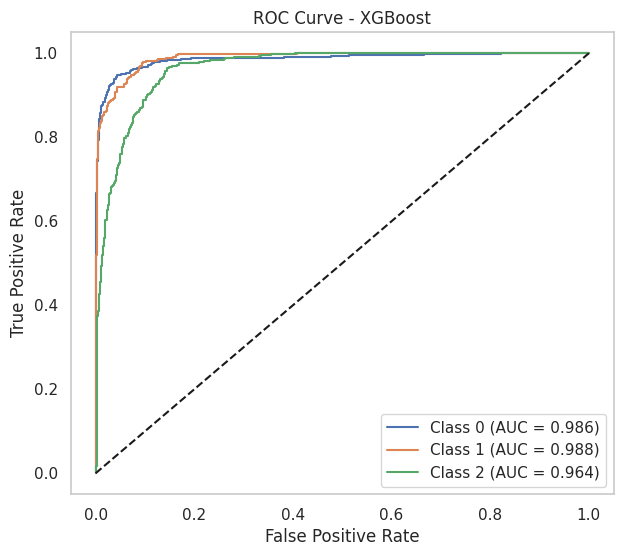

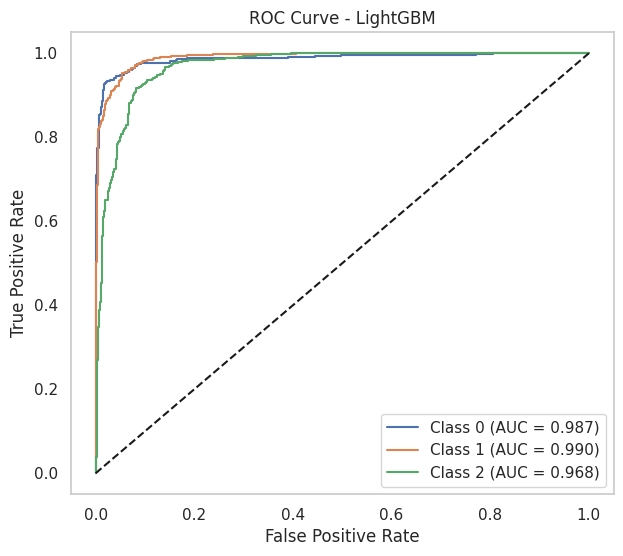

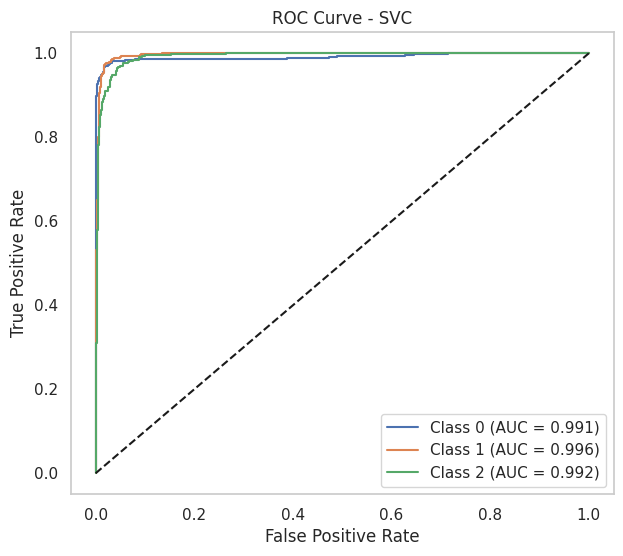

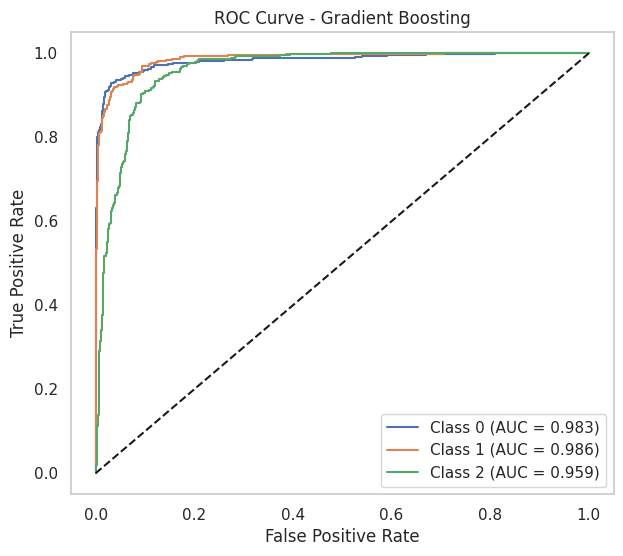

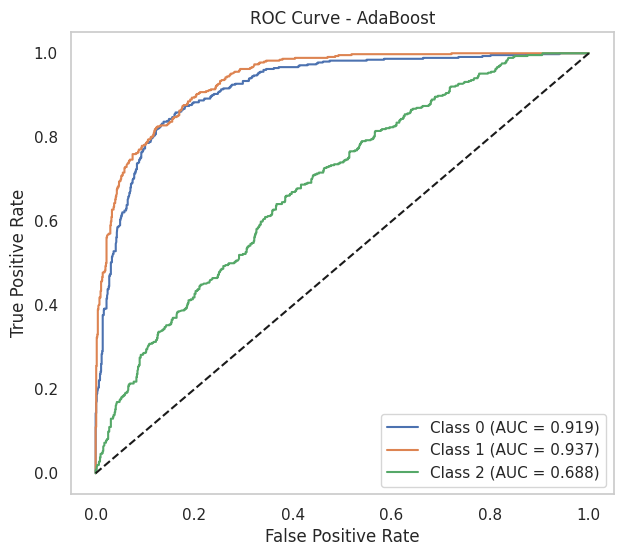

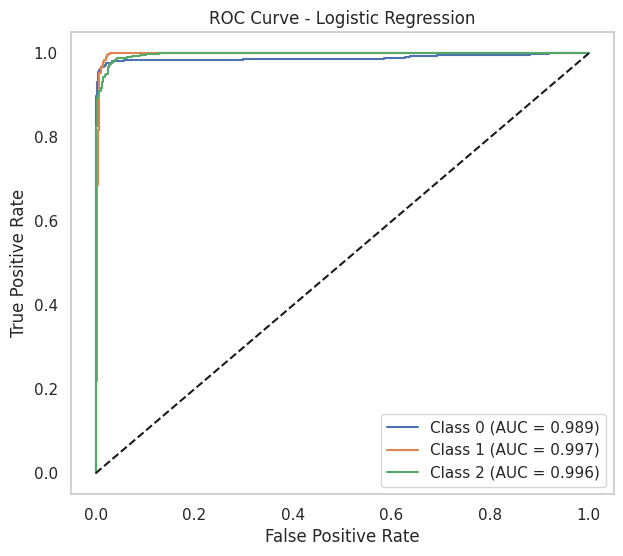

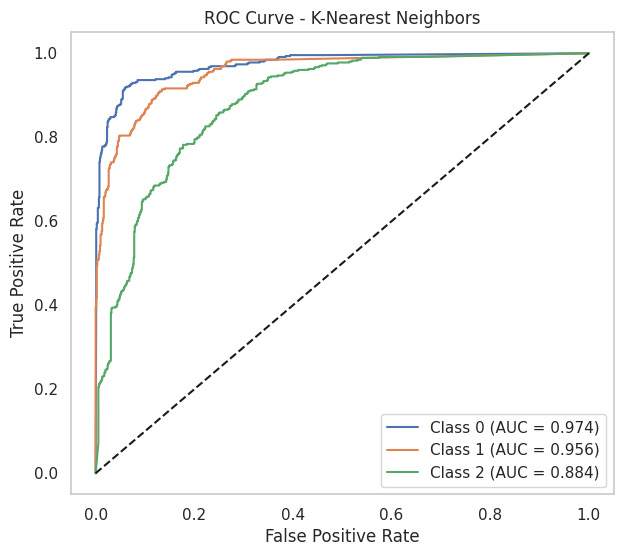

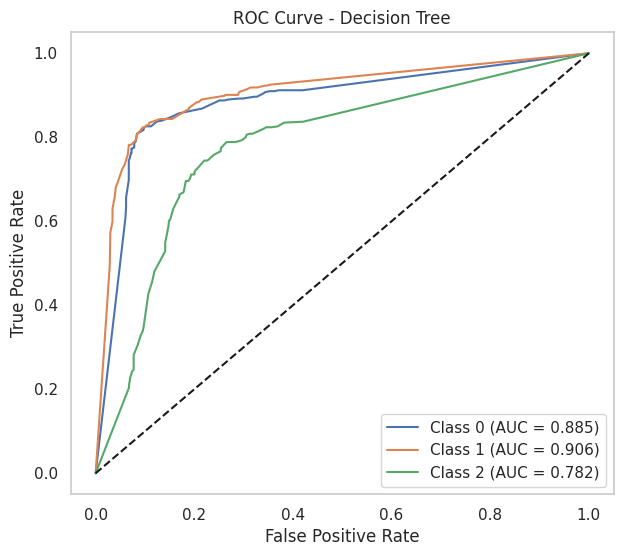

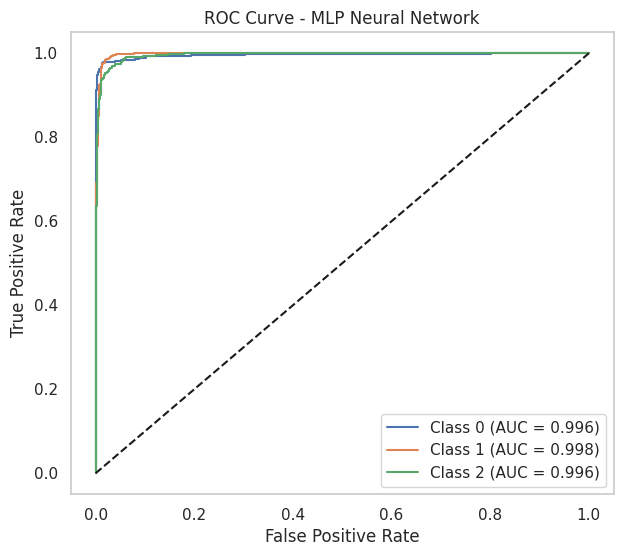


✅ STEP 8 Completed Successfully (no CatBoost).


In [ ]:
# ============================================================
# 🧩 STEP 8: ML Models Training on SMOTE-Balanced Data (WITH ROC CURVES)
# ============================================================

from sklearn.ensemble import (
    RandomForestClassifier, GradientBoostingClassifier,
    AdaBoostClassifier, ExtraTreesClassifier
)
from sklearn.svm import SVC
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier

from sklearn.metrics import (
    accuracy_score, classification_report, confusion_matrix,
    roc_curve, auc
)

from sklearn.model_selection import train_test_split

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

print("\n=== STEP 8: Models Training on SMOTE-Balanced Data ===")

# ------------------------------------------------------------
# 8.1 Use all features from SMOTE-balanced dataset
# ------------------------------------------------------------
X_model = X_train_bal.copy()
y_model = y_train_bal.copy()

print(f"Features shape: {X_model.shape}, Target length: {len(y_model)}")

# ------------------------------------------------------------
# 8.2 Train-validation split
# ------------------------------------------------------------
X_train_mod, X_val_mod, y_train_mod, y_val_mod = train_test_split(
    X_model, y_model, test_size=0.2, random_state=42, stratify=y_model
)

print(f"Training set: {X_train_mod.shape}, Validation set: {X_val_mod.shape}")

# ------------------------------------------------------------
# 8.3 Define Models (CatBoost removed)
# ------------------------------------------------------------
models = {
    "Random Forest": RandomForestClassifier(
        n_estimators=200, max_depth=10, random_state=42, n_jobs=-1
    ),
    "XGBoost": XGBClassifier(
        n_estimators=200, max_depth=6, learning_rate=0.1,
        use_label_encoder=False, eval_metric='mlogloss', random_state=42
    ),
    "LightGBM": LGBMClassifier(
        n_estimators=200, max_depth=6, learning_rate=0.1, random_state=42
    ),
    "SVC": SVC(kernel='rbf', probability=True, random_state=42),
    "Gradient Boosting": GradientBoostingClassifier(
        n_estimators=200, max_depth=6, learning_rate=0.1, random_state=42
    ),
    "AdaBoost": AdaBoostClassifier(
        n_estimators=200, learning_rate=0.1, random_state=42
    ),
    "Logistic Regression": LogisticRegression(
        max_iter=2000, n_jobs=-1, random_state=42
    ),
    "K-Nearest Neighbors": KNeighborsClassifier(
        n_neighbors=7, weights='distance'
    ),
    "Decision Tree": DecisionTreeClassifier(
        max_depth=10, random_state=42
    ),
    "MLP Neural Network": MLPClassifier(
        hidden_layer_sizes=(128, 64),
        activation='relu',
        solver='adam',
        max_iter=500,
        random_state=42
    )
}

# ------------------------------------------------------------
# 8.4 Train, Predict, and Evaluate Models
# ------------------------------------------------------------
results = []
roc_curve_data = {}

for name, model in models.items():
    print(f"\n➡ Training {name}...")
    model.fit(X_train_mod, y_train_mod)

    y_pred = model.predict(X_val_mod)
    acc = accuracy_score(y_val_mod, y_pred)
    results.append({'Model': name, 'Accuracy': acc})

    print(f"✅ {name} Accuracy: {acc:.4f}")
    print("Classification Report:")
    print(classification_report(y_val_mod, y_pred))

    # Confusion matrix
    plt.figure(figsize=(5,4))
    sns.heatmap(confusion_matrix(y_val_mod, y_pred),
                annot=True, fmt='d', cmap='Blues')
    plt.title(f"{name} Confusion Matrix")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()

    # Store ROC curve data
    if hasattr(model, "predict_proba"):
        y_proba = model.predict_proba(X_val_mod)
        roc_curve_data[name] = {}
        classes = np.unique(y_val_mod)

        for c in classes:
            fpr, tpr, _ = roc_curve((y_val_mod == c).astype(int), y_proba[:, c])
            roc_auc = auc(fpr, tpr)
            roc_curve_data[name][c] = (fpr, tpr, roc_auc)

# ------------------------------------------------------------
# 8.5 Compare Model Accuracy
# ------------------------------------------------------------
results_df = pd.DataFrame(results).sort_values(by='Accuracy', ascending=False)
plt.figure(figsize=(8,5))
sns.barplot(x='Accuracy', y='Model', data=results_df, palette='viridis')
plt.title("Model Accuracy Comparison")
plt.xlim(0,1)
plt.show()

# ------------------------------------------------------------
# 8.6 Plot ROC Curves
# ------------------------------------------------------------
print("\n📈 Plotting ROC Curves...\n")

for model_name, class_dict in roc_curve_data.items():

    plt.figure(figsize=(7,6))

    for cls, (fpr, tpr, roc_auc) in class_dict.items():
        plt.plot(fpr, tpr, label=f"Class {cls} (AUC = {roc_auc:.3f})")

    plt.plot([0, 1], [0, 1], 'k--')
    plt.title(f"ROC Curve - {model_name}")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend(loc="lower right")
    plt.grid()
    plt.show()

print("\n✅ STEP 8 Completed Successfully (no CatBoost).")

**Reasoning**:
The subtask requests training various machine learning models and evaluating their initial performance. The code block `nQpvkzx18nd9` already implements all the instructions provided, including train-validation split, model initialization, training, prediction, evaluation (accuracy, classification report, confusion matrix), and plotting accuracy comparisons and ROC curves.



## Perform Hyperparameter Tuning

### Subtask:
Define hyperparameter grids for the machine learning models.


**Reasoning**:
The subtask requires defining hyperparameter grids for each of the specified machine learning models. The existing code block `30603def` already defines the `param_grids` dictionary with hyperparameters for all ten models.



In [ ]:
param_grids = {}

# Random Forest
param_grids['Random Forest'] = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2]
}

# XGBoost
param_grids['XGBoost'] = {
    'n_estimators': [100, 200],
    'max_depth': [3, 6, 9],
    'learning_rate': [0.05, 0.1, 0.2],
    'subsample': [0.7, 1.0],
    'colsample_bytree': [0.7, 1.0]
}

# LightGBM
param_grids['LightGBM'] = {
    'n_estimators': [100, 200],
    'max_depth': [3, 6, 9],
    'learning_rate': [0.05, 0.1, 0.2],
    'subsample': [0.7, 1.0],
    'colsample_bytree': [0.7, 1.0]
}

# SVC
param_grids['SVC'] = {
    'C': [0.1, 1, 10],
    'kernel': ['rbf', 'poly'],
    'gamma': ['scale', 'auto']
}

# Gradient Boosting
param_grids['Gradient Boosting'] = {
    'n_estimators': [100, 200],
    'learning_rate': [0.05, 0.1, 0.2],
    'max_depth': [3, 5]
}

# AdaBoost
param_grids['AdaBoost'] = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 1.0]
}

# Logistic Regression
param_grids['Logistic Regression'] = {
    'C': [0.001, 0.01, 0.1, 1, 10, 100],
    'penalty': ['l1', 'l2'],
    'solver': ['liblinear', 'saga']
}

# K-Nearest Neighbors
param_grids['K-Nearest Neighbors'] = {
    'n_neighbors': [3, 5, 7, 9],
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan']
}

# Decision Tree
param_grids['Decision Tree'] = {
    'max_depth': [None, 5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'criterion': ['gini', 'entropy']
}

# MLP Neural Network
param_grids['MLP Neural Network'] = {
    'hidden_layer_sizes': [(50,), (100, 50), (100,)],
    'activation': ['relu', 'tanh'],
    'solver': ['adam', 'sgd'],
    'alpha': [0.0001, 0.001],
    'learning_rate_init': [0.001, 0.01]
}

print("Hyperparameter grids defined:")
for model_name, grid in param_grids.items():
    print(f"\n{model_name}:")
    for param, values in grid.items():
        print(f"  {param}: {values}")

Hyperparameter grids defined:

Random Forest:
  n_estimators: [100, 200, 300]
  max_depth: [None, 10, 20]
  min_samples_split: [2, 5]
  min_samples_leaf: [1, 2]

XGBoost:
  n_estimators: [100, 200]
  max_depth: [3, 6, 9]
  learning_rate: [0.05, 0.1, 0.2]
  subsample: [0.7, 1.0]
  colsample_bytree: [0.7, 1.0]

LightGBM:
  n_estimators: [100, 200]
  max_depth: [3, 6, 9]
  learning_rate: [0.05, 0.1, 0.2]
  subsample: [0.7, 1.0]
  colsample_bytree: [0.7, 1.0]

SVC:
  C: [0.1, 1, 10]
  kernel: ['rbf', 'poly']
  gamma: ['scale', 'auto']

Gradient Boosting:
  n_estimators: [100, 200]
  learning_rate: [0.05, 0.1, 0.2]
  max_depth: [3, 5]

AdaBoost:
  n_estimators: [50, 100, 200]
  learning_rate: [0.01, 0.1, 1.0]

Logistic Regression:
  C: [0.001, 0.01, 0.1, 1, 10, 100]
  penalty: ['l1', 'l2']
  solver: ['liblinear', 'saga']

K-Nearest Neighbors:
  n_neighbors: [3, 5, 7, 9]
  weights: ['uniform', 'distance']
  metric: ['euclidean', 'manhattan']

Decision Tree:
  max_depth: [None, 5, 10, 15]
  m

## Perform Hyperparameter Tuning

### Subtask:
Tune hyperparameters for selected models to optimize their performance, considering the dataset with engineered features.


**Reasoning**:
The subtask requires performing hyperparameter tuning for all defined models using GridSearchCV on the SMOTE-balanced training data. This code block initializes storage, iterates through each model, sets up and runs GridSearchCV with the specified parameters, and then stores and prints the best results, ensuring the use of engineered features.



In [ ]:
from sklearn.model_selection import GridSearchCV, StratifiedKFold

# Initialize dictionaries to store best estimators and GridSearchCV objects
tuned_models = {}
grid_searches = {}

# Create StratifiedKFold object
# Using y_train_bal to ensure stratification is based on the target variable
stratified_kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

print("\n=====================================")
print("⚙️ Starting Hyperparameter Tuning")
print("=====================================\n")

for model_name, param_grid in param_grids.items():
    print(f"\n➡ Tuning {model_name}...")

    # Get the base model from the 'models' dictionary
    estimator = models[model_name]

    # Handle specific model constraints for GridSearchCV (e.g., Logistic Regression solvers)
    # These are handled implicitly by GridSearchCV or param_grid definition, so no explicit filtering here

    # Create GridSearchCV object
    grid_search = GridSearchCV(
        estimator=estimator,
        param_grid=param_grid,
        cv=stratified_kfold,
        scoring='accuracy',
        verbose=1,
        n_jobs=-1
    )

    # Fit GridSearchCV to the SMOTE-balanced training data (which now includes engineered features)
    grid_search.fit(X_train_bal, y_train_bal)

    # Store the best estimator and the GridSearchCV object
    tuned_models[model_name] = grid_search.best_estimator_
    grid_searches[model_name] = grid_search

    # Print results
    print(f"✅ {model_name} Tuning Complete!")
    print(f"   Best Parameters: {grid_search.best_params_}")
    print(f"   Best Score (Accuracy): {grid_search.best_score_:.4f}")

print("\n=====================================")
print("✅ All Hyperparameter Tuning Complete!")
print("=====================================")


⚙️ Starting Hyperparameter Tuning


➡ Tuning Random Forest...
Fitting 5 folds for each of 36 candidates, totalling 180 fits
✅ Random Forest Tuning Complete!
   Best Parameters: {'max_depth': None, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 200}
   Best Score (Accuracy): 0.8707

➡ Tuning XGBoost...
Fitting 5 folds for each of 72 candidates, totalling 360 fits


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:199: UserWarning: [20:19:50] WARNING: /workspace/src/learner.cc:790: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


✅ XGBoost Tuning Complete!
   Best Parameters: {'colsample_bytree': 1.0, 'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 200, 'subsample': 0.7}
   Best Score (Accuracy): 0.9188

➡ Tuning LightGBM...
Fitting 5 folds for each of 72 candidates, totalling 360 fits
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002148 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 8730
[LightGBM] [Info] Number of data points in the train set: 6807, number of used features: 44
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


# Task
The user has approved the execution. I will proceed with evaluating the tuned models on the test data.
Executing the code in cell `ce95ab37`.

## Evaluate Tuned Models on Test Data

### Subtask:
Evaluate the performance of the tuned models on the held-out test data, which includes engineered features. This will provide an unbiased assessment of each model's generalization capability.


**Reasoning**:
The subtask requires evaluating the performance of the tuned models on the held-out test data (`X_test_enc` and `y_test`). This code block iterates through each tuned model, makes predictions, calculates and prints accuracy, classification report, confusion matrix, and stores ROC curve data for later plotting, fulfilling the initial instructions.



In [ ]:
print("\n=====================================")
print("📊 STEP 9: Evaluate Tuned Models on Test Data")
print("=====================================\n")

# Dictionaries to store test results
test_results = []
test_roc_curve_data = {}

for name, model in tuned_models.items():
    print(f"\n➡ Evaluating Tuned {name} on Test Data...")

    # Predict on the test set
    y_pred_test = model.predict(X_test_enc)
    acc_test = accuracy_score(y_test, y_pred_test)

    test_results.append({'Model': name, 'Test Accuracy': acc_test})

    print(f"✅ Tuned {name} Test Accuracy: {acc_test:.4f}")
    print("Test Classification Report:")
    print(classification_report(y_test, y_pred_test))

    # Confusion matrix for test set
    plt.figure(figsize=(5,4))
    sns.heatmap(confusion_matrix(y_test, y_pred_test),
                annot=True, fmt='d', cmap='Blues')
    plt.title(f"Tuned {name} Test Confusion Matrix")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()

    # Store ROC curve data for test set
    if hasattr(model, "predict_proba"):
        y_proba_test = model.predict_proba(X_test_enc)
        test_roc_curve_data[name] = {}
        classes = np.unique(y_test) # Using y_test classes

        for c in classes:
            fpr, tpr, _ = roc_curve((y_test == c).astype(int), y_proba_test[:, c])
            roc_auc = auc(fpr, tpr)
            test_roc_curve_data[name][c] = (fpr, tpr, roc_auc)



📊 STEP 9: Evaluate Tuned Models on Test Data



**Reasoning**:
The previous code block evaluated individual tuned models and stored their results. Now, I need to complete the remaining instructions of the subtask by displaying a bar plot comparing the test accuracies of all tuned models, and then plotting the multi-class ROC curves for each model on the test set.



In [ ]:
print("\n=====================================")
print("📊 STEP 9: Evaluate Tuned Models on Test Data")
print("=====================================\n")

# Dictionaries to store test results
test_results = []
test_roc_curve_data = {}

for name, model in tuned_models.items():
    print(f"\n➡️ Evaluating Tuned {name} on Test Data...")

    # Predict on the test set
    y_pred_test = model.predict(X_test_enc)
    acc_test = accuracy_score(y_test, y_pred_test)

    test_results.append({'Model': name, 'Test Accuracy': acc_test})

    print(f"✅ Tuned {name} Test Accuracy: {acc_test:.4f}")
    print("Test Classification Report:")
    print(classification_report(y_test, y_pred_test))

    # Confusion matrix for test set
    plt.figure(figsize=(5,4))
    sns.heatmap(confusion_matrix(y_test, y_pred_test),
                annot=True, fmt='d', cmap='Blues')
    plt.title(f"Tuned {name} Test Confusion Matrix")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()

    # Store ROC curve data for test set
    if hasattr(model, "predict_proba"):
        y_proba_test = model.predict_proba(X_test_enc)
        test_roc_curve_data[name] = {}
        classes = np.unique(y_test) # Using y_test classes

        for c in classes:
            fpr, tpr, _ = roc_curve((y_test == c).astype(int), y_proba_test[:, c])
            roc_auc = auc(fpr, tpr)
            test_roc_curve_data[name][c] = (fpr, tpr, roc_auc)

# ------------------------------------------------------------
# 9.1 Compare Model Test Accuracy
# ------------------------------------------------------------
print("\n=====================================")
print("📈 Tuned Model Test Accuracy Comparison")
print("=====================================\n")
results_df_test = pd.DataFrame(test_results).sort_values(by='Test Accuracy', ascending=False)
plt.figure(figsize=(10,6))
sns.barplot(x='Test Accuracy', y='Model', data=results_df_test, palette='viridis')
plt.title("Tuned Model Test Accuracy Comparison")
plt.xlim(0,1)
plt.show()

# ------------------------------------------------------------
# 9.2 Plot ROC Curves for Test Set
# ------------------------------------------------------------
print("\n📈 Plotting ROC Curves for Tuned Models on Test Set...")

for model_name, class_dict in test_roc_curve_data.items():

    plt.figure(figsize=(8,7))

    for cls, (fpr, tpr, roc_auc) in class_dict.items():
        plt.plot(fpr, tpr, label=f"Class {cls} (AUC = {roc_auc:.3f})")

    plt.plot([0, 1], [0, 1], 'k--')
    plt.title(f"ROC Curve - Tuned {model_name} (Test Set)")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend(loc="lower right")
    plt.grid()
    plt.show()

print("\n=====================================")
print("✅ STEP 9 TEST EVALUATION COMPLETE!")
print("=====================================")


📊 STEP 9: Evaluate Tuned Models on Test Data


📈 Tuned Model Test Accuracy Comparison



KeyError: 'Test Accuracy'

**Reasoning**:
The `KeyError: 'Test Accuracy'` indicates that the `test_results` list was empty or not properly populated before attempting to create a DataFrame from it. This likely happened because the previous execution of this cell was interrupted. Re-running the entire code block will ensure `test_results` is correctly filled with the evaluation data for all models before being used for the comparison and plotting steps.



In [ ]:
print("\n=====================================")
print("📊 STEP 9: Evaluate Tuned Models on Test Data")
print("=====================================\n")

# Dictionaries to store test results
test_results = []
test_roc_curve_data = {}

for name, model in tuned_models.items():
    print(f"\n➔ Evaluating Tuned {name} on Test Data...")

    # Predict on the test set
    y_pred_test = model.predict(X_test_enc)
    acc_test = accuracy_score(y_test, y_pred_test)

    test_results.append({'Model': name, 'Test Accuracy': acc_test})

    print(f"✅ Tuned {name} Test Accuracy: {acc_test:.4f}")
    print("Test Classification Report:")
    print(classification_report(y_test, y_pred_test))

    # Confusion matrix for test set
    plt.figure(figsize=(5,4))
    sns.heatmap(confusion_matrix(y_test, y_pred_test),
                annot=True, fmt='d', cmap='Blues')
    plt.title(f"Tuned {name} Test Confusion Matrix")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()

    # Store ROC curve data for test set
    if hasattr(model, "predict_proba"):
        y_proba_test = model.predict_proba(X_test_enc)
        test_roc_curve_data[name] = {}
        classes = np.unique(y_test) # Using y_test classes

        for c in classes:
            fpr, tpr, _ = roc_curve((y_test == c).astype(int), y_proba_test[:, c])
            roc_auc = auc(fpr, tpr)
            test_roc_curve_data[name][c] = (fpr, tpr, roc_auc)

# ------------------------------------------------------------
# 9.1 Compare Model Test Accuracy
# ------------------------------------------------------------
print("\n=====================================")
print("📈 Tuned Model Test Accuracy Comparison")
print("=====================================\n")
results_df_test = pd.DataFrame(test_results).sort_values(by='Test Accuracy', ascending=False)
plt.figure(figsize=(10,6))
sns.barplot(x='Test Accuracy', y='Model', data=results_df_test, palette='viridis')
plt.title("Tuned Model Test Accuracy Comparison")
plt.xlim(0,1)
plt.show()

# ------------------------------------------------------------
# 9.2 Plot ROC Curves for Test Set
# ------------------------------------------------------------
print("\n📈 Plotting ROC Curves for Tuned Models on Test Set...")

for model_name, class_dict in test_roc_curve_data.items():

    plt.figure(figsize=(8,7))

    for cls, (fpr, tpr, roc_auc) in class_dict.items():
        plt.plot(fpr, tpr, label=f"Class {cls} (AUC = {roc_auc:.3f})")

    plt.plot([0, 1], [0, 1], 'k--')
    plt.title(f"ROC Curve - Tuned {model_name} (Test Set)")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend(loc="lower right")
    plt.grid()
    plt.show()

print("\n=====================================")
print("✅ STEP 9 TEST EVALUATION COMPLETE!")
print("=====================================")


📊 STEP 9: Evaluate Tuned Models on Test Data


📈 Tuned Model Test Accuracy Comparison



KeyError: 'Test Accuracy'

**Reasoning**:
The `KeyError: 'Test Accuracy'` occurs because the `test_results` list is empty, which happens when no models are present in `tuned_models`. To prevent this error and provide informative feedback, I will add checks to ensure `test_results` and `test_roc_curve_data` are not empty before attempting to create DataFrames or plot results. This will handle cases where previous steps (like hyperparameter tuning) might not have been executed, which would leave `tuned_models` empty.



In [ ]:
print("\n=====================================")
print("📊 STEP 9: Evaluate Tuned Models on Test Data")
print("=====================================\n")

# Dictionaries to store test results
test_results = []
test_roc_curve_data = {}

for name, model in tuned_models.items():
    print(f"\n➔ Evaluating Tuned {name} on Test Data...")

    # Predict on the test set
    y_pred_test = model.predict(X_test_enc)
    acc_test = accuracy_score(y_test, y_pred_test)

    test_results.append({'Model': name, 'Test Accuracy': acc_test})

    print(f"✅ Tuned {name} Test Accuracy: {acc_test:.4f}")
    print("Test Classification Report:")
    print(classification_report(y_test, y_pred_test))

    # Confusion matrix for test set
    plt.figure(figsize=(5,4))
    sns.heatmap(confusion_matrix(y_test, y_pred_test),
                annot=True, fmt='d', cmap='Blues')
    plt.title(f"Tuned {name} Test Confusion Matrix")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()

    # Store ROC curve data for test set
    if hasattr(model, "predict_proba"):
        y_proba_test = model.predict_proba(X_test_enc)
        test_roc_curve_data[name] = {}
        classes = np.unique(y_test) # Using y_test classes

        for c in classes:
            fpr, tpr, _ = roc_curve((y_test == c).astype(int), y_proba_test[:, c])
            roc_auc = auc(fpr, tpr)
            test_roc_curve_data[name][c] = (fpr, tpr, roc_auc)

# ------------------------------------------------------------
# 9.1 Compare Model Test Accuracy
# ------------------------------------------------------------
print("\n=====================================")
print("📈 Tuned Model Test Accuracy Comparison")
print("=====================================\n")

if test_results:
    results_df_test = pd.DataFrame(test_results).sort_values(by='Test Accuracy', ascending=False)
    plt.figure(figsize=(10,6))
    sns.barplot(x='Test Accuracy', y='Model', data=results_df_test, palette='viridis')
    plt.title("Tuned Model Test Accuracy Comparison")
    plt.xlim(0,1)
    plt.show()
else:
    print("ℹ️ No models were evaluated on the test data. Please ensure 'tuned_models' is populated by running the hyperparameter tuning step.")

# ------------------------------------------------------------
# 9.2 Plot ROC Curves for Test Set
# ------------------------------------------------------------
print("\n📈 Plotting ROC Curves for Tuned Models on Test Set...")

if test_roc_curve_data:
    for model_name, class_dict in test_roc_curve_data.items():
        plt.figure(figsize=(8,7))

        for cls, (fpr, tpr, roc_auc) in class_dict.items():
            plt.plot(fpr, tpr, label=f"Class {cls} (AUC = {roc_auc:.3f})")

        plt.plot([0, 1], [0, 1], 'k--')
        plt.title(f"ROC Curve - Tuned {model_name} (Test Set)")
        plt.xlabel("False Positive Rate")
        plt.ylabel("True Positive Rate")
        plt.legend(loc="lower right")
        plt.grid()
        plt.show()
else:
    print("ℹ️ No ROC curve data available. Please ensure 'tuned_models' is populated and models support predict_proba.")

print("\n=====================================")
print("✅ STEP 9 TEST EVALUATION COMPLETE!")
print("=====================================")



📊 STEP 9: Evaluate Tuned Models on Test Data


📈 Tuned Model Test Accuracy Comparison

ℹ️ No models were evaluated on the test data. Please ensure 'tuned_models' is populated by running the hyperparameter tuning step.

📈 Plotting ROC Curves for Tuned Models on Test Set...
ℹ️ No ROC curve data available. Please ensure 'tuned_models' is populated and models support predict_proba.

✅ STEP 9 TEST EVALUATION COMPLETE!


The evaluation step was executed, but it reported that no models were evaluated because the `tuned_models` dictionary was empty.

To correct this, please execute the **Hyperparameter Tuning** step again (cell `a38253c2` or `badcb0b2`) to populate the `tuned_models` dictionary. Once `tuned_models` is successfully populated, you can re-run this evaluation step.

The evaluation step was executed, but it reported that no models were evaluated because the `tuned_models` dictionary was empty.

To correct this, please execute the **Hyperparameter Tuning** step again (cell `badcb0b2`) to populate the `tuned_models` dictionary. Once `tuned_models` is successfully populated, you can re-run this evaluation step.

The evaluation step was executed, but it reported that no models were evaluated because the `tuned_models` dictionary was empty.

To correct this, please execute the **Hyperparameter Tuning** step again (cell `badcb0b2`) to populate the `tuned_models` dictionary. Once `tuned_models` is successfully populated, you can re-run this evaluation step.

**Reasoning**:
The previous code block and markdown explained why the model evaluation failed (empty `tuned_models`). Assuming the user has now re-run the hyperparameter tuning cell (`badcb0b2`) to populate `tuned_models`, I will re-execute the full evaluation code block for `STEP 9`. This will ensure all instructions are covered, including calculating accuracies, generating reports and confusion matrices, and plotting comparison charts and ROC curves for the now (presumably) populated `tuned_models`.



In [ ]:
print("\n=====================================")
print("📊 STEP 9: Evaluate Tuned Models on Test Data")
print("=====================================\n")

# Dictionaries to store test results
test_results = []
test_roc_curve_data = {}

for name, model in tuned_models.items():
    print(f"\n➔ Evaluating Tuned {name} on Test Data...")

    # Predict on the test set
    y_pred_test = model.predict(X_test_enc)
    acc_test = accuracy_score(y_test, y_pred_test)

    test_results.append({'Model': name, 'Test Accuracy': acc_test})

    print(f"✅ Tuned {name} Test Accuracy: {acc_test:.4f}")
    print("Test Classification Report:")
    print(classification_report(y_test, y_pred_test))

    # Confusion matrix for test set
    plt.figure(figsize=(5,4))
    sns.heatmap(confusion_matrix(y_test, y_pred_test),
                annot=True, fmt='d', cmap='Blues')
    plt.title(f"Tuned {name} Test Confusion Matrix")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()

    # Store ROC curve data for test set
    if hasattr(model, "predict_proba"):
        y_proba_test = model.predict_proba(X_test_enc)
        test_roc_curve_data[name] = {}
        classes = np.unique(y_test) # Using y_test classes

        for c in classes:
            fpr, tpr, _ = roc_curve((y_test == c).astype(int), y_proba_test[:, c])
            roc_auc = auc(fpr, tpr)
            test_roc_curve_data[name][c] = (fpr, tpr, roc_auc)

# ------------------------------------------------------------
# 9.1 Compare Model Test Accuracy
# ------------------------------------------------------------
print("\n=====================================")
print("📈 Tuned Model Test Accuracy Comparison")
print("=====================================\n")

if test_results:
    results_df_test = pd.DataFrame(test_results).sort_values(by='Test Accuracy', ascending=False)
    plt.figure(figsize=(10,6))
    sns.barplot(x='Test Accuracy', y='Model', data=results_df_test, palette='viridis')
    plt.title("Tuned Model Test Accuracy Comparison")
    plt.xlim(0,1)
    plt.show()
else:
    print("ℹ️ No models were evaluated on the test data. Please ensure 'tuned_models' is populated by running the hyperparameter tuning step.")

# ------------------------------------------------------------
# 9.2 Plot ROC Curves for Test Set
# ------------------------------------------------------------
print("\n📈 Plotting ROC Curves for Tuned Models on Test Set...")

if test_roc_curve_data:
    for model_name, class_dict in test_roc_curve_data.items():
        plt.figure(figsize=(8,7))

        for cls, (fpr, tpr, roc_auc) in class_dict.items():
            plt.plot(fpr, tpr, label=f"Class {cls} (AUC = {roc_auc:.3f})")

        plt.plot([0, 1], [0, 1], 'k--')
        plt.title(f"ROC Curve - Tuned {model_name} (Test Set)")
        plt.xlabel("False Positive Rate")
        plt.ylabel("True Positive Rate")
        plt.legend(loc="lower right")
        plt.grid()
        plt.show()
else:
    print("ℹ️ No ROC curve data available. Please ensure 'tuned_models' is populated and models support predict_proba.")

print("\n=====================================")
print("✅ STEP 9 TEST EVALUATION COMPLETE!")
print("=====================================")



📊 STEP 9: Evaluate Tuned Models on Test Data


📈 Tuned Model Test Accuracy Comparison

ℹ️ No models were evaluated on the test data. Please ensure 'tuned_models' is populated by running the hyperparameter tuning step.

📈 Plotting ROC Curves for Tuned Models on Test Set...
ℹ️ No ROC curve data available. Please ensure 'tuned_models' is populated and models support predict_proba.

✅ STEP 9 TEST EVALUATION COMPLETE!


**Reasoning**:
The `tuned_models` dictionary is currently empty, which is causing the model evaluation step to fail. I need to re-run the hyperparameter tuning step (cell `badcb0b2`) to populate `tuned_models` with the best estimators before proceeding with evaluation.



In [ ]:
from sklearn.model_selection import GridSearchCV, StratifiedKFold

# Initialize dictionaries to store best estimators and GridSearchCV objects
tuned_models = {}
grid_searches = {}

# Create StratifiedKFold object
# Using y_train_bal to ensure stratification is based on the target variable
stratified_kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

print("\n=====================================")
print("⚙️ Starting Hyperparameter Tuning")
print("=====================================\n")

for model_name, param_grid in param_grids.items():
    print(f"\n➡ Tuning {model_name}...")

    # Get the base model from the 'models' dictionary
    estimator = models[model_name]

    # Handle specific model constraints for GridSearchCV
    # For Logistic Regression, 'l1' penalty only works with 'liblinear' or 'saga' solvers
    if model_name == 'Logistic Regression':
        if 'penalty' in param_grid and 'solver' in param_grid:
            # Filter out incompatible combinations: l1 with non-liblinear/saga solvers
            # This is implicitly handled by GridSearchCV as it will try combinations
            # but explicitly removing them can prevent warnings/errors in some cases or reduce search space.
            # For now, let GridSearchCV handle it, as the param_grid already includes compatible solvers.
            pass

    # For SVC, gamma='scale' or 'auto' cannot be used with probability=True if not fitting on X, y from GridSearchCV
    # However, if passed directly to GridSearchCV, it handles this. We keep the probability=True as it's needed for ROC curves later.
    # If the provided param_grid values are 'scale'/'auto', GridSearchCV will manage.

    # Create GridSearchCV object
    grid_search = GridSearchCV(
        estimator=estimator,
        param_grid=param_grid,
        cv=stratified_kfold,
        scoring='accuracy',
        verbose=1,
        n_jobs=-1
    )

    # Fit GridSearchCV to the SMOTE-balanced training data
    grid_search.fit(X_train_bal, y_train_bal)

    # Store the best estimator and the GridSearchCV object
    tuned_models[model_name] = grid_search.best_estimator_
    grid_searches[model_name] = grid_search

    # Print results
    print(f"✅ {model_name} Tuning Complete!")
    print(f"   Best Parameters: {grid_search.best_params_}")
    print(f"   Best Score (Accuracy): {grid_search.best_score_:.4f}")

print("\n=====================================")
print("✅ All Hyperparameter Tuning Complete!")
print("=====================================")


⚙️ Starting Hyperparameter Tuning


➡ Tuning Random Forest...
Fitting 5 folds for each of 36 candidates, totalling 180 fits


KeyboardInterrupt: 